### The following code is for EIS analysis
1. You can choose which file by selecting in a pop out window
2. You can choose where to save the file in a similar manner for all the programs

#### Takes in file through TK() does it for the different sheets
1. The sheet limits need to be pre set
2. Plots also the last section of each sheet in another image
3. Saves figures
4. If you want to change the magnification or how much margin there is change the variable called margin
5. Name of image is "file name sheetname"

##### Run only if you dont want to verify limits
1. directly generates and saves the plots

##### Updated - Jul 26
1. this first section allows change in limits that need to be done in the code
2. the limits for all section plots will be the same
3. I suggest you make multiple saves if you need to
4. it generates the RCT vs time plots
5. if you want to change the total time of experiment change the variable "totalTime" to whatever value in minutes
6. it finds the diameter of every section, plots that against the time and find the slope
7. it also plots the equation and r square value
8. to get the list of all slopes and intercepts in a new cell type "slopeList_RCT" or "interceptList_RCT"

### Bulk plotting

2024-11-20 10:13:36.784 Python[44791:2251763] +[CATransaction synchronize] called within transaction
2024-11-20 10:14:16.946 Python[44791:2251763] +[CATransaction synchronize] called within transaction
/var/folders/sl/w1dm71fn6gn8m4wc_ytvxdp40000gn/T/ipykernel_44791/2406397400.py:239: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results = pd.concat([results, pd.DataFrame([{'SheetName':sheet_name, 'Start Index':section_df_start_index,


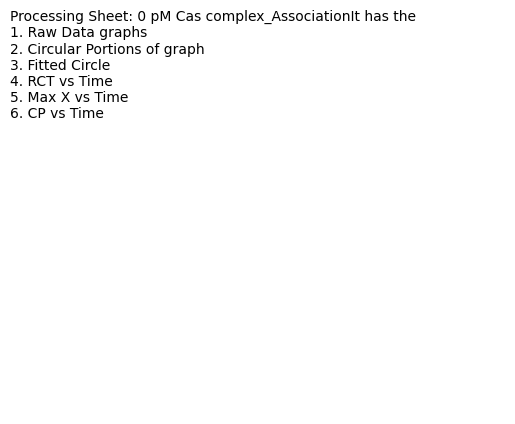

<Figure size 1500x1000 with 0 Axes>

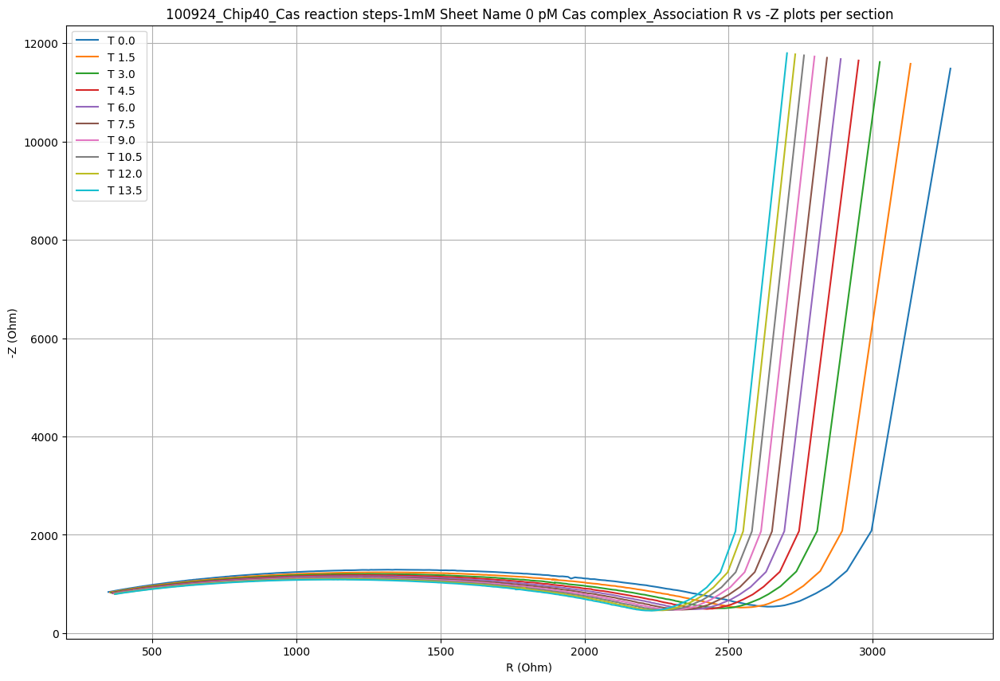

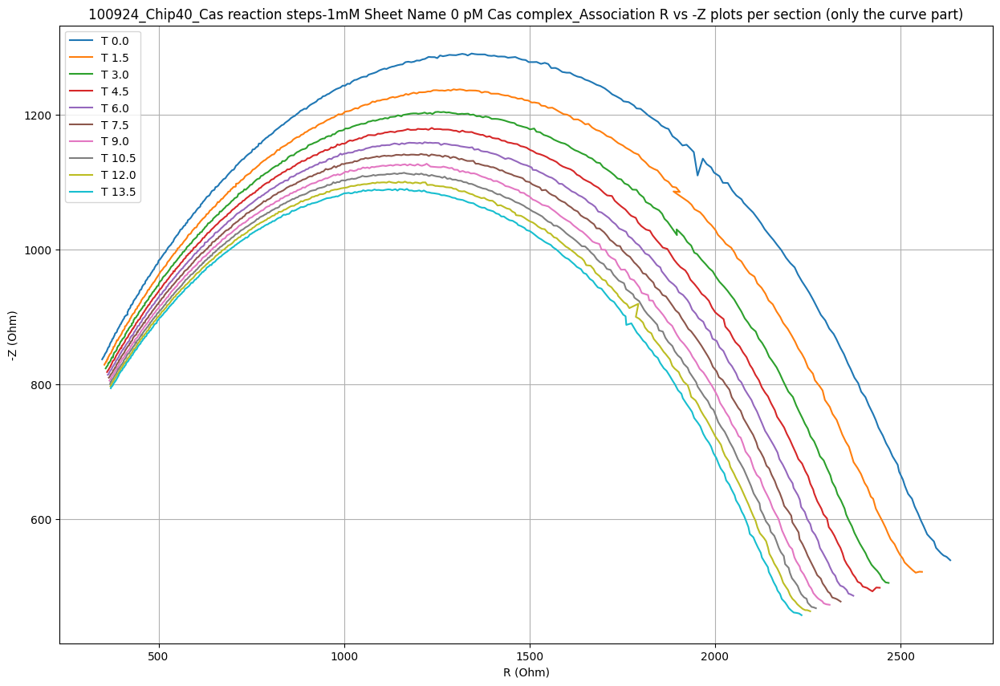

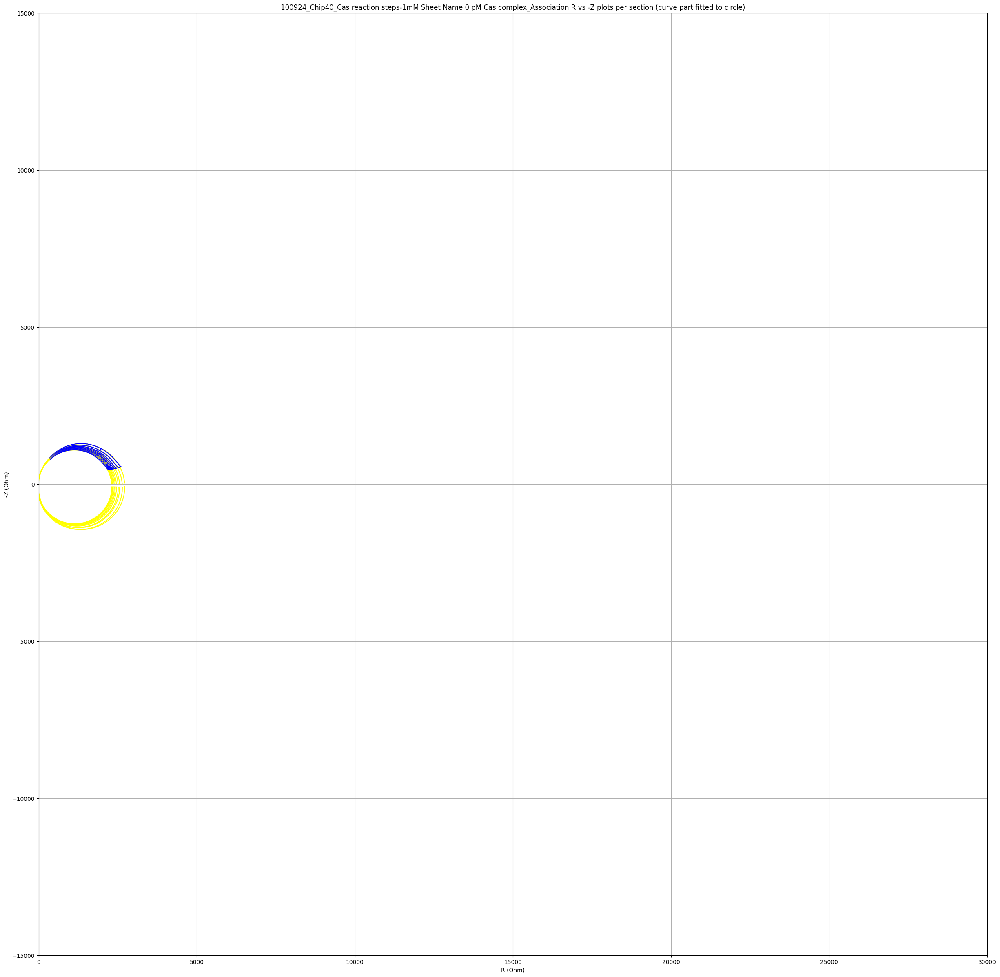

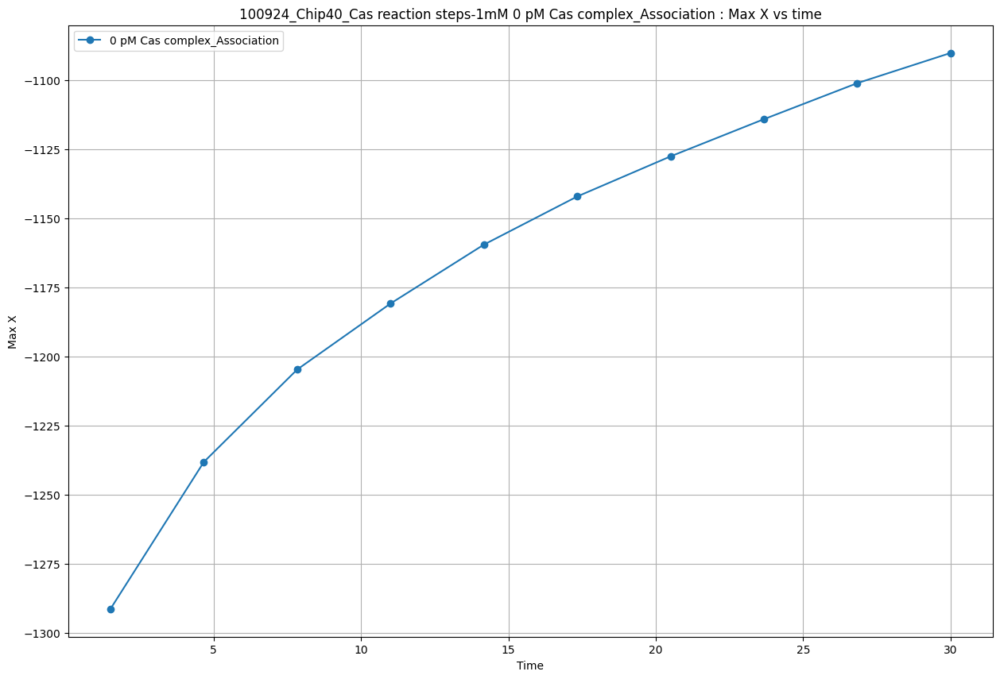

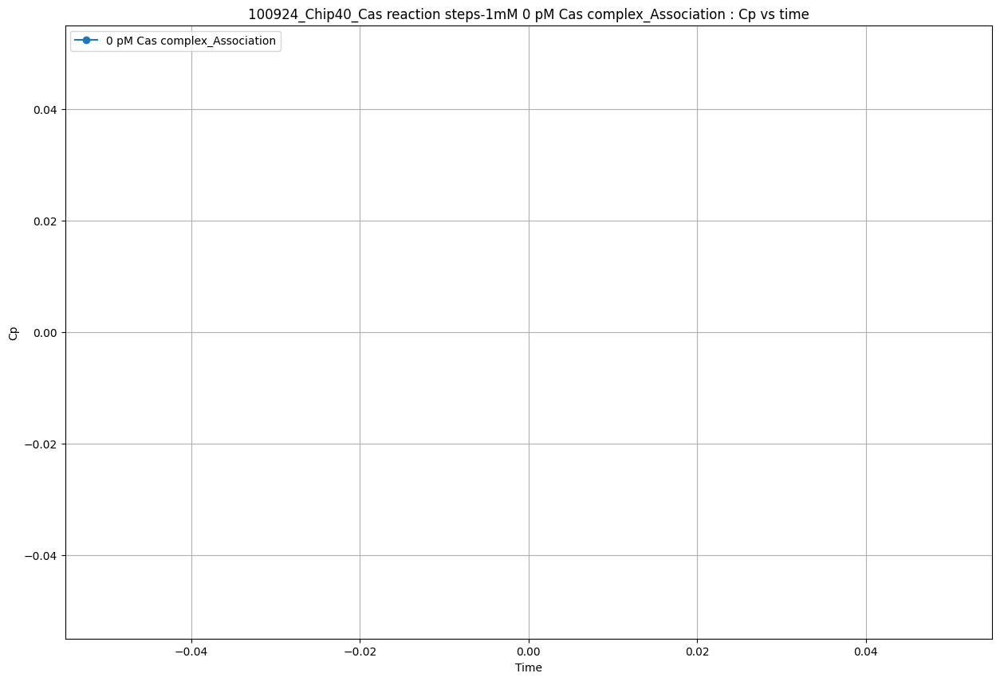

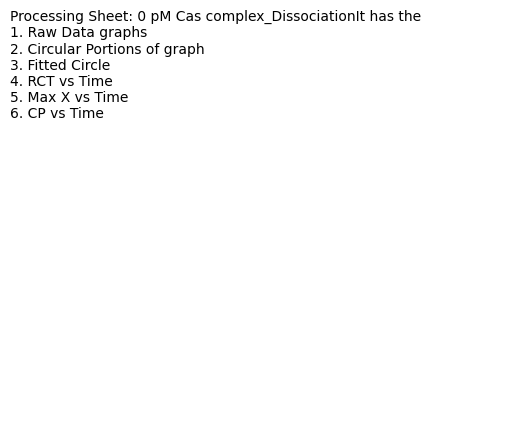

<Figure size 1500x1000 with 0 Axes>

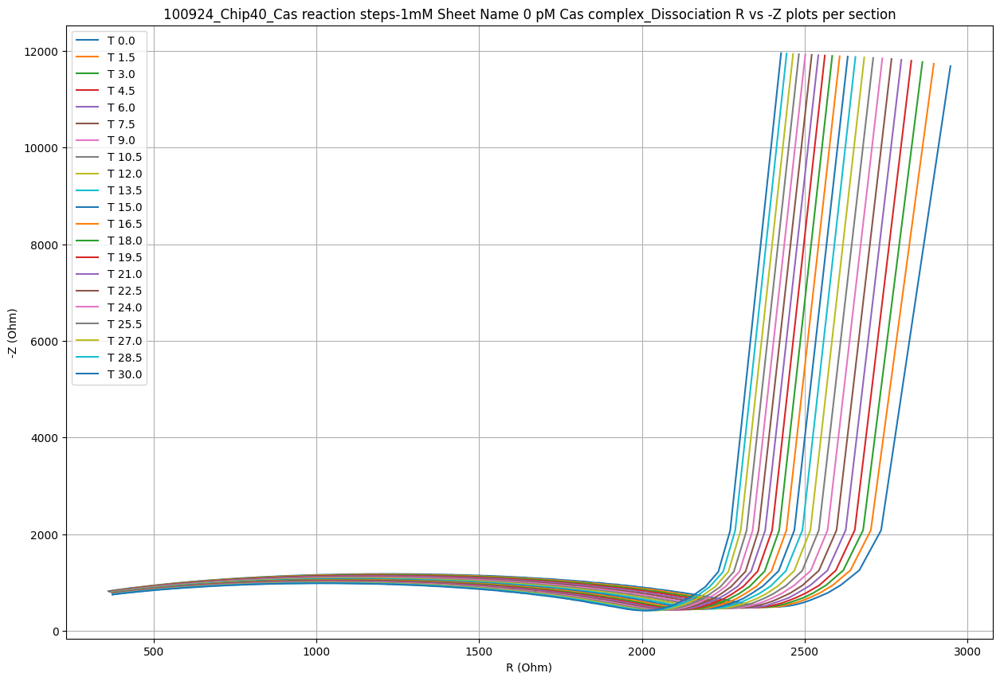

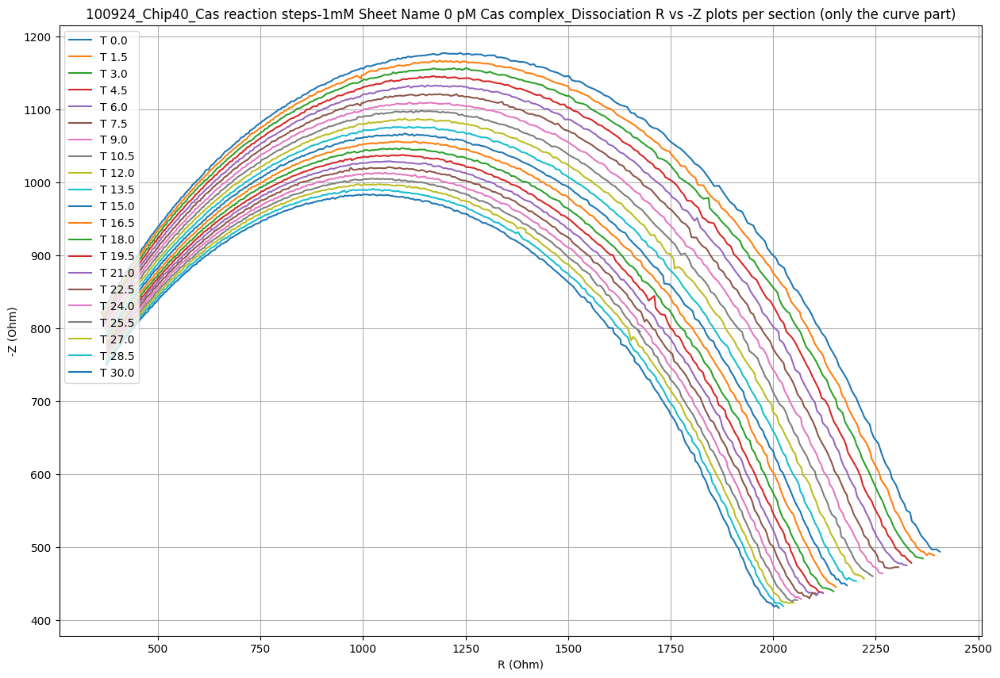

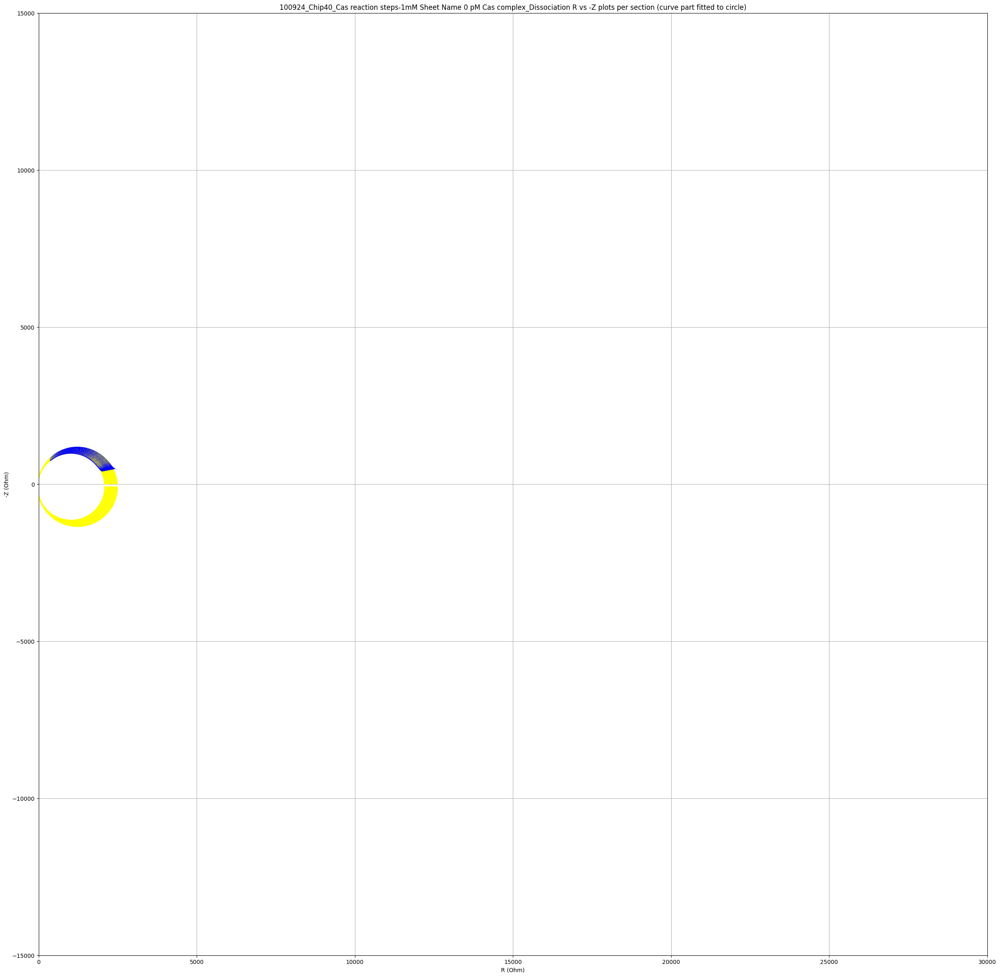

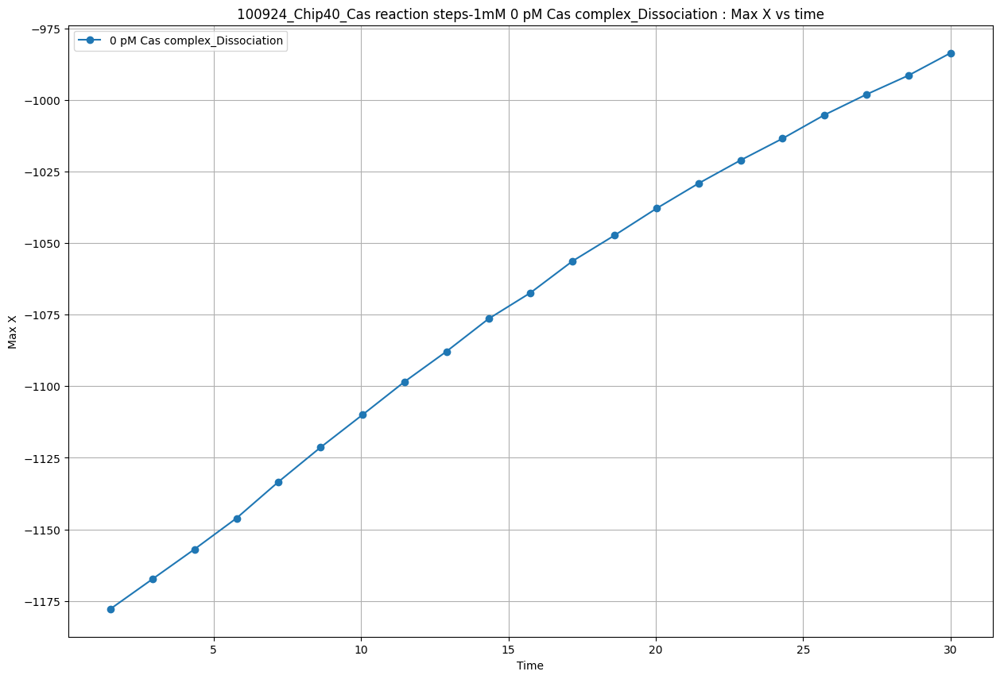

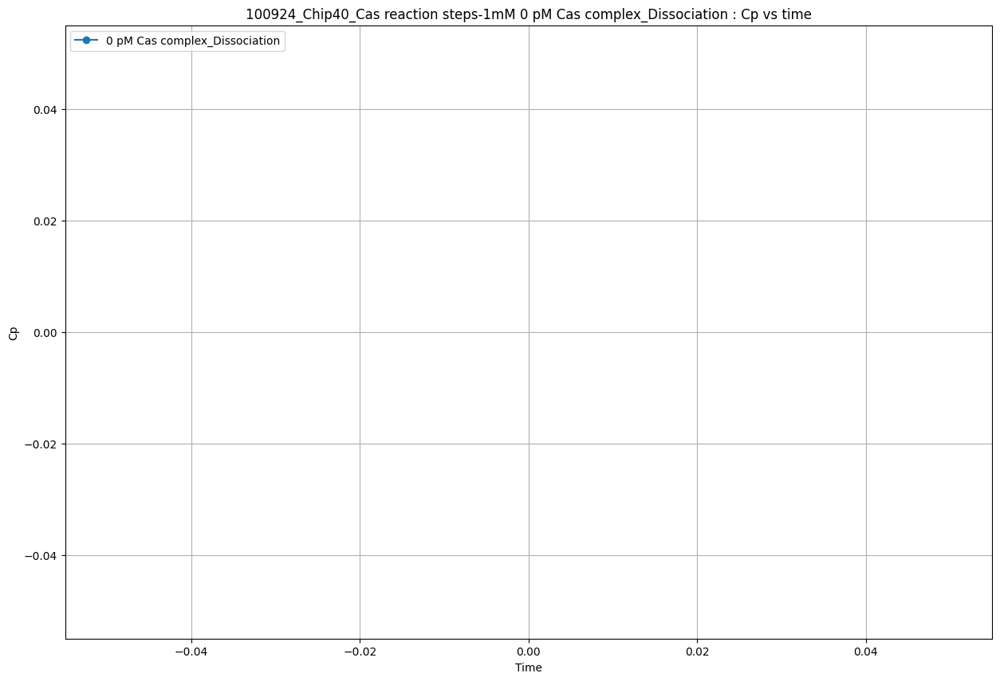

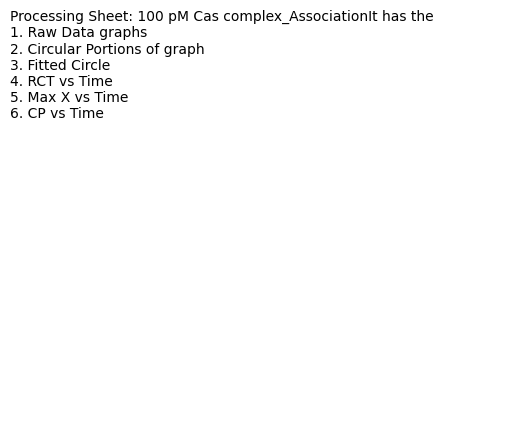

<Figure size 1500x1000 with 0 Axes>

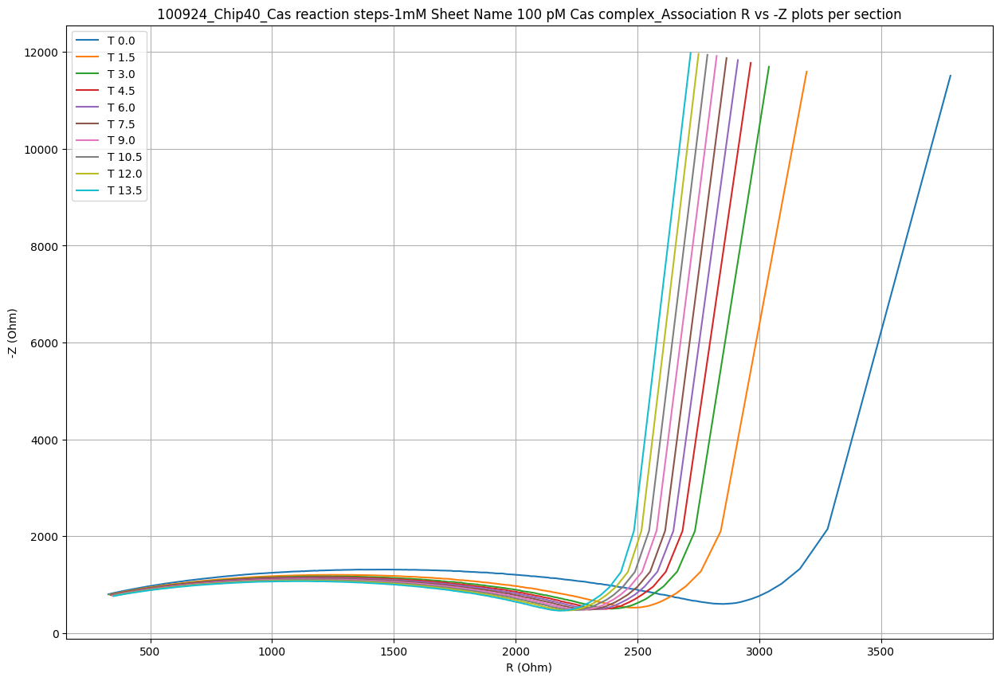

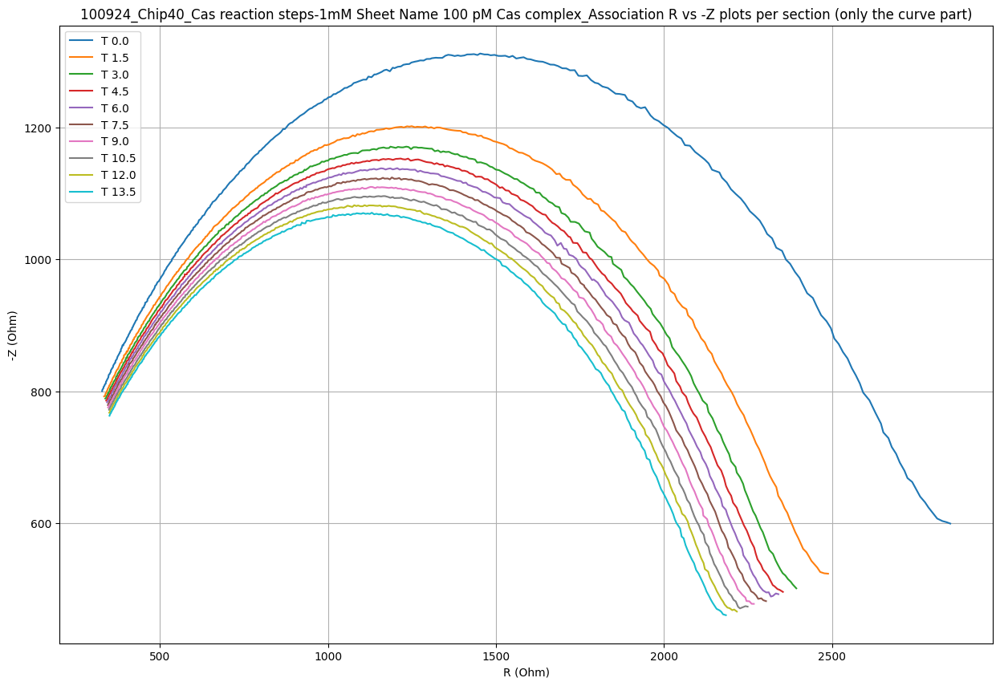

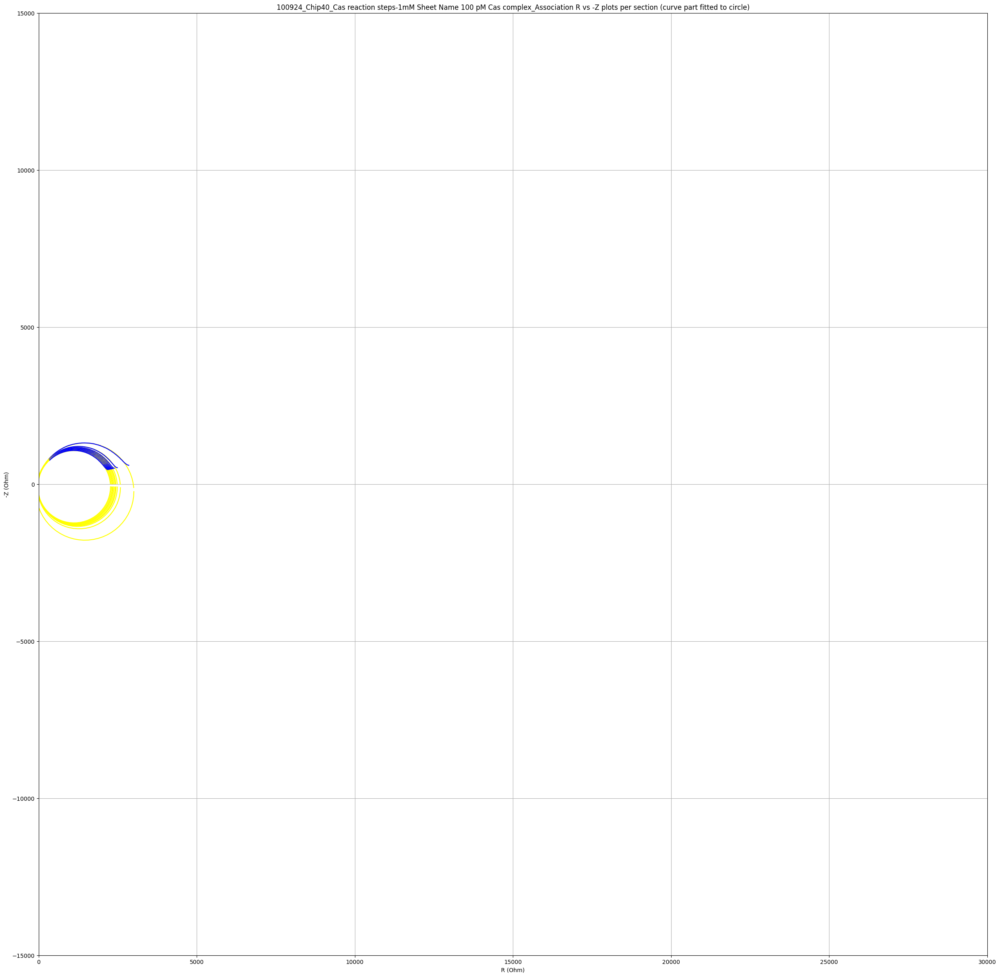

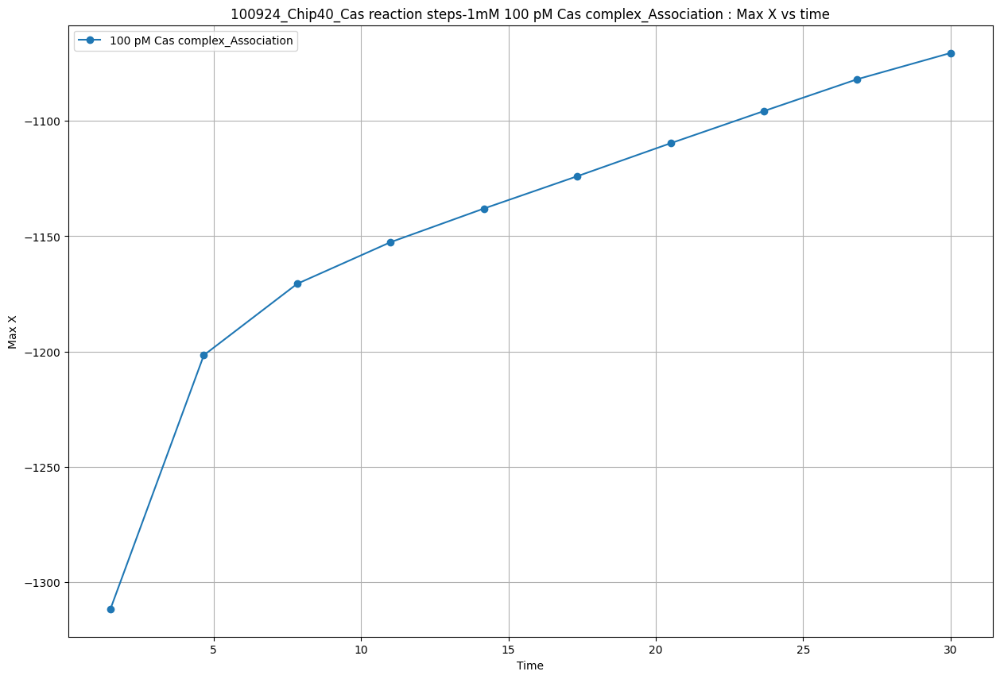

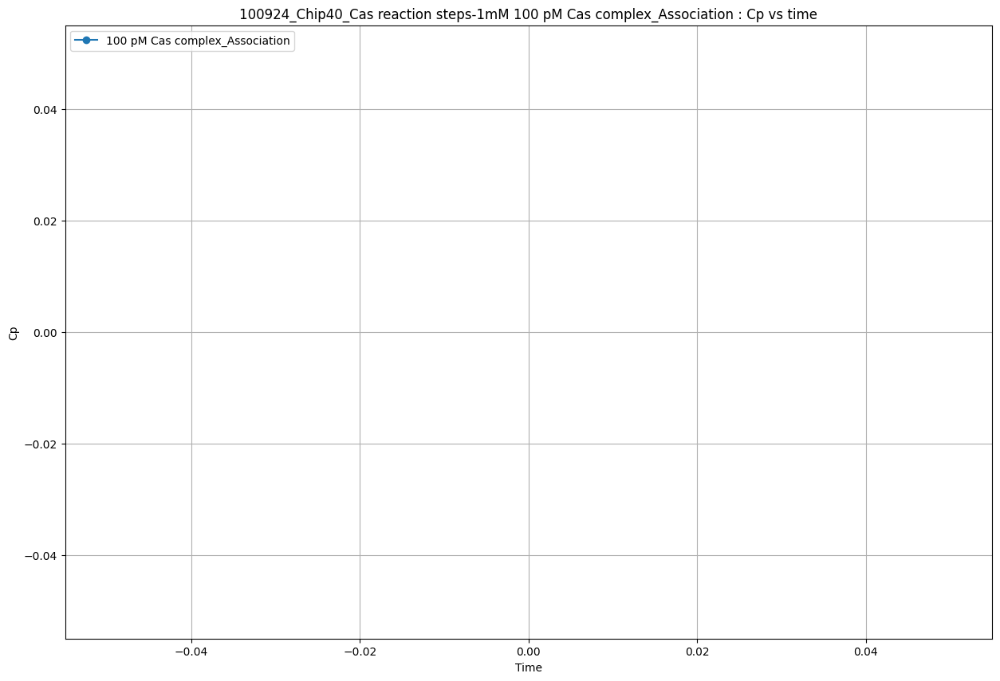

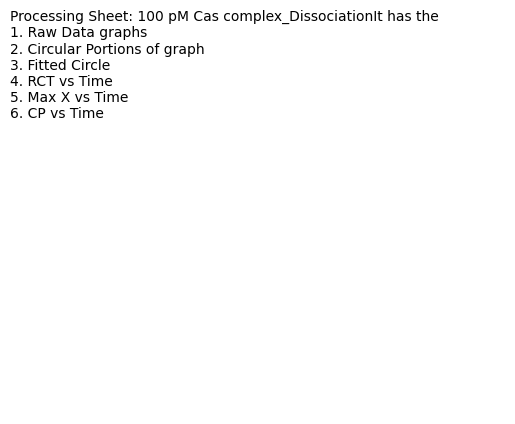

<Figure size 1500x1000 with 0 Axes>

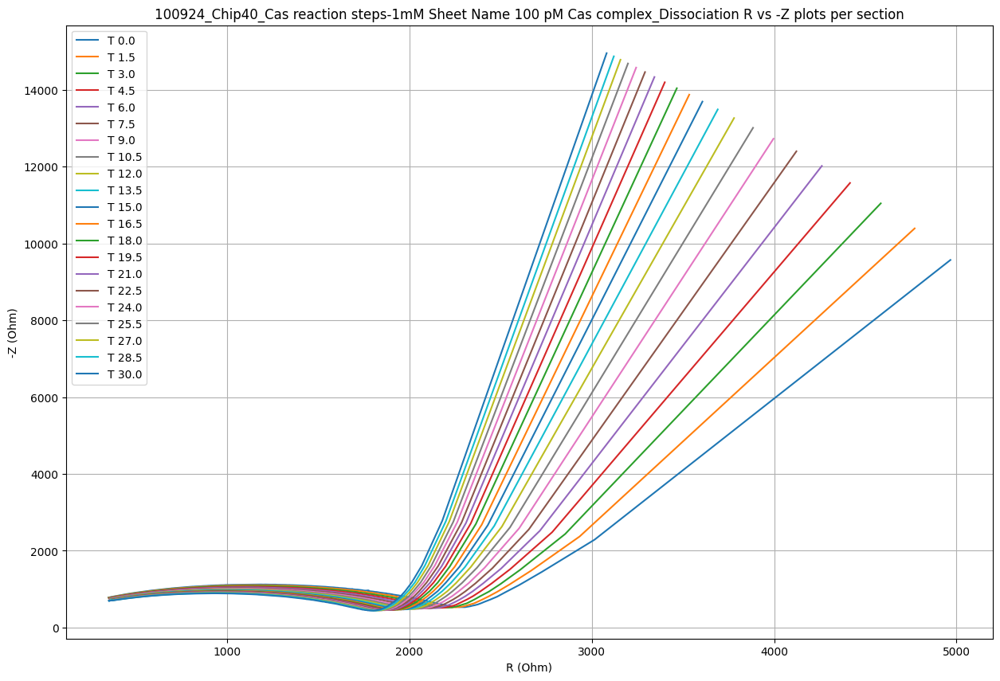

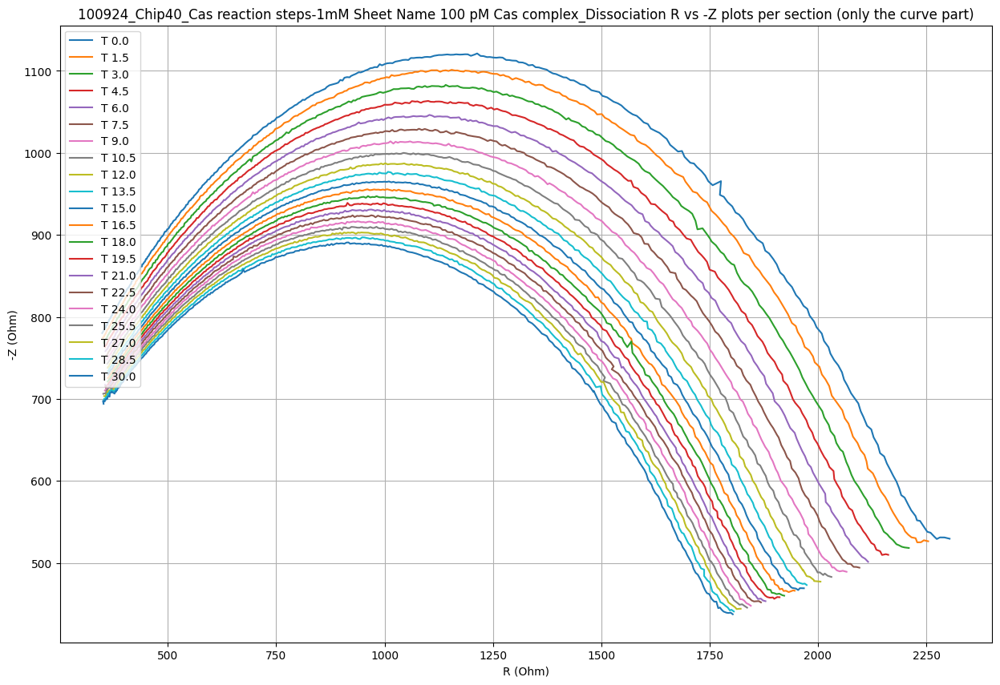

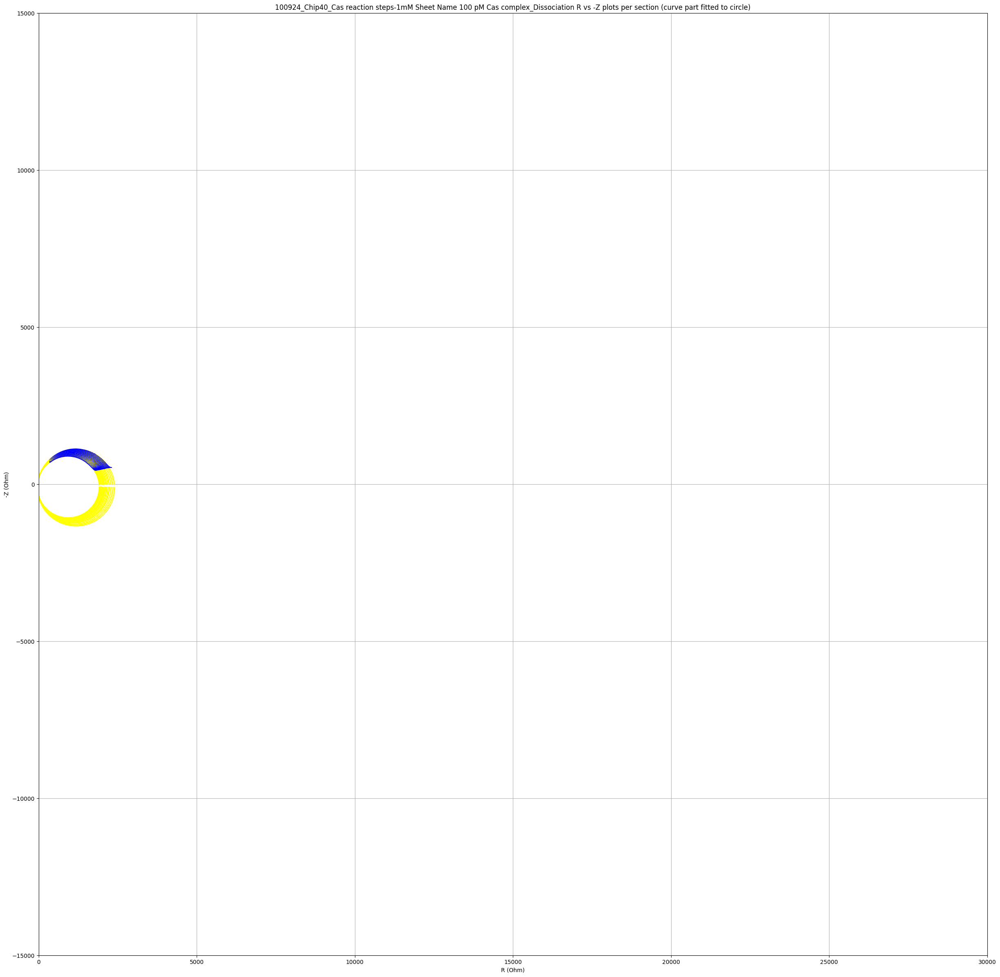

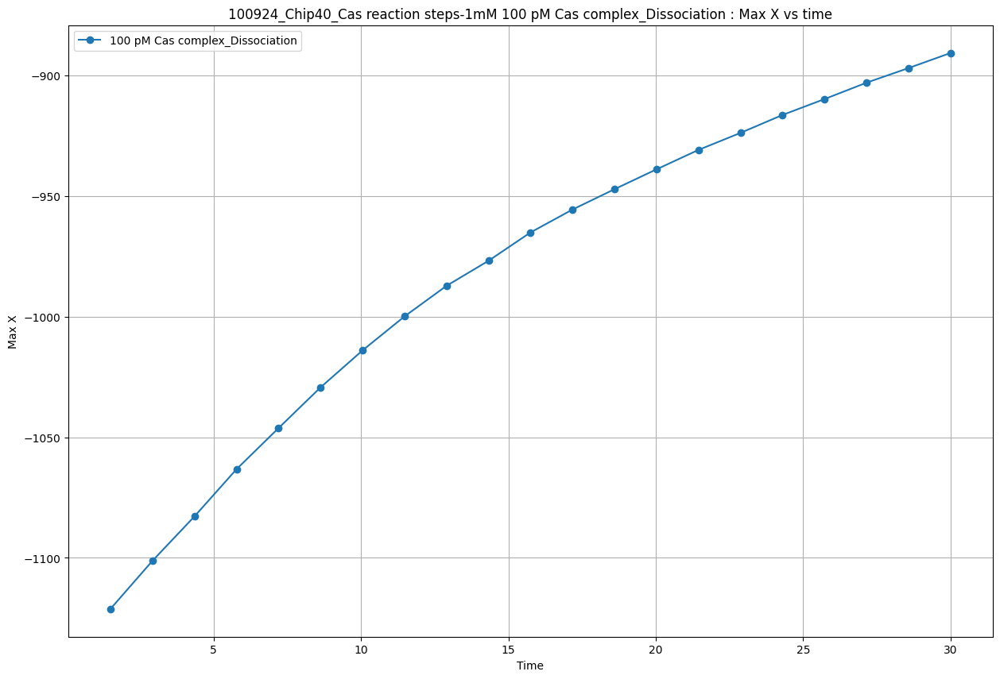

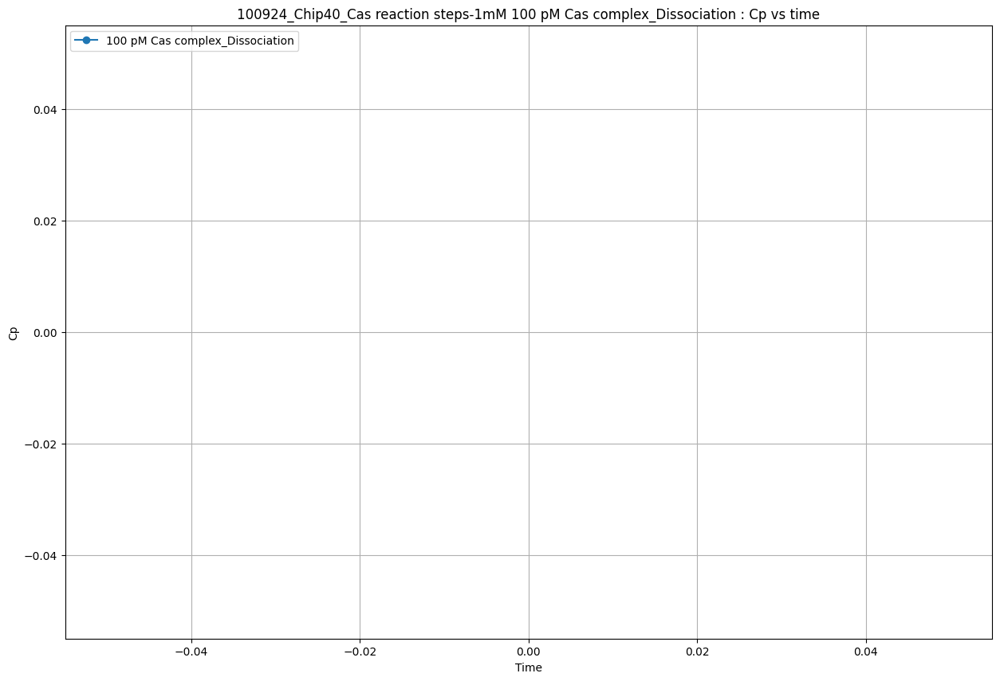

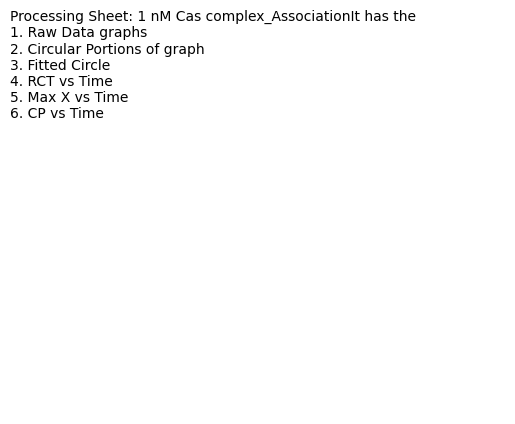

<Figure size 1500x1000 with 0 Axes>

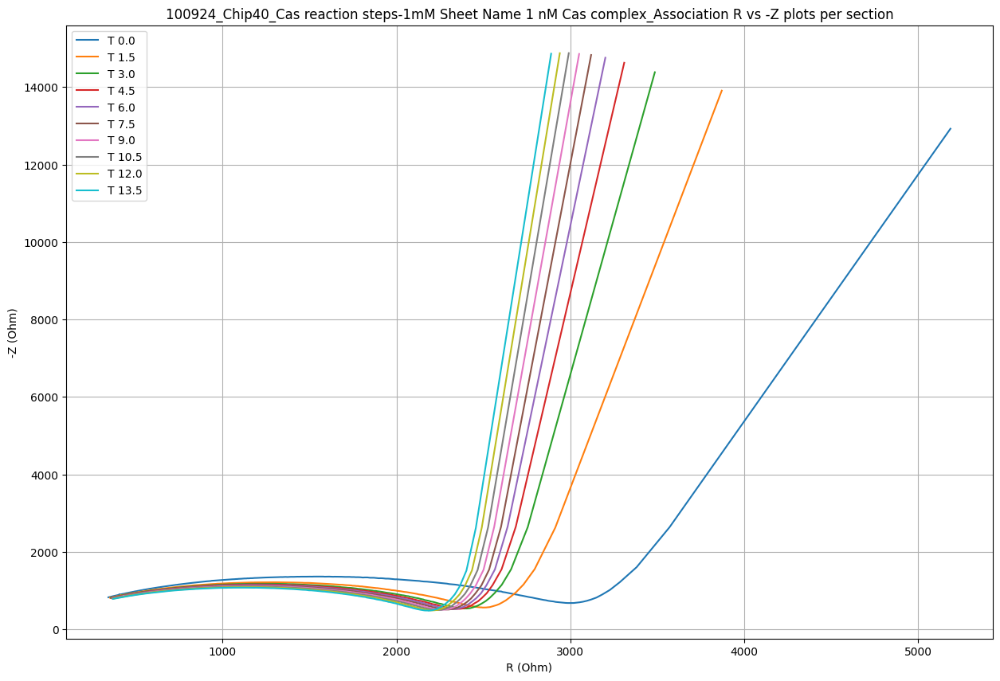

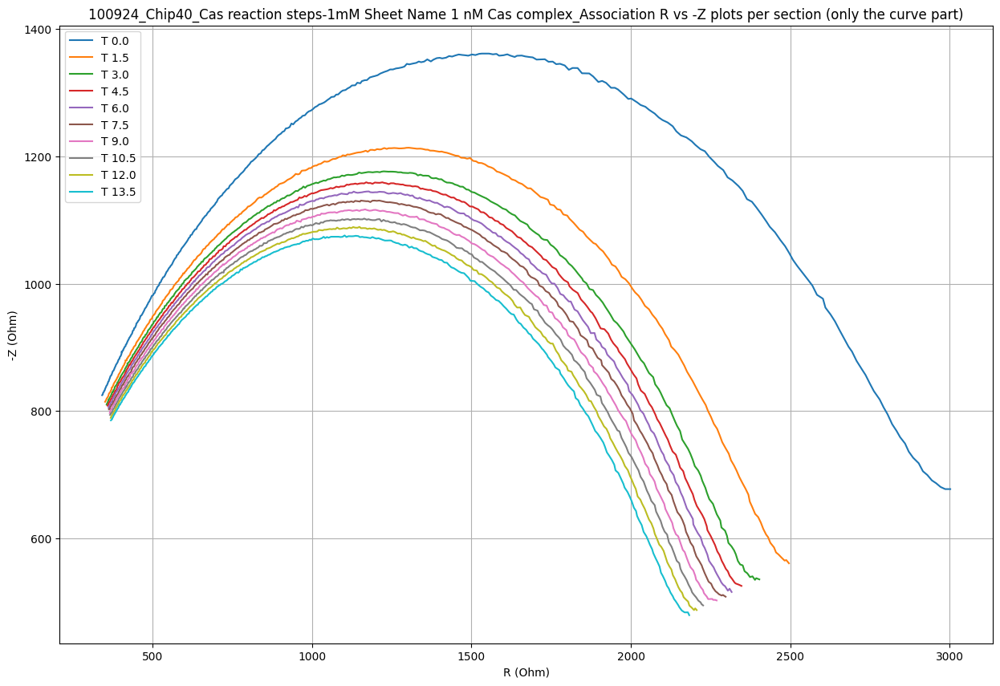

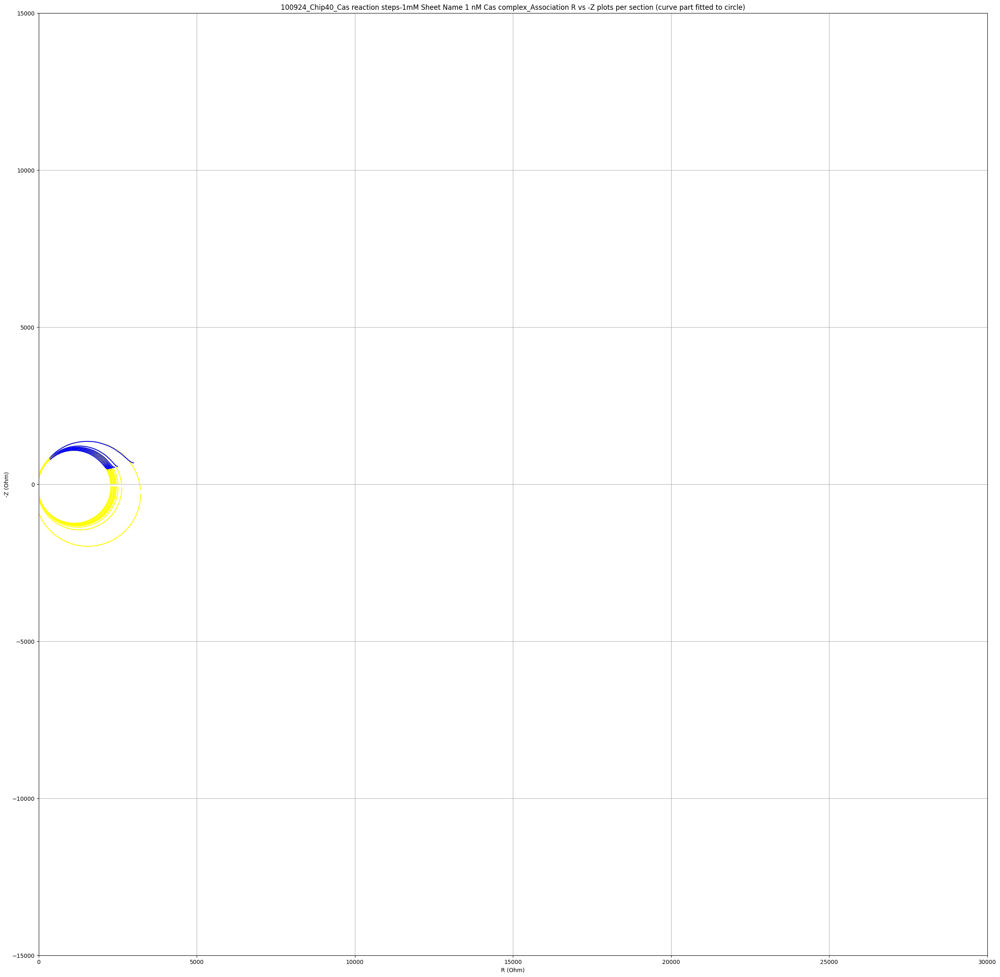

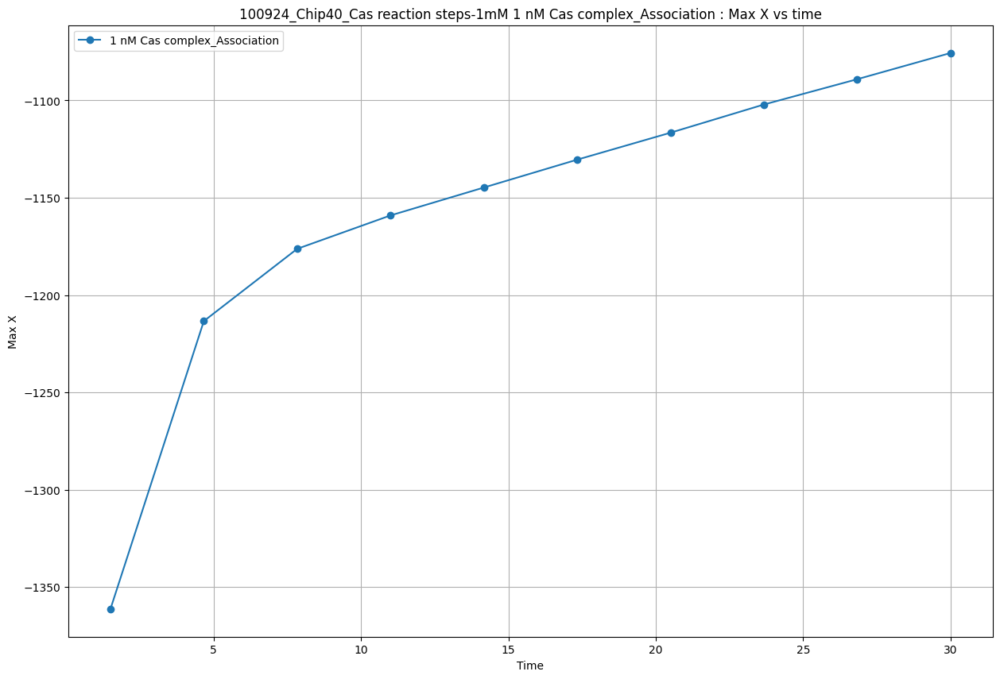

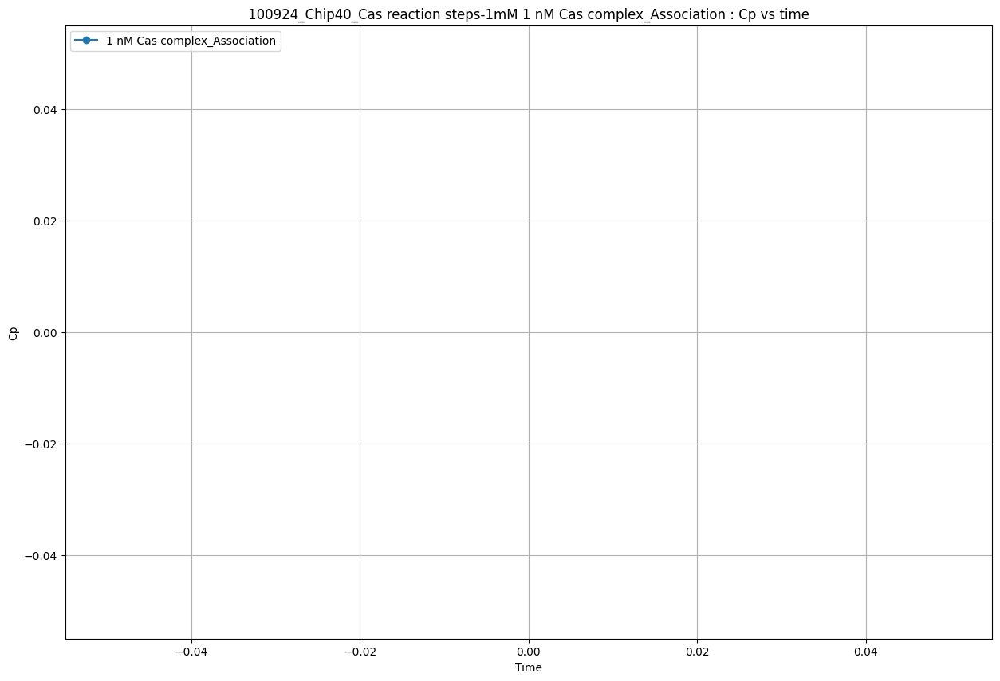

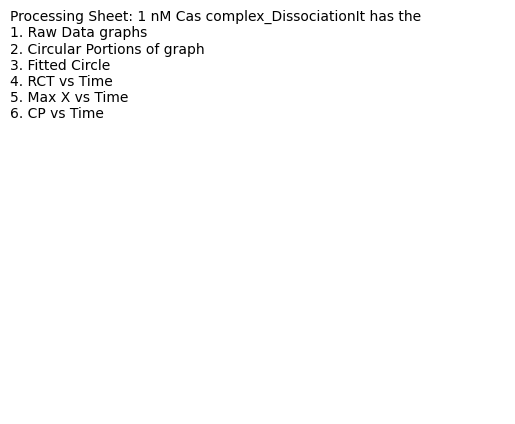

<Figure size 1500x1000 with 0 Axes>

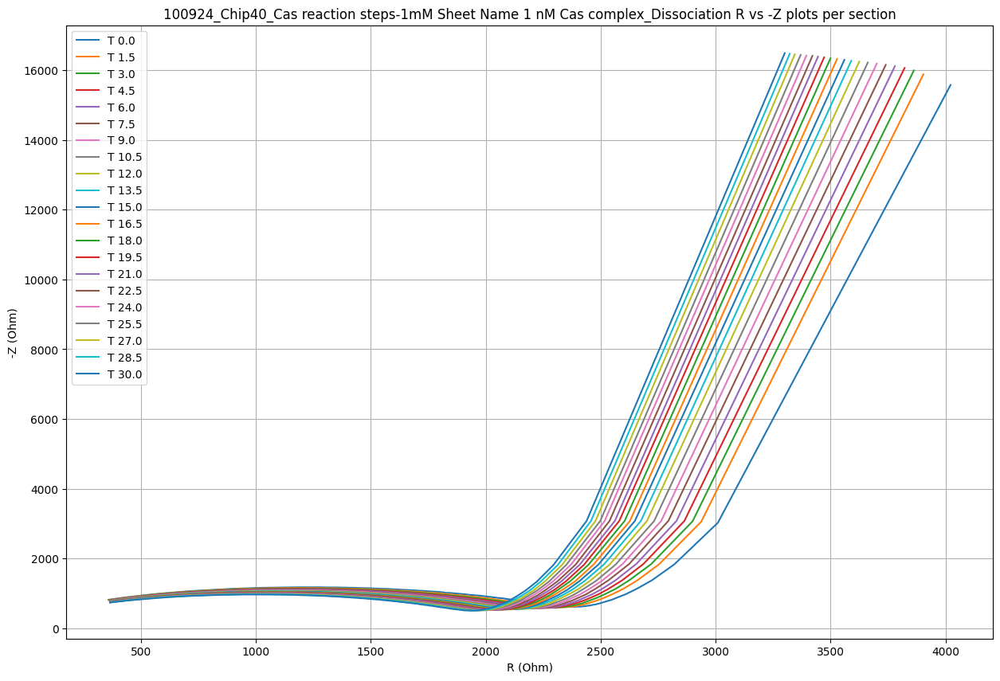

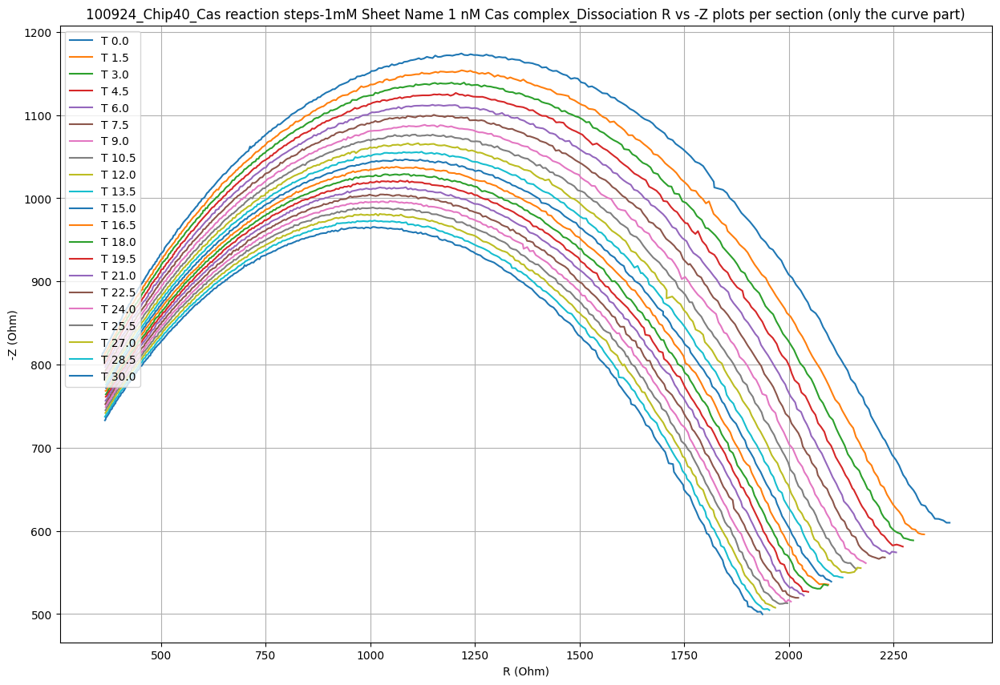

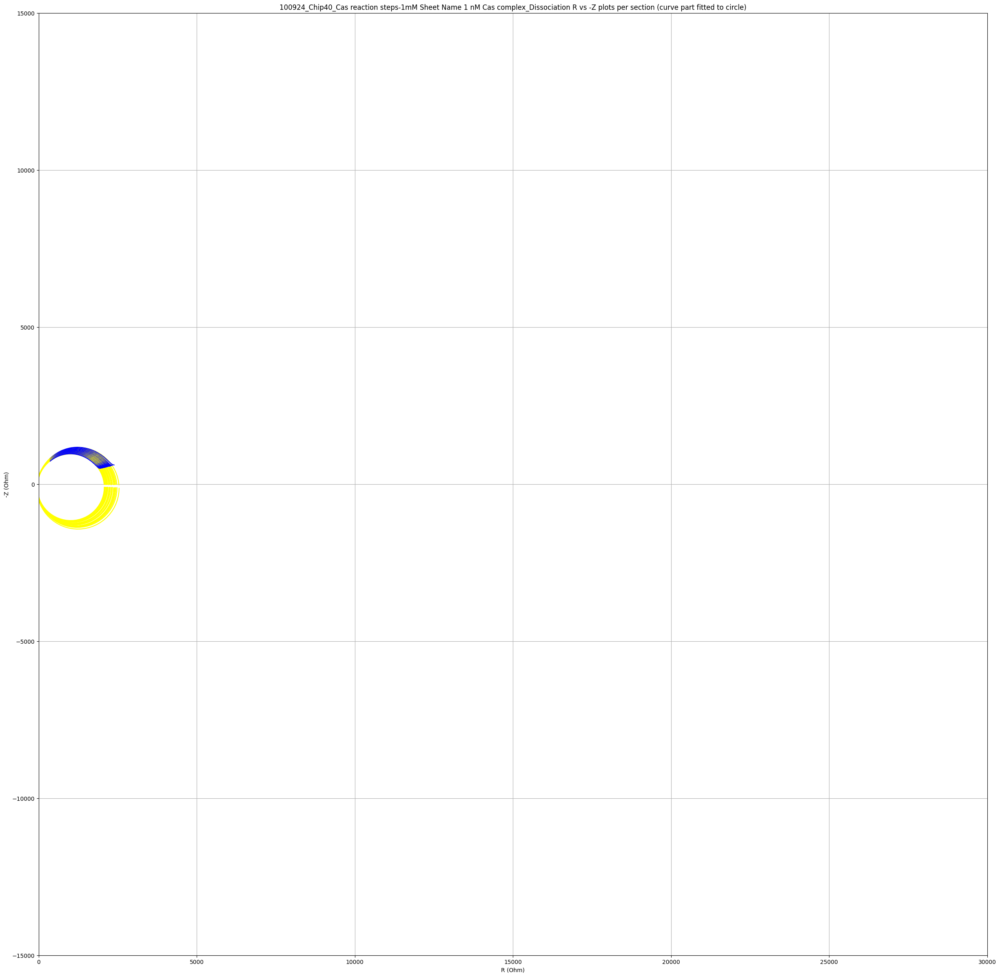

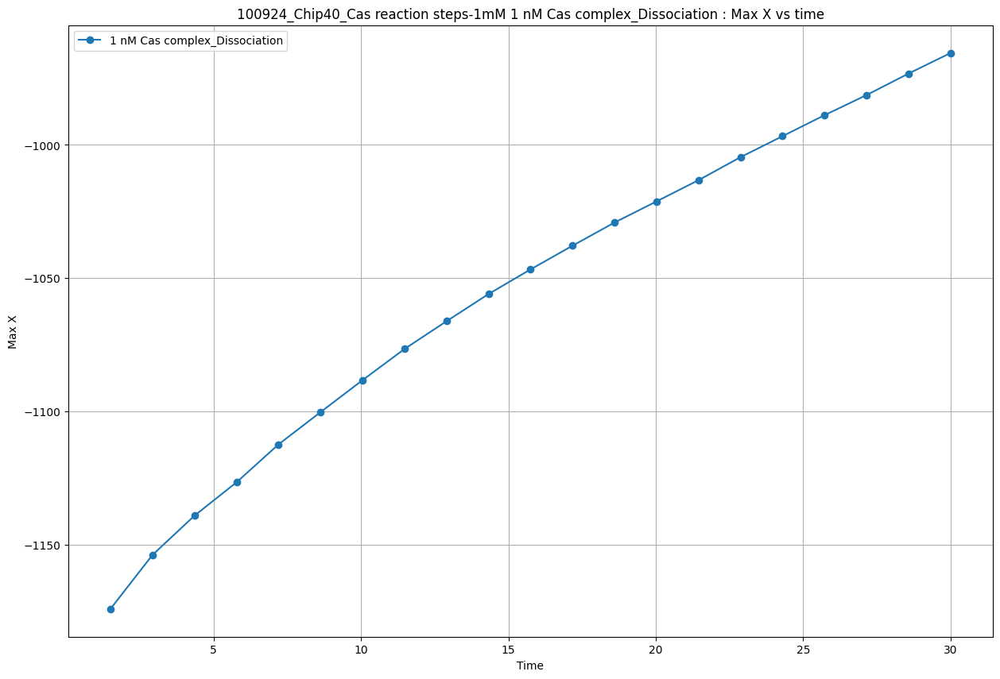

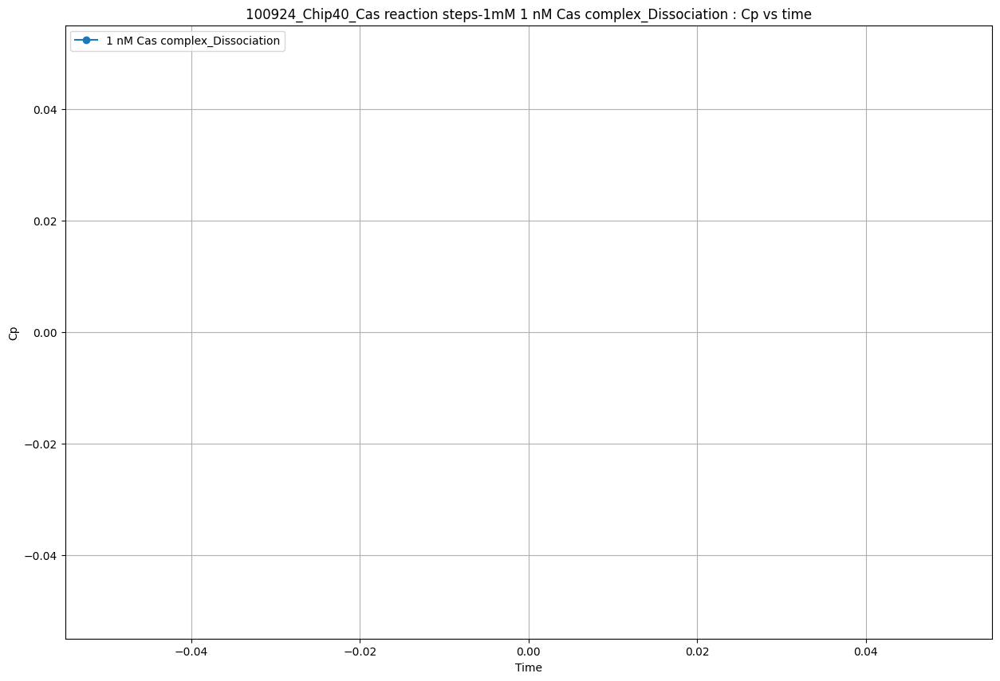

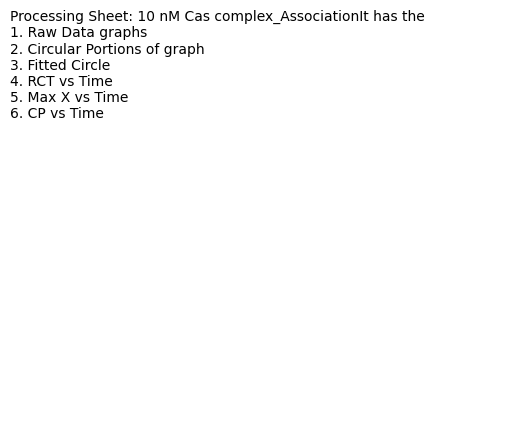

<Figure size 1500x1000 with 0 Axes>

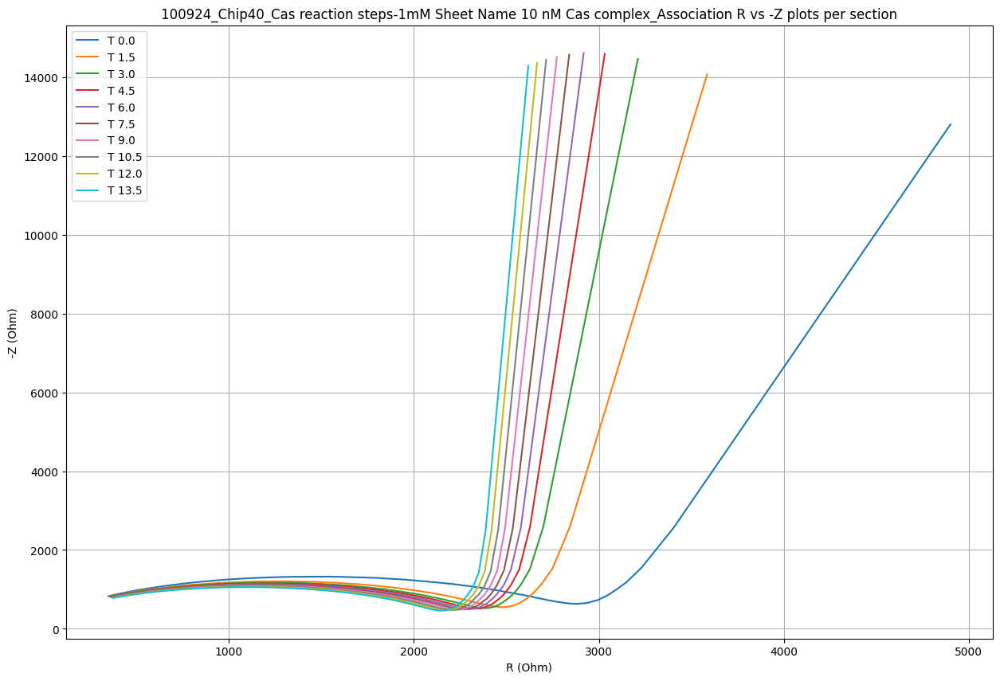

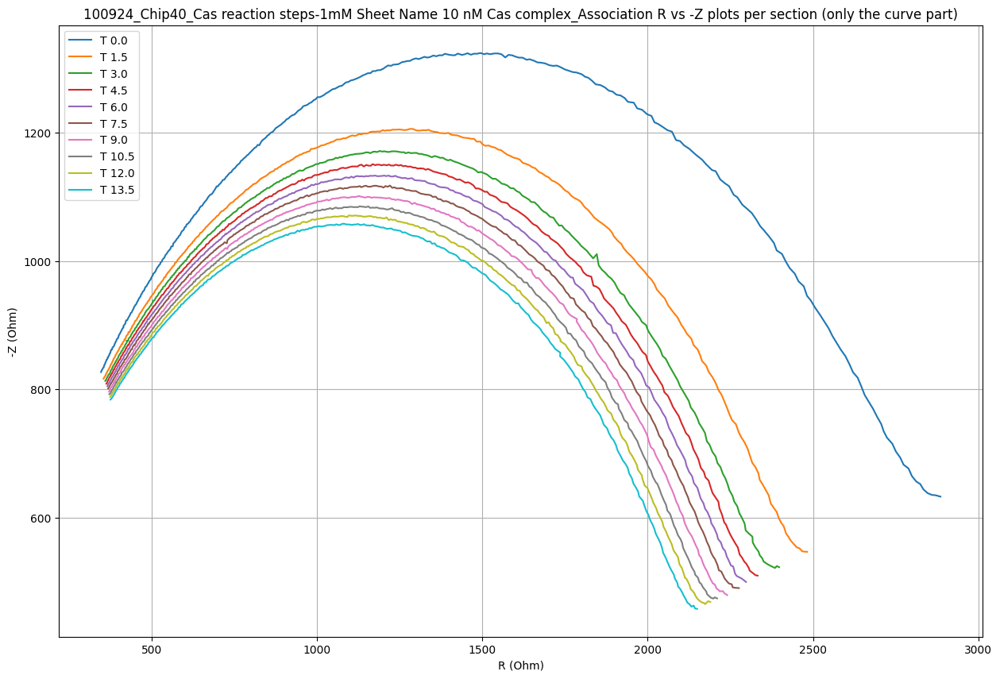

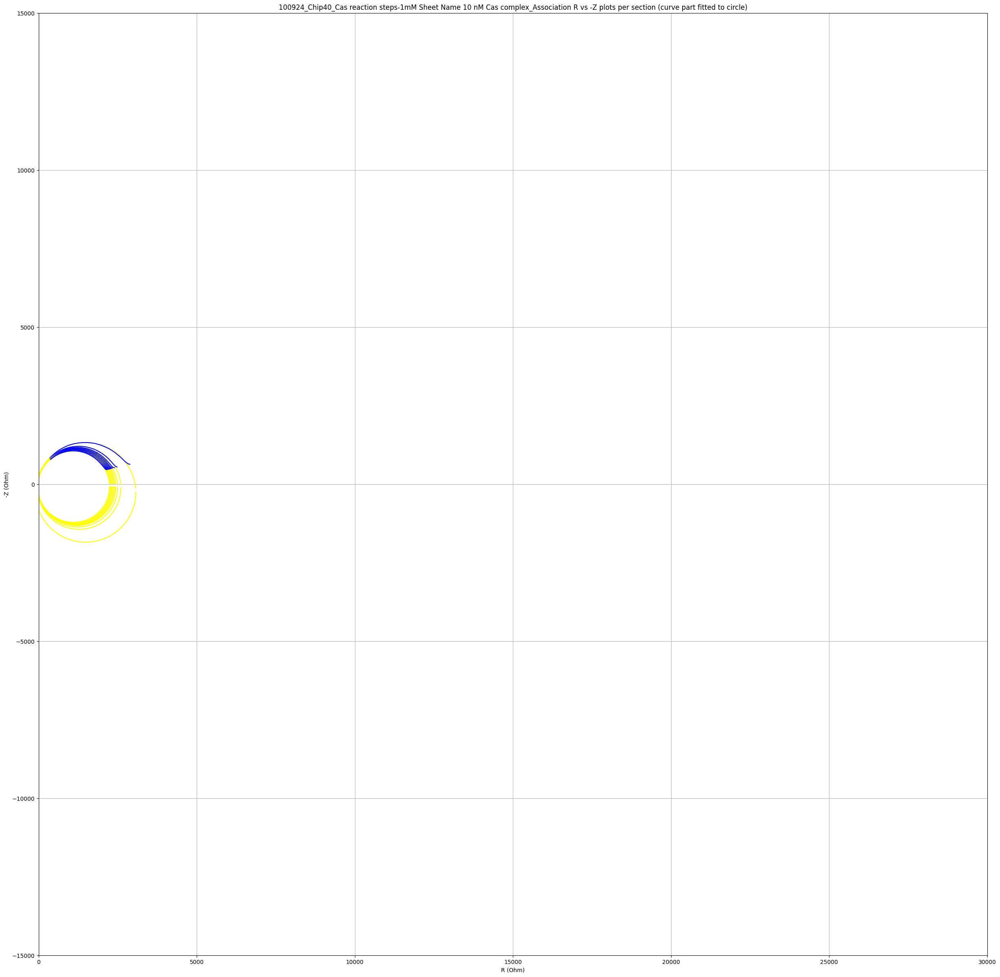

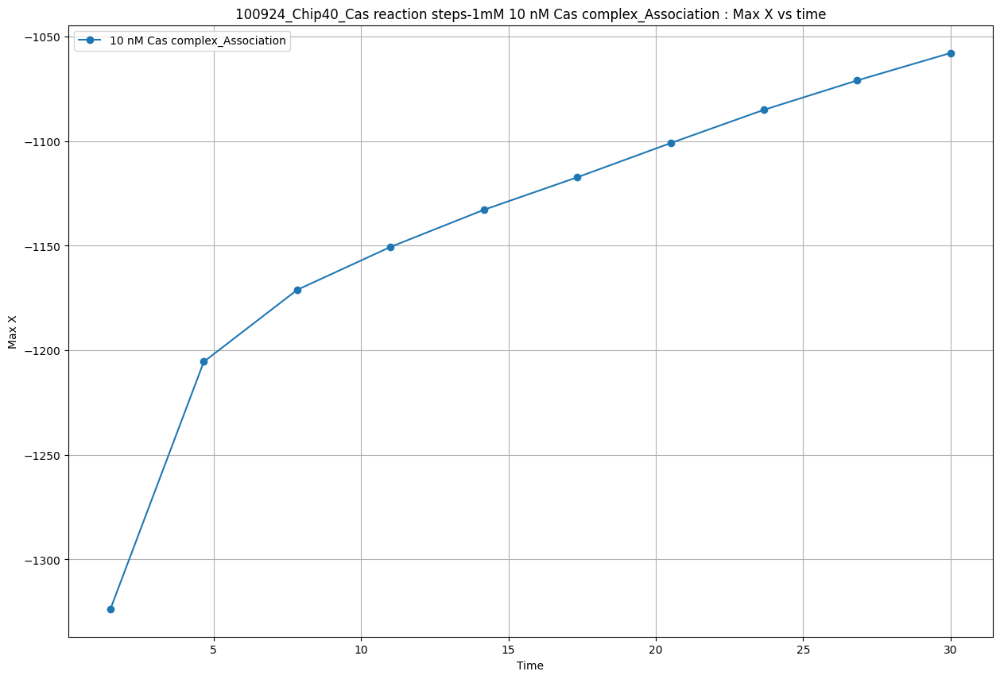

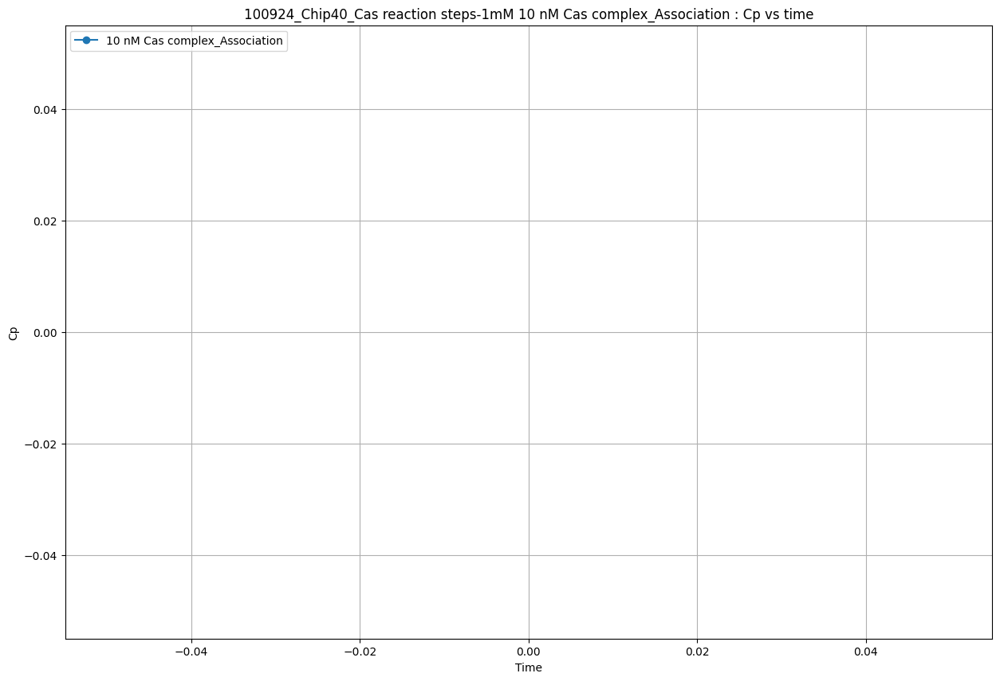

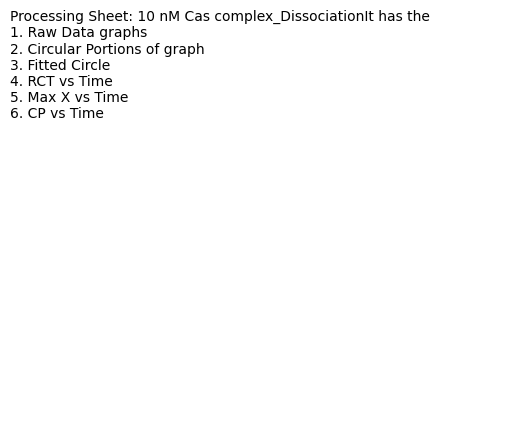

<Figure size 1500x1000 with 0 Axes>

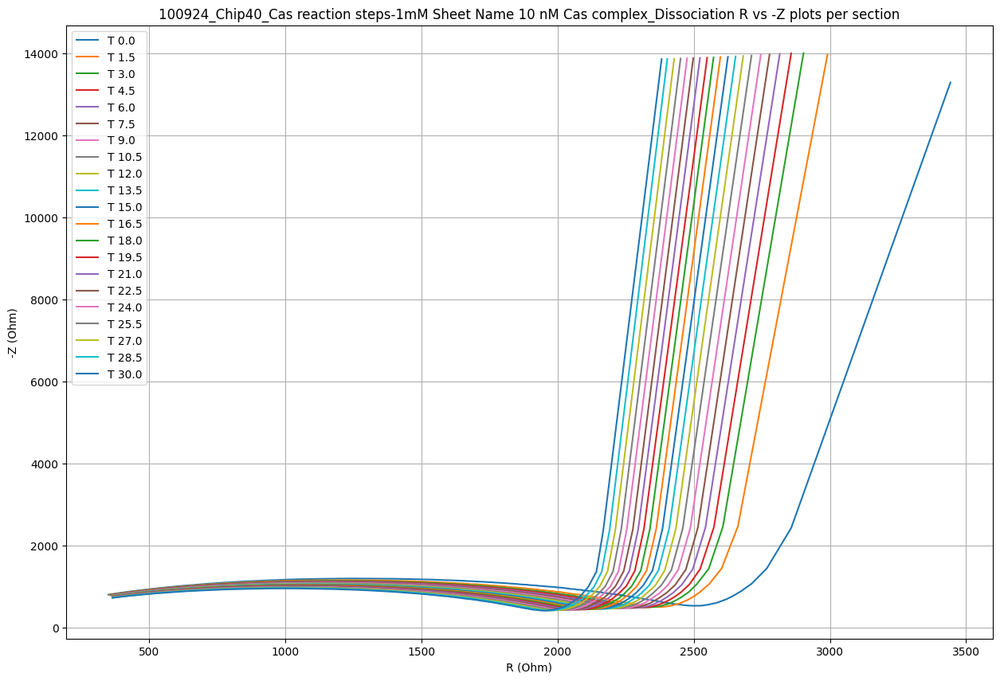

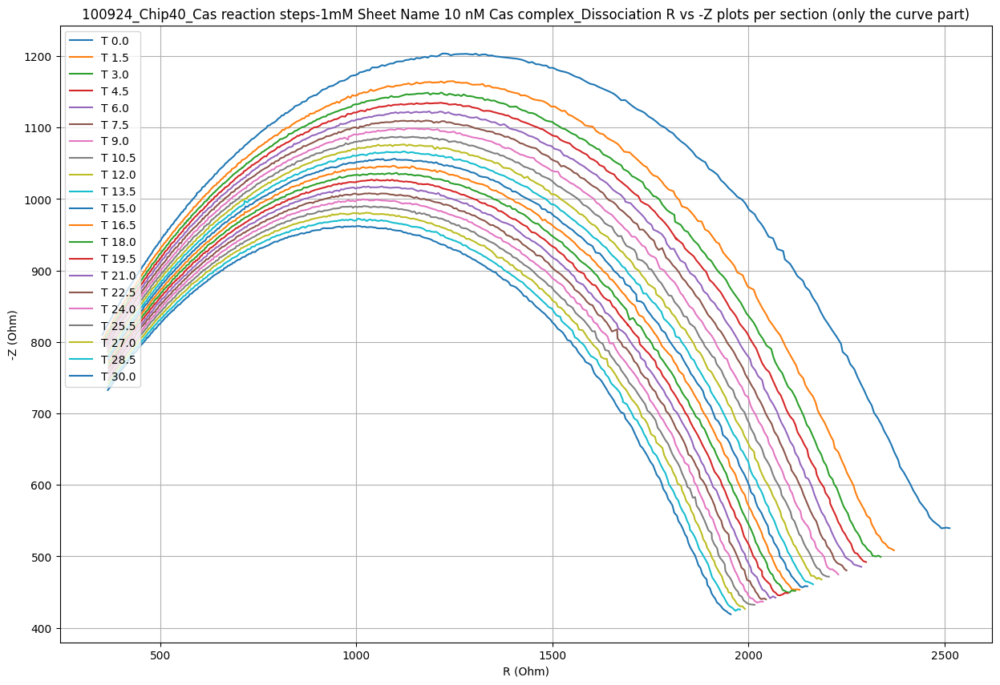

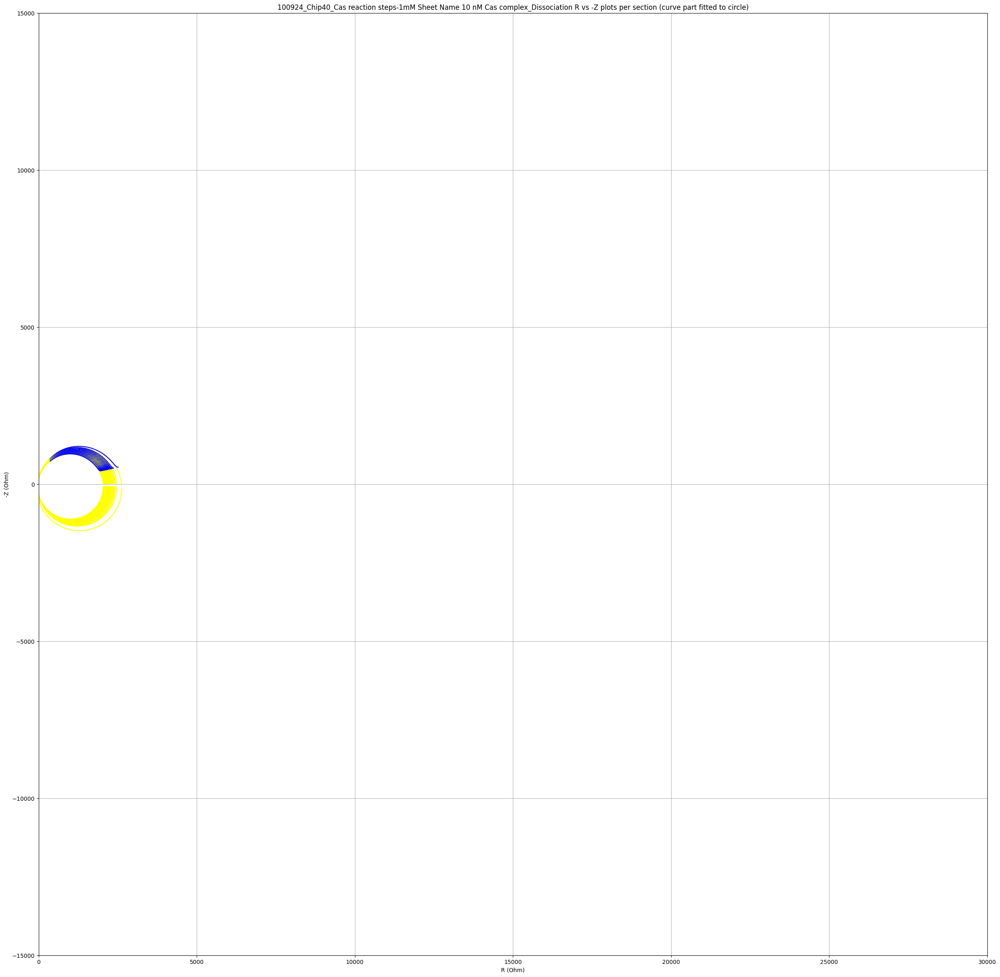

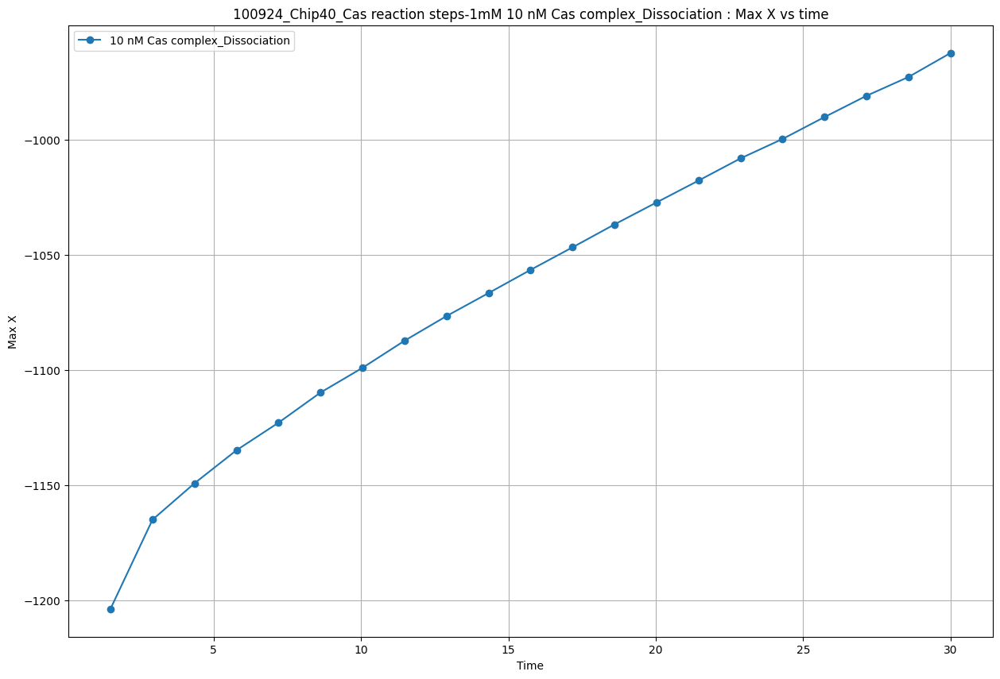

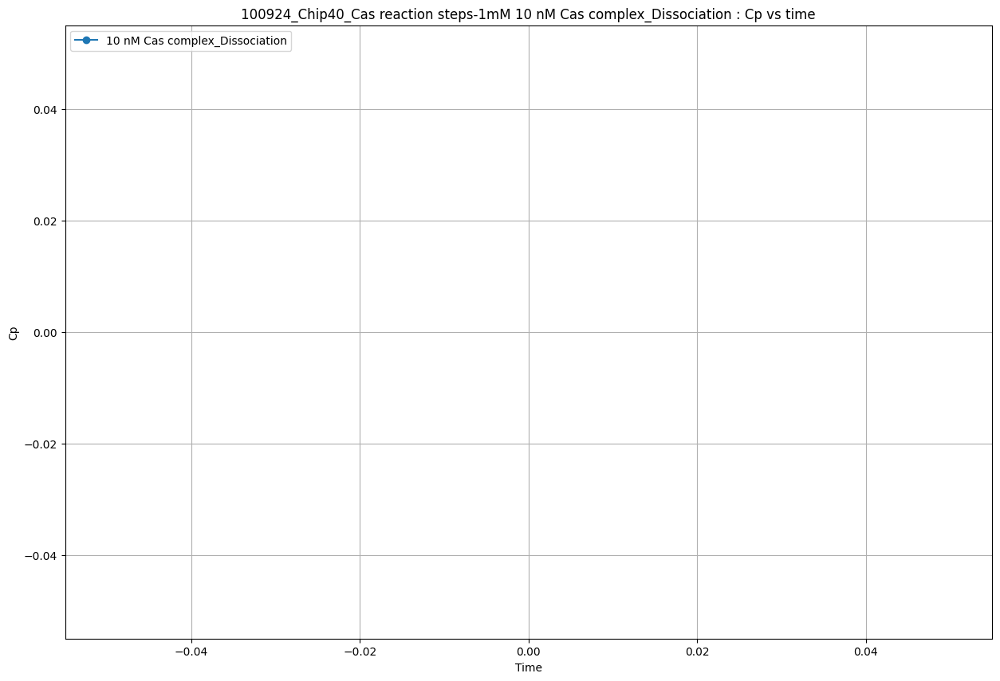

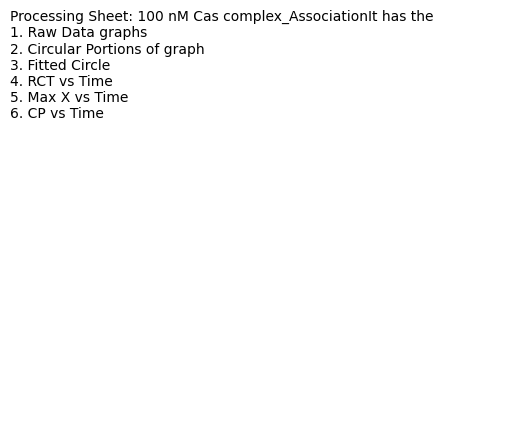

<Figure size 1500x1000 with 0 Axes>

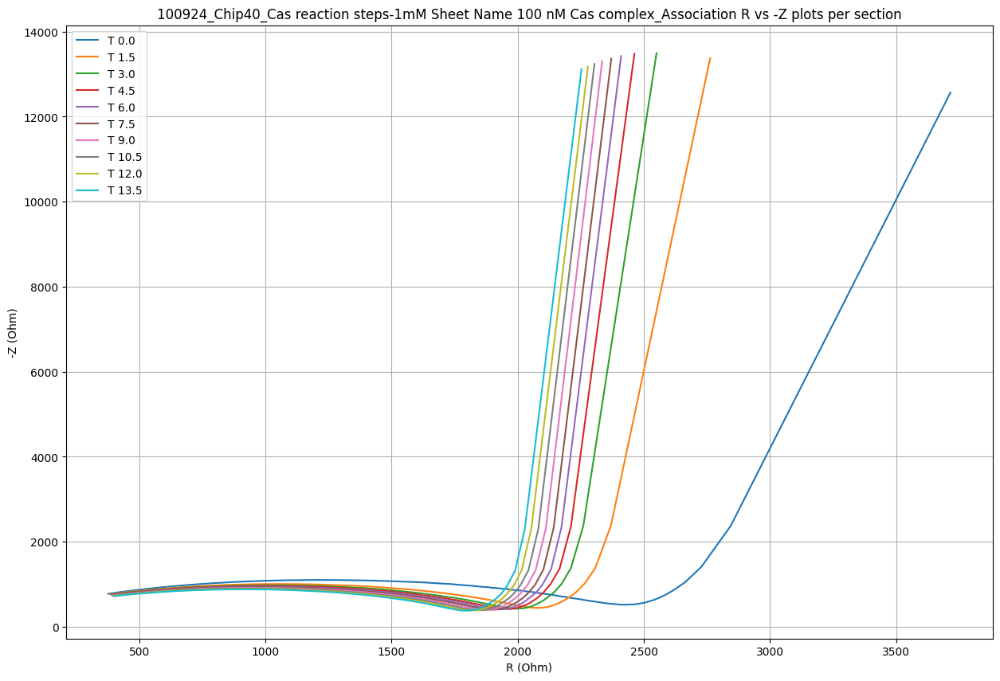

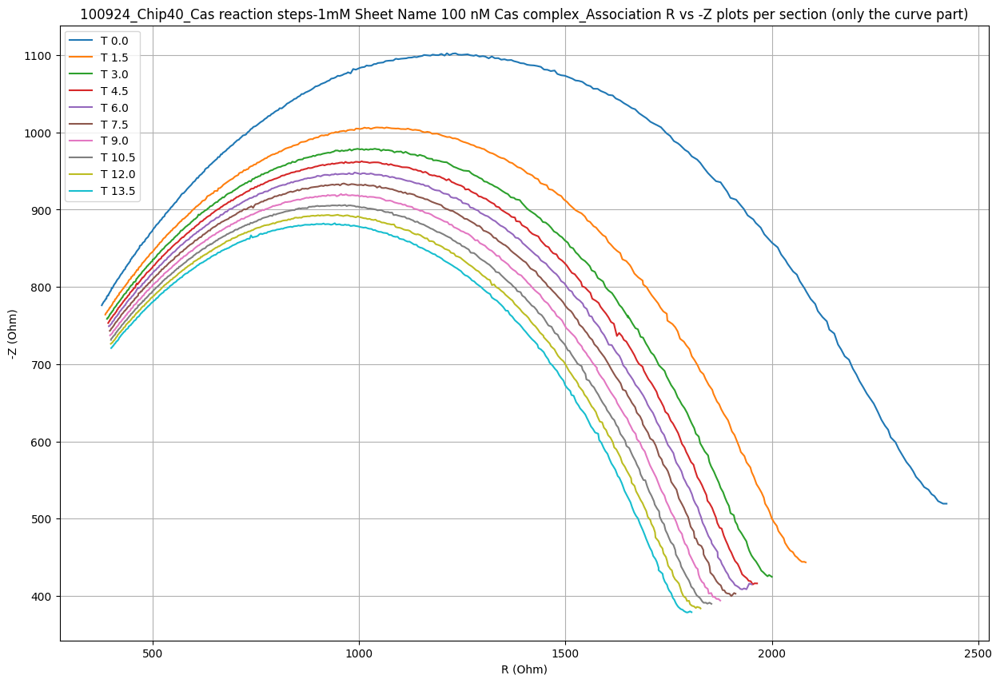

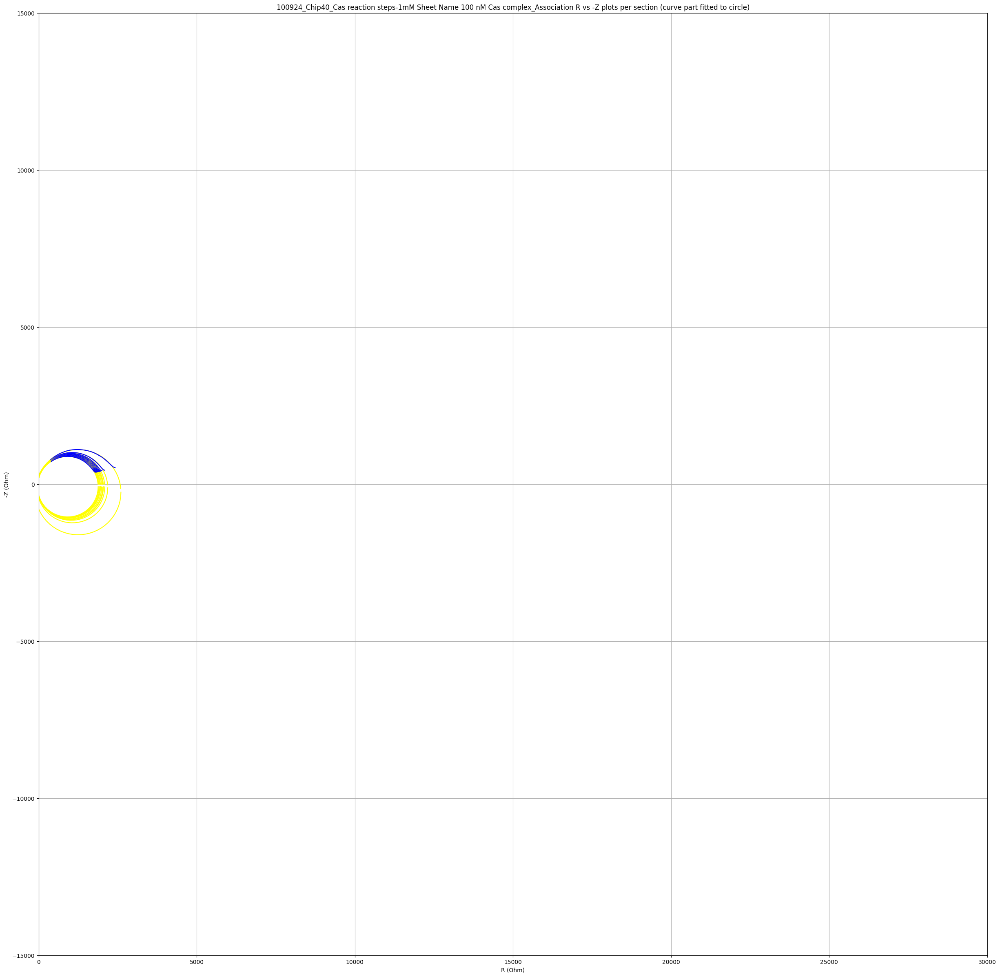

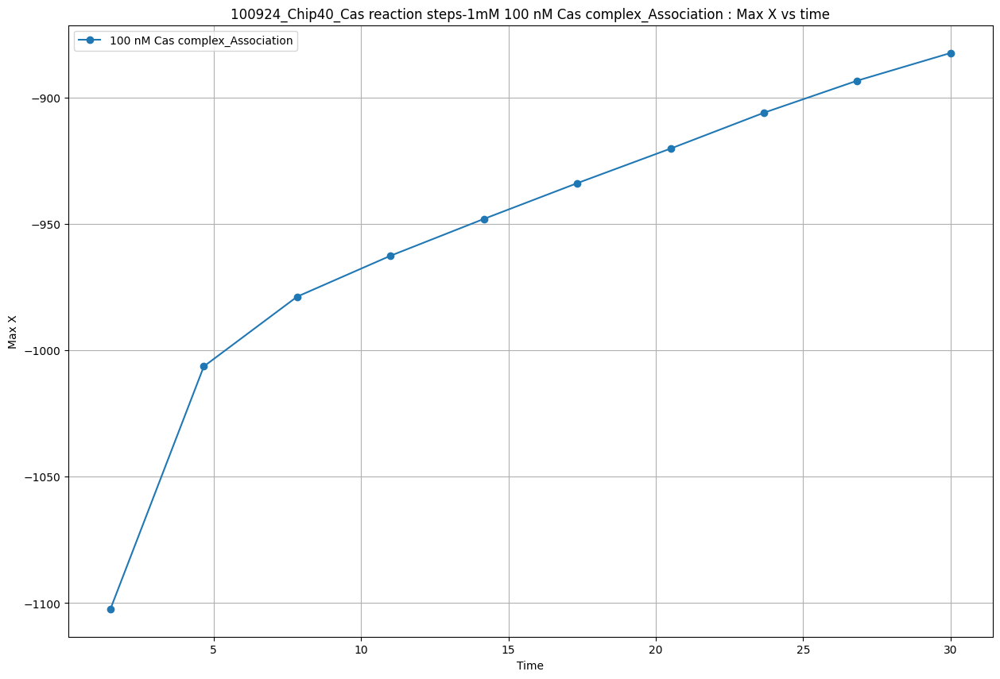

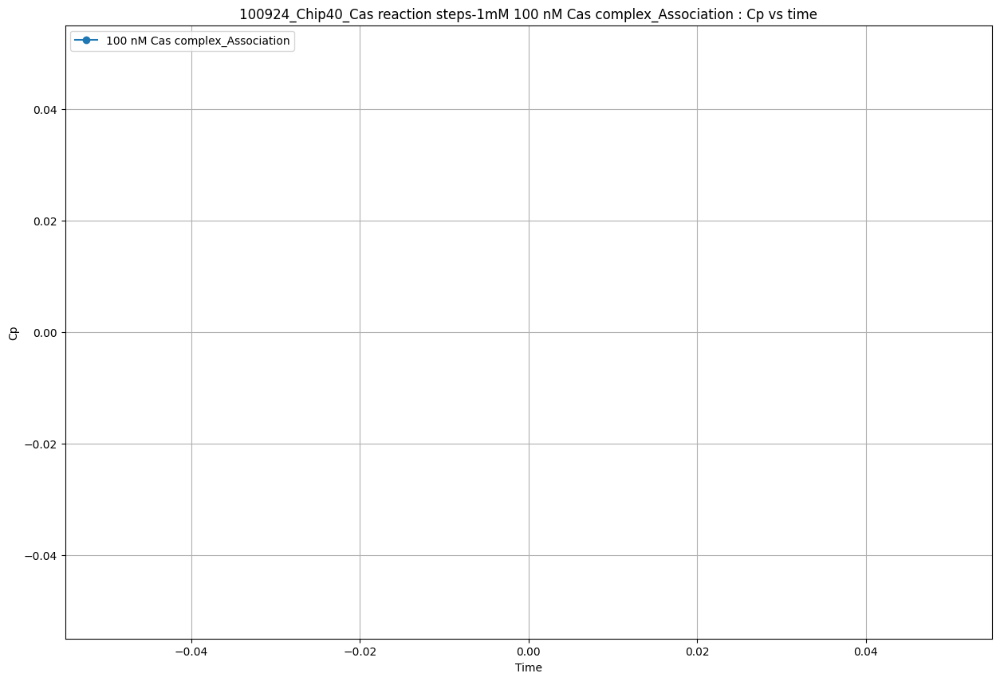

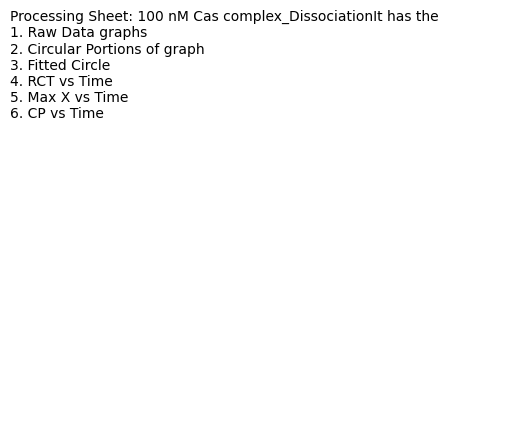

<Figure size 1500x1000 with 0 Axes>

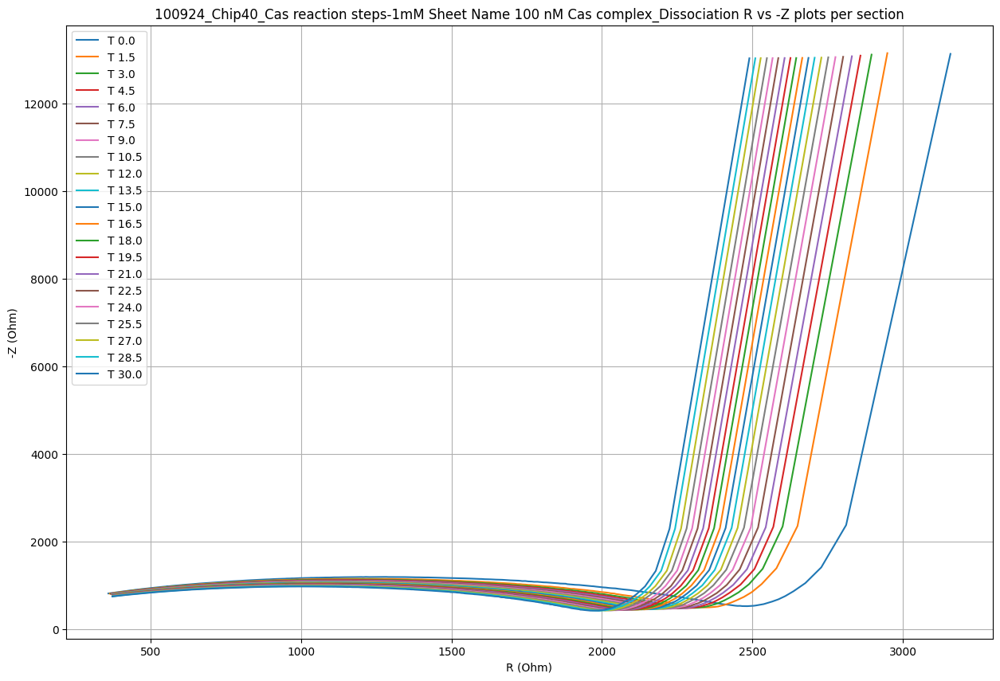

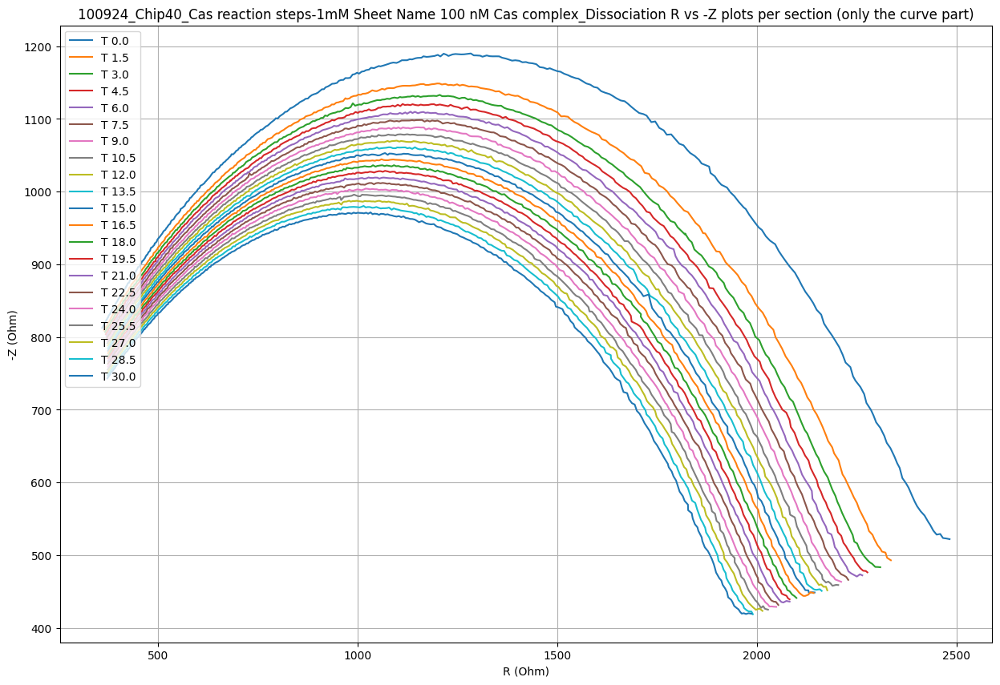

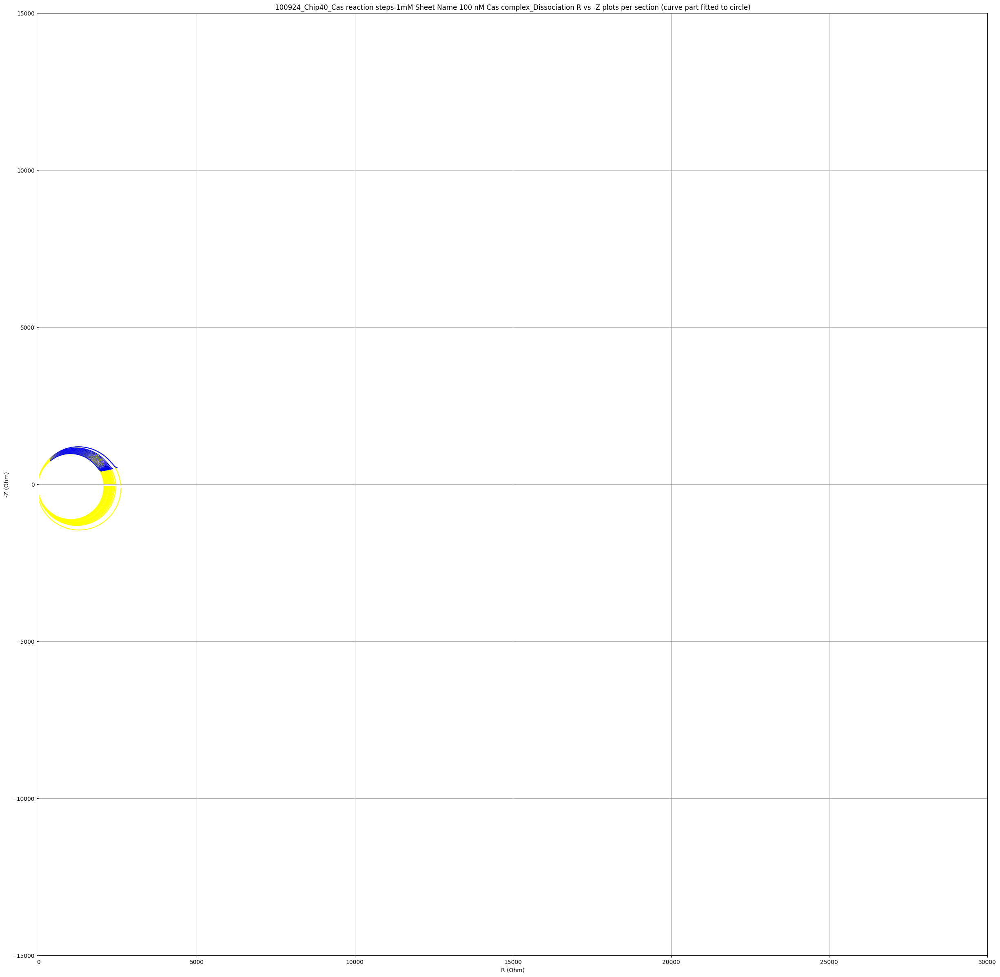

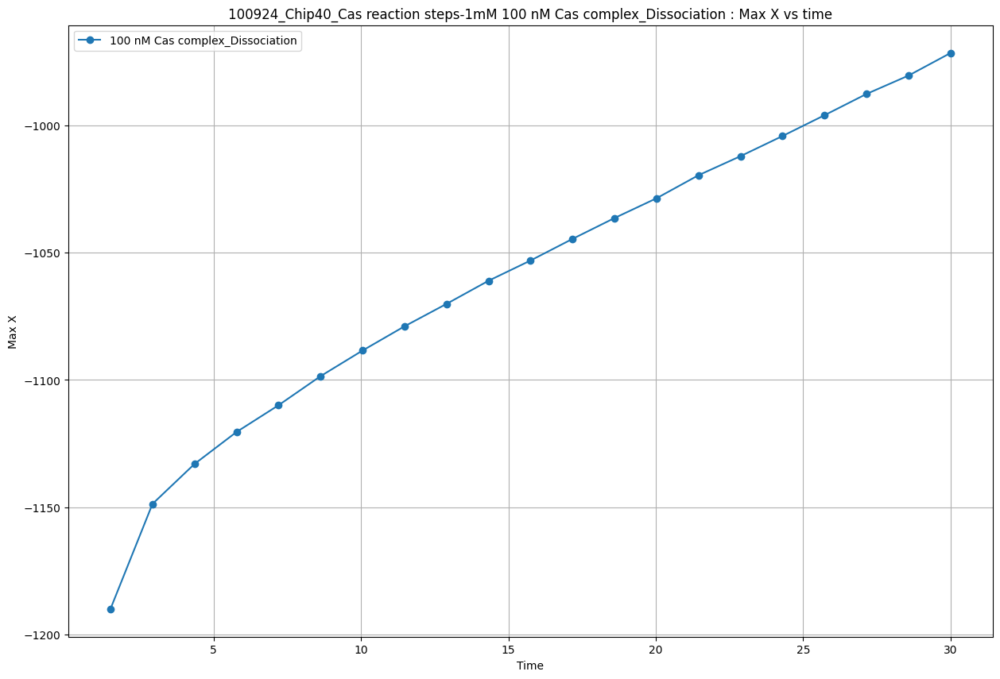

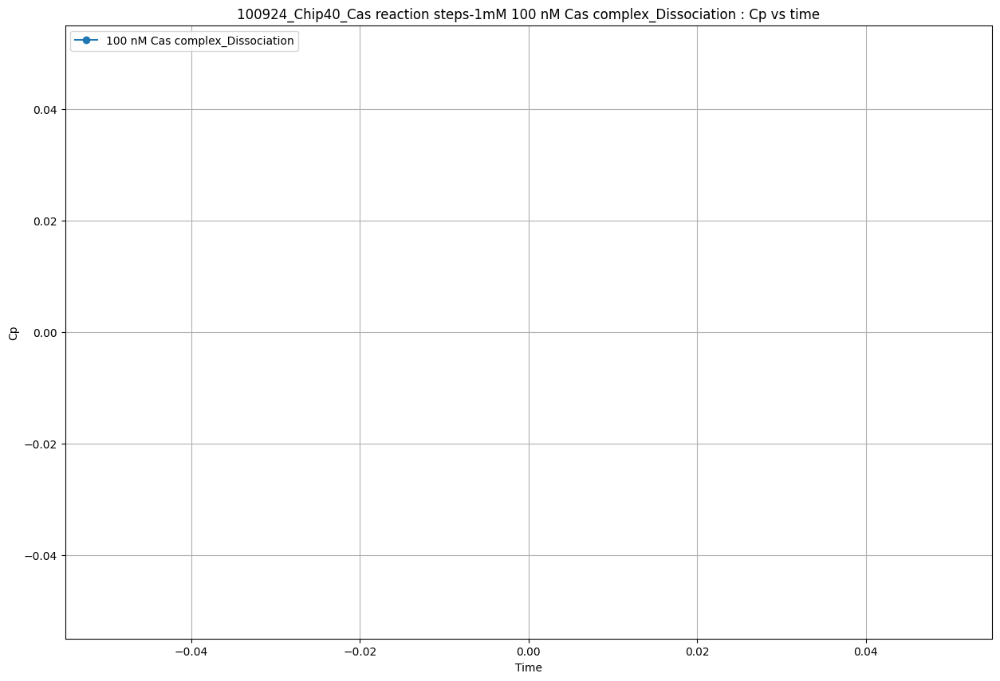

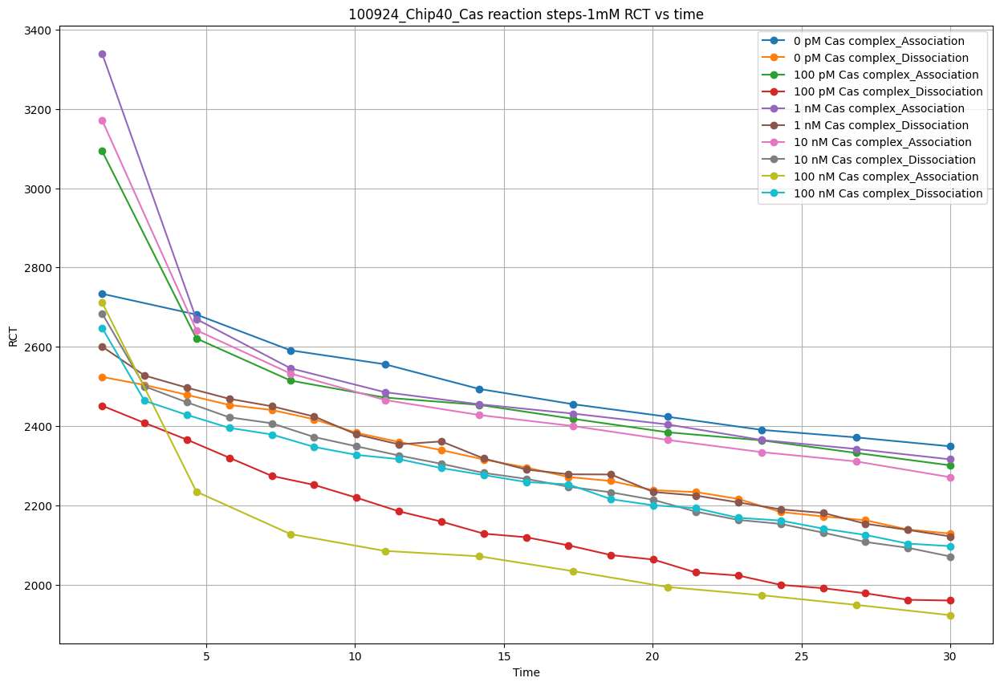

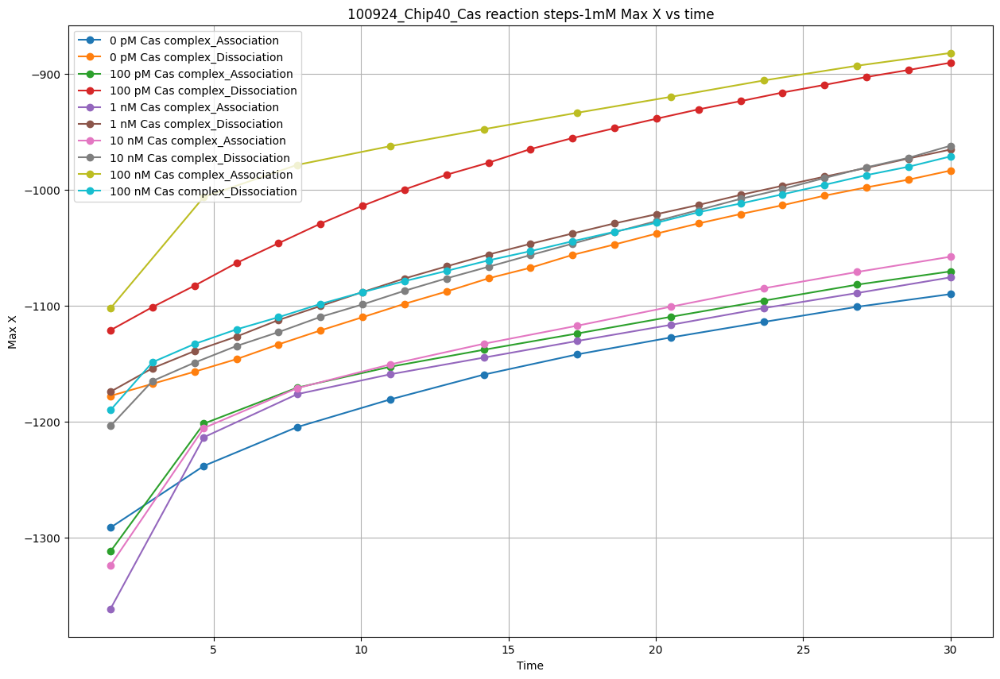

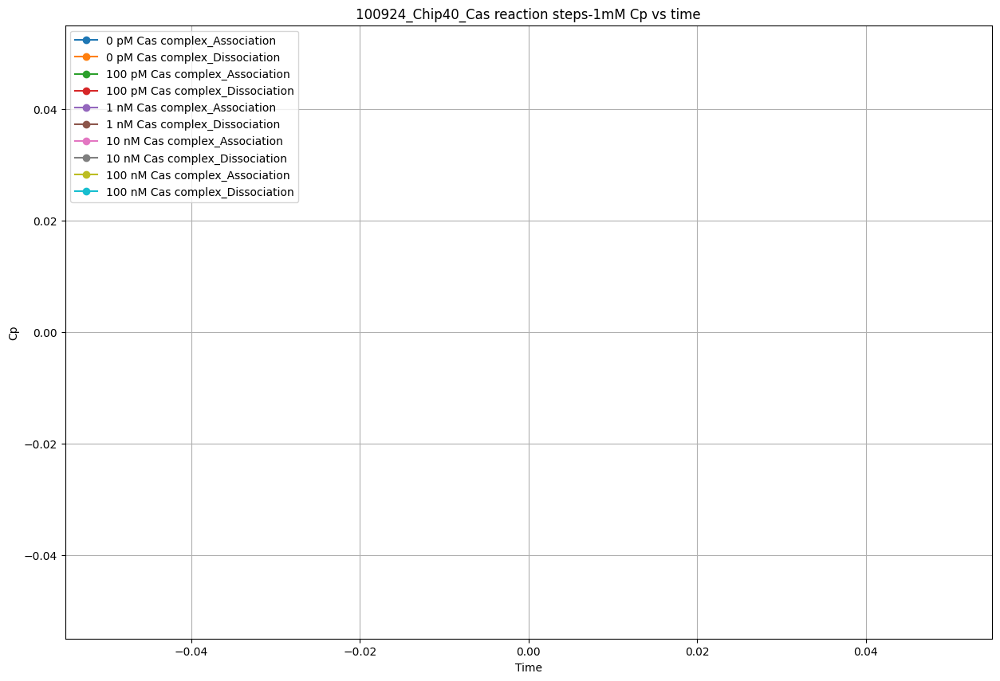

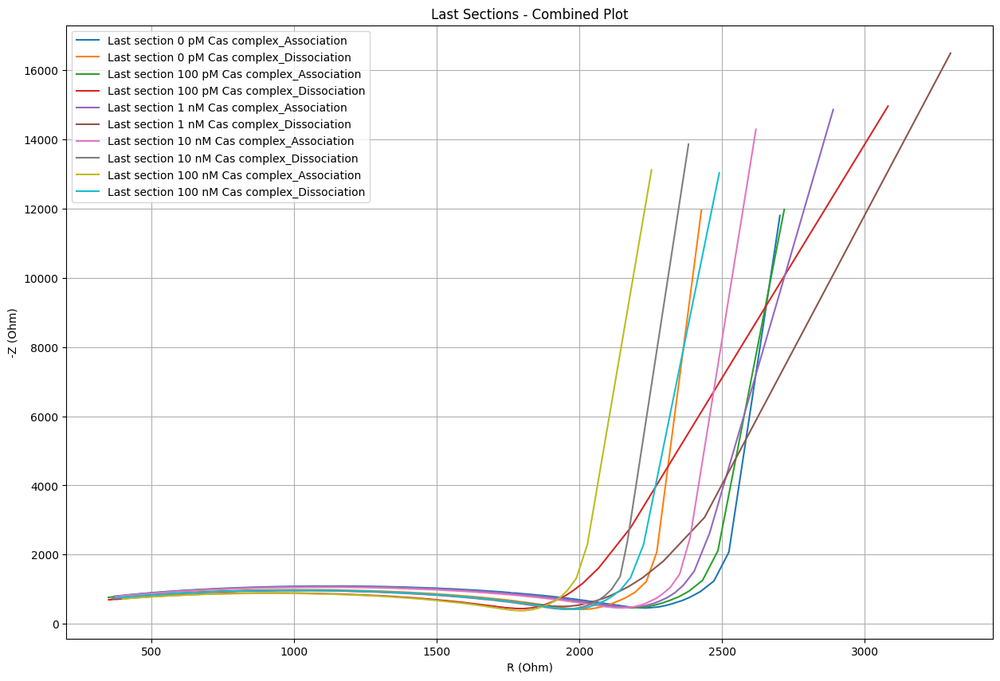

/var/folders/sl/w1dm71fn6gn8m4wc_ytvxdp40000gn/T/ipykernel_44791/2406397400.py:409: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='upper left')


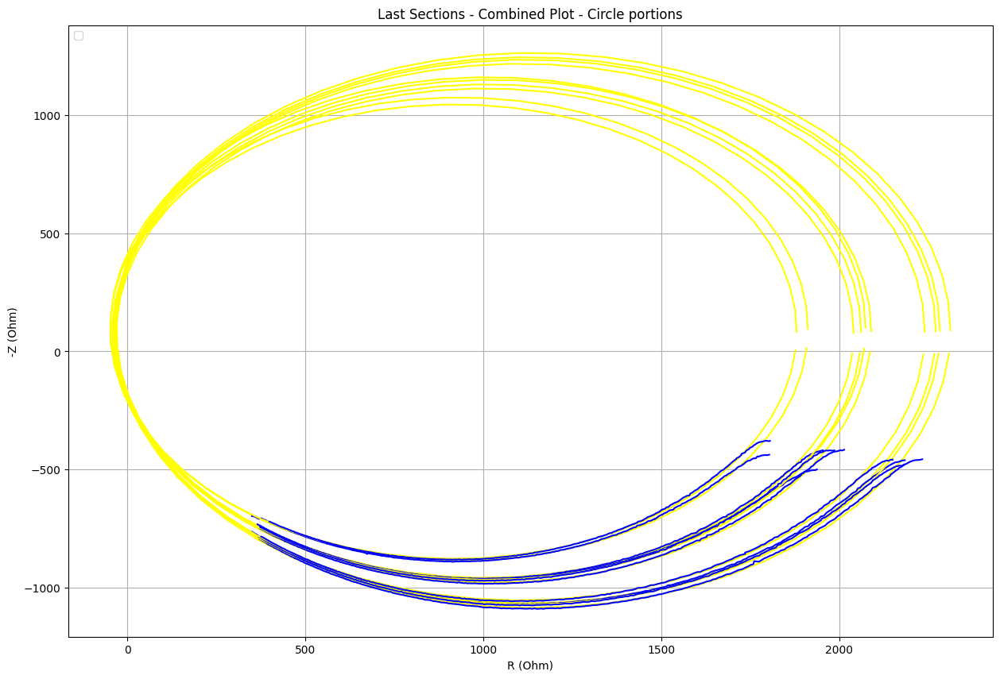

In [ ]:
import os
import sys
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.pyplot as pltTxt
import matplotlib.pyplot as pltFit
import matplotlib.pyplot as pltTbl
import numpy as np
from tkinter import filedialog, Tk, Listbox, MULTIPLE, Button, END, simpledialog, messagebox, Entry, Label, Button
from scipy.optimize import curve_fit
from circle_fit import taubinSVD,plot_data_circle
from matplotlib.backends.backend_pdf import PdfPages
import math
from matplotlib.patches import Circle


# Function to manually load file
def manualloadfile():
    folderpath = "Users\\AcquisitionStation\\OneDrive - DB, Inc\\Documents\\Electrochemistry\\Chip Test"
    #folderpath = "/Users/deeptabharadwaj/Documents/lab/eis_analysis_code/data_to_process_aug19"
    folderpath = "/Users/deeptabharadwaj/Documents/lab/aranLab/eis_analysis_code/oct3Onwards_data/dataCheck_oct14/cas_association_nov20"
    root = Tk()
    #root.withdraw()  # Hide the root window
    root.filename = filedialog.askopenfilename(
        initialdir=folderpath, 
        title="Select file", 
        filetypes=(("Excel files", "*.xlsx"),("all files", "*.*"))
    )
    root.destroy()
    return root.filename, pd.ExcelFile(root.filename, engine='openpyxl')

# Function to select sheets
def select_sheets(xls):
    root = Tk()
    root.title('Select Sheets')

    listbox = Listbox(root, selectmode=MULTIPLE)
    listbox.pack(padx=10, pady=10)

    for sheet in xls.sheet_names:
        listbox.insert(END, sheet)

    def on_select():
        global selected_sheets
        selected_sheets = [listbox.get(i) for i in listbox.curselection()]
        root.destroy()

    button = Button(root, text='Select', command=on_select)
    button.pack(pady=10)

    root.mainloop()

def find_derivative_zero_crossing(x_values):
    """Find the index where the derivative of the x_values crosses zero."""
    dx = np.diff(x_values)
    zero_crossings = np.where(np.diff(np.sign(dx)))[0]
    derivative_zero = df['X'][zero_crossings+1]
    min_value = np.min(derivative_zero)
    min_index = np.argmin(derivative_zero)
    resp_idx = zero_crossings[min_index]+ 1
    if len(zero_crossings) == 0:
        return None

    return min_value, resp_idx

# Define the Randles circuit model
def randles_circuit(f, Rs, Rct, Q, n):
    omega = 2 * np.pi * f
    Zcpe = Q * (1j * omega) ** n
    Z = Rs + 1 / (1 / Rct + 1 / Zcpe)
    return np.real(Z), np.imag(Z)

# Define a function to fit the model to the data
def fit_eis_data(frequencies, Z_real, Z_imag):
    initial_guess = [10, 100, 1e-6, 0.9]
    Z_measured = np.concatenate((Z_real, Z_imag))
    
    popt, pcov = curve_fit(
        lambda f, Rs, Rct, Q, n: np.concatenate(randles_circuit(f, Rs, Rct, Q, n)),
        frequencies, Z_measured, p0=initial_guess)
    
    return popt, pcov

def is_already_opened(filename):
     if os.path.exists(filename):
         try:
             f = open(filename, 'a')
             f.close()
         except IOError:
             return True
     return False

# Load the data
file_path, xls = manualloadfile()


# Extract initial file name without extension
file_name = os.path.splitext(os.path.basename(file_path))[0]

# Initialize file to write into
if is_already_opened(f"results_{file_name}.pdf"):
    print(f"Please close file results_{file_name}.pdf and rerun")
    sys.exit(0)
pdfFile = PdfPages(f'results_{file_name}.pdf')

# Select sheets
selected_sheets = []
select_sheets(xls)


# Define the default axis limits
default_limits = {'xlim': (0, 1500), 'ylim': (0, 5000)}

# Define the margin
margin = 00

# To store the last sections for the combined plot and plots
last_sections = []
figIncub = []
plotName = []
slopeList_RCT = []
interceptList_RCT = []
totalTime = 30 #total time of experiment
results = pd.DataFrame(columns=['SheetName', 'Start Index', 'End Index','Set Number','Time','Lowest Value','diameter','Max X','Cp'])
plots = {}


#Test
first_run = 0

#To store the diameters of each section

# Loop through each selected sheet in the Excel file
for sheet_name in selected_sheets:
    set_number = 0
    # Read the sheet into a DataFrame
    df = pd.read_excel(xls, sheet_name)
    
    # Define sections based on frequency ranges (e.g., 100-200000 in increments)
    maxFrequency = 200000
    maxFreqIndices = df.loc[df['Frequency(Hz)'] == maxFrequency].index
    maxFreqIndices = maxFreqIndices.to_numpy()
    maxFreqIndices = np.append(-1, maxFreqIndices)

    time_slots = np.linspace(1.5, totalTime, len(maxFreqIndices) - 1)
    diameters = []

    txt = "Processing Sheet: "+sheet_name+"It has the \n1. Raw Data graphs \n2. Circular Portions of graph \n3. Fitted Circle \n4. RCT vs Time \n5. Max X vs Time \n6. CP vs Time"
    pltTxt.axis('off')
    pltTxt.text(x=0, y=0.8, s=txt)
    pdfFile.savefig()

    
    # Initialize plot
    plt.figure(figsize=(15,10))

    # Plot each section
    plots[sheet_name] = [[],[],[]]
    for i, start in enumerate(maxFreqIndices):
        first_run = 1
        set_number = set_number + 1
        
        if i == len(maxFreqIndices) - 1:
            break
        section_df = df.iloc[maxFreqIndices[i] + 1:maxFreqIndices[i + 1] + 1]
        section_df_start_index = maxFreqIndices[i]
        section_df_end_index = maxFreqIndices[i + 1]

        frequencies = section_df['Frequency(Hz)'].values
       
        ##print(section_df)

        ## To find the minimun point in graph so we can split the graph into circle and line
        ## Keep checking the X values. As soon as it starts increasing catch that point as the beginning of semi circle. 
        ## Not a great way to find it, but hopefully the point it starts increasing is the point of start of semi circle
        #print(section_df)

        row = -section_df.iloc[1]['X']
        found_min = 0
        notAsemicircle = 0
        for index in range(0,len(section_df['X']-1)):
            if index == len(section_df['X']) - 1:
                # If we havent found the increasing point and we have reached end of searching point of increase
                notAsemicircle = 1
                break;
            if -section_df.iloc[index]['X'] < -section_df.iloc[index+1]['X']:
                row = -section_df.iloc[index]['X']
                break
           

        # Split at index with mininum value 
        line_section_df = section_df.iloc[:index]  # Rows before index 
        circle_section_df = section_df.iloc[index:]  # Rows from index
  
        # convert circle_section,f into coo,nates,r circle-fit
        circle_coordinates = circle_section_df[['Rs','X']].to_numpy()
        
        # Fit a circle https://pypi.org/project/circle-fit/
        r = 0
        if (notAsemicircle == 0):
            xc, yc, r, sigma = taubinSVD(circle_coordinates)
        # Get the diameter and add to the list
        diameters.append(2*r)
        #print("Circle fit done")
        #print("Radius of circle")
        #print(r)


        # Plot the fitted circle
        positions = []
        if (notAsemicircle == 0):
            #plot_data_circle(circle_coordinates, xc, yc, r)


            t=0
            #positions = []
            while t <= 2 * math.pi:
                positions.append((r * math.cos(t) + xc, r * math.sin(t) + yc))
                t += .1
            positions_df = pd.DataFrame(positions,columns=(['x','y']))
            #print(positions_df)
            #pltFit.title(f'Set {set_number} Fitting a circle. Diameter = {2*r}')
            #pltFit.axis('equal')
        else:
            positions_df = pd.DataFrame(positions,columns=(['x','y']))


        
        plots[sheet_name][0].append(section_df)   #idx 0
        plots[sheet_name][1].append(circle_section_df) #idx 1
        plots[sheet_name][2].append(positions_df) #idx 2
        
        #df = pd.concat([df, pd.DataFrame([new_row])], ignore_index=True)
        '''results = pd.concat([results, pd.DataFrame([{'SheetName':sheet_name, 'Start Index':section_df_start_index, 
                                  'End Index':section_df_end_index,'Set Number':set_number, 'Time':time_slots[i],
                                  'Lowest Value':row,'diameter':2*r,'Max X':circle_section_df['X'].min(), 
                                  'Cp':section_df['Cp'].iloc[0]}])], ignore_index=True)'''
        # for no cp and X
        results = pd.concat([results, pd.DataFrame([{'SheetName':sheet_name, 'Start Index':section_df_start_index, 
                                  'End Index':section_df_end_index,'Set Number':set_number, 'Time':time_slots[i],
                                  'Lowest Value':row,'diameter':2*r, 'Max X':circle_section_df['X'].min()}])], ignore_index=True)

    
        #if (first_run == 1):
        #    break;



    #Graphs per sheet including all sections
    plt.figure(figsize=(15,10))
    plt.xlabel('R (Ohm)')
    plt.ylabel('-Z (Ohm)')
    plt.grid()
    plt.title(f'{file_name} Sheet Name {sheet_name} R vs -Z plots per section')
    for plotNum in range(0,len(plots[sheet_name][0])):
        plt.plot(plots[sheet_name][0][plotNum]['Rs'], -plots[sheet_name][0][plotNum]['X'], '-', label=f'T {plotNum*1.5}')
    plt.legend(loc='upper left')
    pdfFile.savefig(dpi= 500)
    plt.show()
    plt.close()

    if notAsemicircle == 0:
        plt.figure(figsize=(15,10))
        plt.xlabel('R (Ohm)')
        plt.ylabel('-Z (Ohm)')
        plt.grid()
        plt.title(f'{file_name} Sheet Name {sheet_name} R vs -Z plots per section (only the curve part)')
        for plotNum in range(0,len(plots[sheet_name][1])):
            plt.plot(plots[sheet_name][1][plotNum]['Rs'], -plots[sheet_name][1][plotNum]['X'], '-', label=f'T {plotNum*1.5}')
            plt.legend(loc='upper left')
        pdfFile.savefig()
        plt.show()
        plt.close()

    if notAsemicircle == 0:
        plt.figure(figsize=(30,30))
        plt.xlabel('R (Ohm)')
        plt.ylabel('-Z (Ohm)')
        #plt.xlim(0,30000)
        #plt.ylim(-15000,15000)
        #plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.grid()
        plt.title(f'{file_name} Sheet Name {sheet_name} R vs -Z plots per section (curve part fitted to circle)')
        for plotNum in range(0,len(plots[sheet_name][1])):
        
            plt.plot(plots[sheet_name][2][plotNum]['x'], -plots[sheet_name][2][plotNum]['y'], '-', color="yellow")
            plt.plot(plots[sheet_name][1][plotNum]['Rs'], -plots[sheet_name][1][plotNum]['X'], '-', color="blue")
        pdfFile.savefig()
        plt.show()
        plt.close()

    # Plotting the results
    plt.figure(figsize=(15,10))
    plt.plot(results[results['SheetName'] == sheet_name]['Time'], results[results['SheetName'] == sheet_name]['diameter'], marker='o', linestyle='-', label=sheet_name)
    plt.xlabel('Time')
    plt.ylabel('RCT')
    plt.title(f'{file_name} {sheet_name} : RCT vs time')
    #plt.ylim(1000, 6000)
    plt.legend(loc='upper left')
    plt.grid(True)
    pdfFile.savefig()
    # Close the plot to free memory and avoid overlap
    plt.close()


    # Combined Max X plot for all sheets
    plt.figure(figsize=(15,10))
    plt.xlabel('Time')
    plt.ylabel('Max X')
    plt.title(f'{file_name} {sheet_name} : Max X vs time')
    plt.plot(results[results['SheetName'] == sheet_name]['Time'], results[results['SheetName'] == sheet_name]['Max X'], marker='o', linestyle='-', label=sheet_name)
    plt.legend(loc='upper left')
    plt.grid(True)
    pdfFile.savefig()
    plt.show()
    plt.close()

    # Combined CP plot for all sheets
    plt.figure(figsize=(15,10))
    plt.xlabel('Time')
    plt.ylabel('Cp')
    plt.title(f'{file_name} {sheet_name} : Cp vs time')
    plt.plot(results[results['SheetName'] == sheet_name]['Time'], results[results['SheetName'] == sheet_name]['Cp'], marker='o', linestyle='-', label=sheet_name)
    plt.legend(loc='upper left')
    plt.grid(True)
    pdfFile.savefig()
    plt.show()
    plt.close()
    

    # Plot the last section
    last_section_df = df.iloc[maxFreqIndices[-2] + 1:maxFreqIndices[-1] + 1]

    # Store the last section for the combined plot
    last_sections.append((sheet_name, last_section_df))

# Combined all sheet and all sections

# Combined RCT plot for all sheets
plt.figure(figsize=(15,10))
plt.xlabel('Time')
plt.ylabel('RCT')
plt.title(f'{file_name} RCT vs time')
for sheet_name in selected_sheets:
    plt.plot(results[results['SheetName'] == sheet_name]['Time'], results[results['SheetName'] == sheet_name]['diameter'], marker='o', linestyle='-', label=sheet_name)
plt.legend(loc='upper right')
plt.grid(True)
pdfFile.savefig()
plt.show()
plt.close()

# Combined Max X plot for all sheets
plt.figure(figsize=(15,10))
plt.xlabel('Time')
plt.ylabel('Max X')
plt.title(f'{file_name} Max X vs time')

for sheet_name in selected_sheets:
    plt.plot(results[results['SheetName'] == sheet_name]['Time'], results[results['SheetName'] == sheet_name]['Max X'], marker='o', linestyle='-', label=sheet_name)
plt.legend(loc='upper left')
plt.grid()
pdfFile.savefig()
plt.show()
plt.close()

# Combined CP plot for all sheets
plt.figure(figsize=(15,10))
plt.xlabel('Time')
plt.ylabel('Cp')
plt.title(f'{file_name} Cp vs time')

for sheet_name in selected_sheets:
    plt.plot(results[results['SheetName'] == sheet_name]['Time'], results[results['SheetName'] == sheet_name]['Cp'], marker='o', linestyle='-', label=sheet_name)
plt.legend(loc='upper left')
plt.grid()
pdfFile.savefig()
plt.show()
plt.close()


# Combined plot for the last sections of all sheets
plt.figure(figsize=(15, 10))

# Set combined plot labels and title
plt.xlabel('R (Ohm)')
plt.ylabel('-Z (Ohm)')
plt.title('Last Sections - Combined Plot')

plt.grid()
for sheet_name, section_df in last_sections:
    plt.plot(section_df['Rs'], -section_df['X'], '-', label=f'Last section {sheet_name}')

plt.legend(loc='upper left')
pdfFile.savefig()
plt.show()



# circle portion of last section
plt.figure(figsize=(15,10))
plt.xlabel('R (Ohm)')
plt.ylabel('-Z (Ohm)')
plt.title('Last Sections - Combined Plot - Circle portions')

plt.grid()
for sheet_name, section_df in last_sections:
    plt.plot(plots[sheet_name][2][len(plots[sheet_name][2])-1]['x'], plots[sheet_name][2][len(plots[sheet_name][2])-1]['y'], '-', color="yellow")
    plt.plot(plots[sheet_name][1][len(plots[sheet_name][1])-1]['Rs'], plots[sheet_name][1][len(plots[sheet_name][1])-1]['X'], '-', color="blue")
plt.legend(loc='upper left')
pdfFile.savefig()
plt.show()
pdfFile.close()


# Write results into csv
results.to_csv(f'results_{file_name}.csv')



###  For Rct vs time fits

Input got 5
splitPoint 5


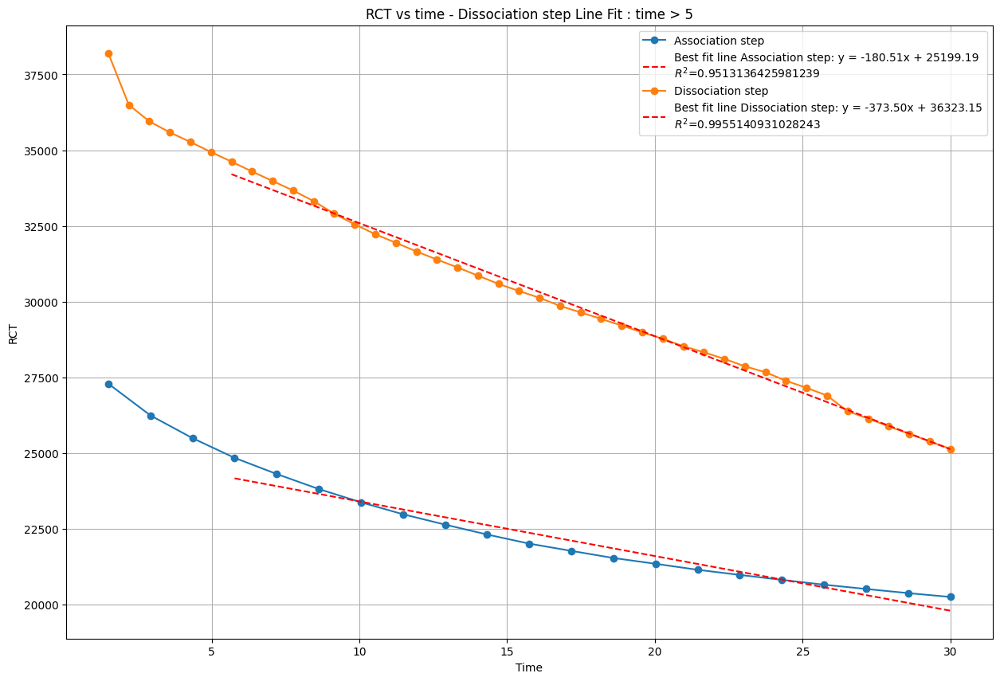

/var/folders/sl/w1dm71fn6gn8m4wc_ytvxdp40000gn/T/ipykernel_51491/329747923.py:81: RankWarning: Polyfit may be poorly conditioned
  p = numpy.polyfit(


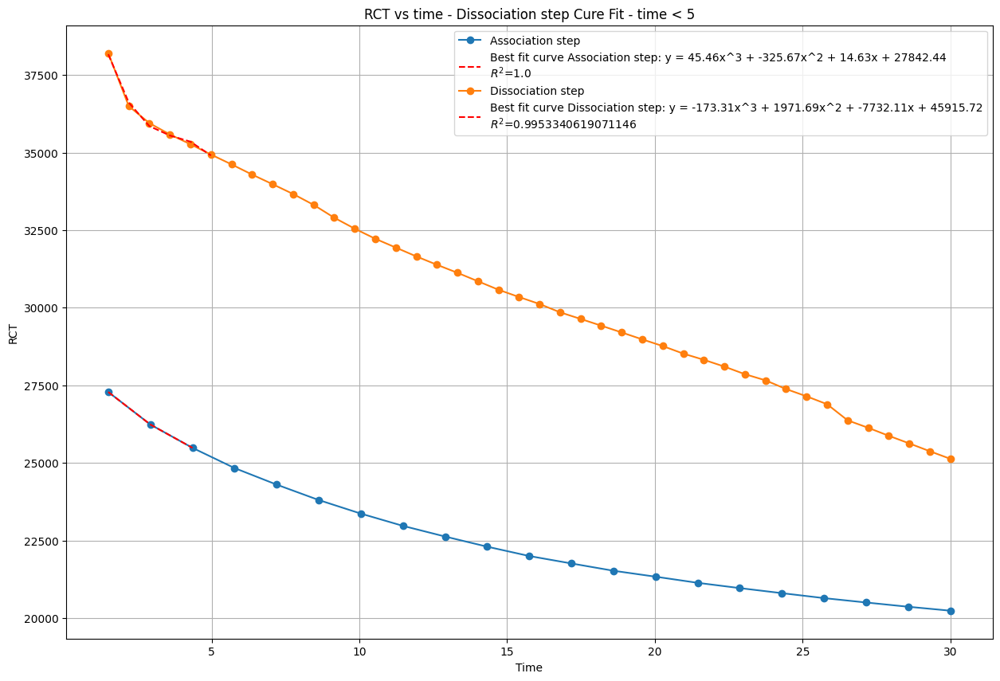

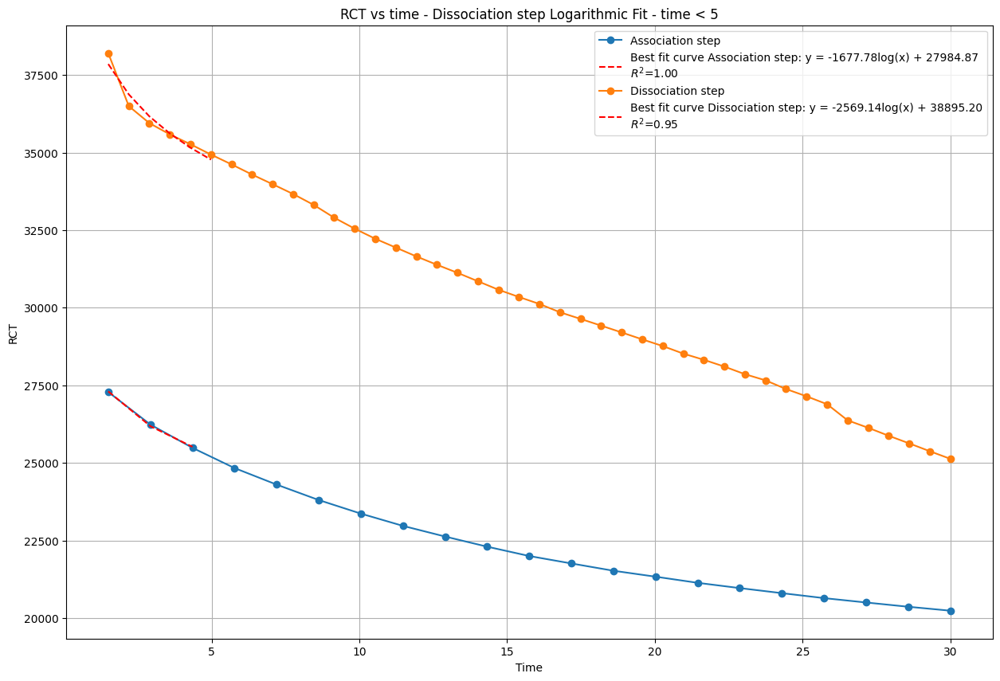

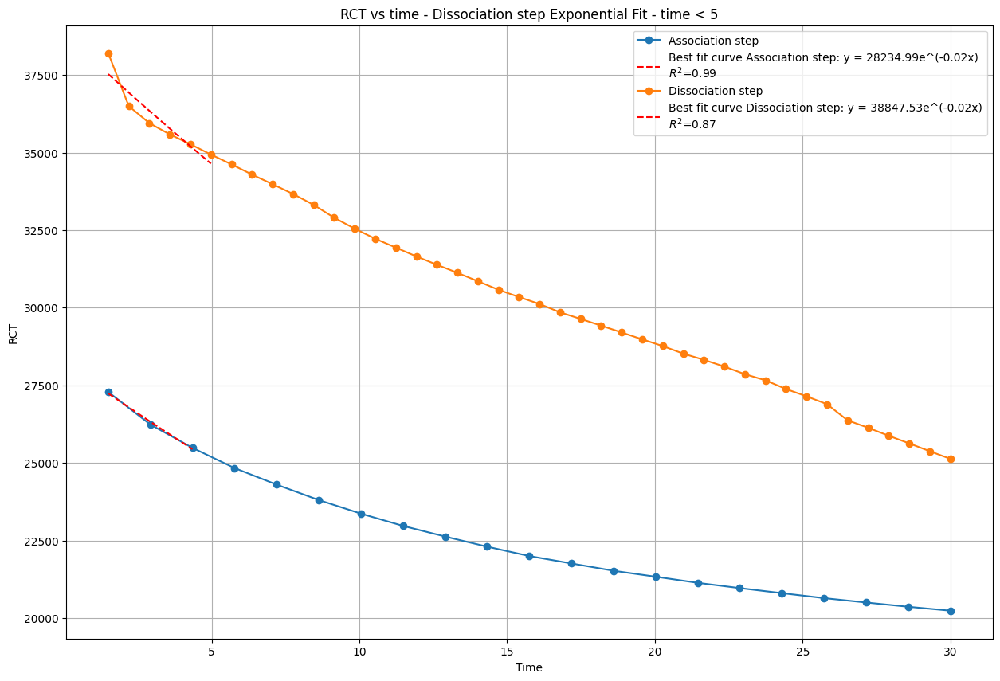

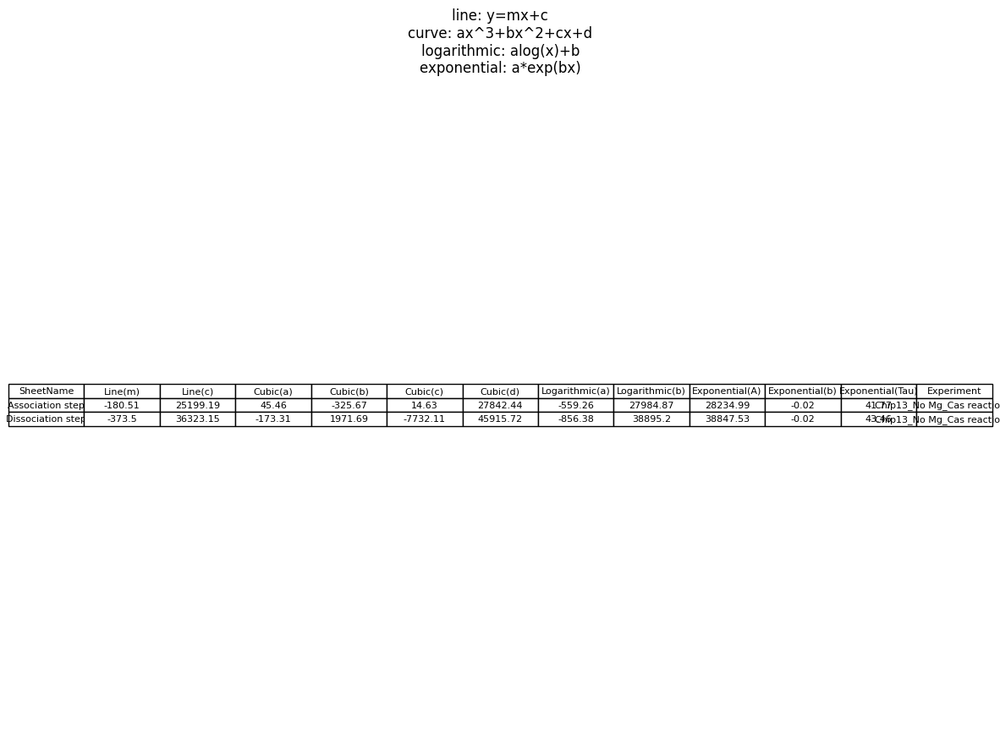

In [7]:
import numpy
from matplotlib.backends.backend_pdf import PdfPages
import tkinter as tk
import matplotlib.pyplot as plt
import matplotlib.pyplot as pltTbl
from openpyxl import load_workbook

#coefficients = pd.DataFrame(columns=['SheetName','Line(m)', 'Line(c)', 'Curve(a)','Curve(b)','Curve(c)','Curve(d)'])
coefficients = {}


splitPoint = 30 #Default value

def get_input():
    global splitPoint 
    print("Input got",entry.get())
    if (int(entry.get()) > 0) & (int(entry.get()) < totalTime):
        splitPoint = int(entry.get())
    #label.config(text="You entered: " + text)
    root.destroy()

root = tk.Tk()
root.title("codeEIS Analysis")

label = tk.Label(root, text=f"Look at the RCT/Time graph in the results_{file_name}.pdf. \nIndicate the time where the graph stops being a curve and becomes a line")
label.pack()

entry = tk.Entry(root)
entry.pack()

button = tk.Button(root, text="Submit", command=get_input)
button.pack()

root.mainloop()

print('splitPoint',splitPoint)

results = pd.read_csv (f'results_{file_name}.csv')
pdfFile = PdfPages(f'resultsRCTfit_{file_name}.pdf')
plt.figure(figsize=(15, 10))

# Linear fit of non semicircle part
for sheet_name in results['SheetName'].unique():
    coeffList = []
    slope, intercept = numpy.polyfit(
        results[(results['SheetName'] == sheet_name) & (results['Time'] >= splitPoint)]['Time'], 
        results[(results['SheetName'] == sheet_name) & (results['Time'] >= splitPoint)]['diameter'],1)
    best_fit_line = slope * results[(results['SheetName'] == sheet_name) & (results['Time'] >= splitPoint)]['Time'] + intercept
    valid_diameters = results[(results['SheetName'] == sheet_name) & (results['Time'] >= splitPoint)]['diameter']
    residuals = np.array(valid_diameters) - best_fit_line
    ss_res = np.sum(residuals**2)
    ss_tot = np.sum((valid_diameters - np.mean(valid_diameters))**2)
    r_squared = 1 - (ss_res / ss_tot)
    #print(best_fit_line)
    plt.plot(results[(results['SheetName'] == sheet_name)]['Time'], 
             results[(results['SheetName'] == sheet_name) ]['diameter'], 
             marker='o', linestyle='-', label = f'{sheet_name}')
    plt.plot(results[(results['SheetName'] == sheet_name) & (results['Time'] >= splitPoint)]['Time'], 
             best_fit_line, color='red', linestyle='--', label=f'Best fit line {sheet_name}: y = {slope:.2f}x + {intercept:.2f}\n$R^2$={r_squared}')
    coeffList.append(round(slope,2))
    #coeffList.append('first')
    coeffList.append(round(intercept,2))
    #coeffList.append('second')
    coefficients[sheet_name]=coeffList # Slope and intercept line part of rct vs time- rounded values

plt.xlabel('Time')
plt.ylabel('RCT')
plt.title(f'RCT vs time - {sheet_name} Line Fit : time > {splitPoint}')
#plt.ylim(1000, 6000)
plt.legend(loc='upper right')
plt.grid(True)
pdfFile.savefig()    
plt.show()

# Semicircle fit 
# Cubic fit
plt.figure(figsize=(15,10))
for sheet_name in results['SheetName'].unique():
    #print(sheet_name, results['SheetName'].unique())
    try:
        p = numpy.polyfit(
            results[(results['SheetName'] == sheet_name) & (results['Time'] < splitPoint)]['Time'], 
            results[(results['SheetName'] == sheet_name) & (results['Time'] < splitPoint)]['diameter'],3)
    except numpy.linalg.LinAlgError:
        coefficients[sheet_name].append(0)  # Cubic fit rct vs time
        coefficients[sheet_name].append(0)
        coefficients[sheet_name].append(0)
        coefficients[sheet_name].append(0)
        continue
    
    x_val_dia = results[(results['SheetName'] == sheet_name) & (results['Time'] < splitPoint)]['Time']
    best_fit_curve = p[0]*(x_val_dia)**3 + p[1]*(x_val_dia)**2 + p[2]*x_val_dia + p[3]
    valid_diameters = results[(results['SheetName'] == sheet_name) & (results['Time'] < splitPoint)]['diameter']
    residuals = np.array(valid_diameters) - best_fit_curve
    ss_res = np.sum(residuals**2)
    ss_tot = np.sum((valid_diameters - np.mean(valid_diameters))**2)
    r_squared = 1 - (ss_res / ss_tot)
    
    plt.plot(results[(results['SheetName'] == sheet_name)]['Time'], 
             results[(results['SheetName'] == sheet_name) ]['diameter'], 
             marker='o', linestyle='-', label = f'{sheet_name}')

    plt.plot(results[(results['SheetName'] == sheet_name) & (results['Time'] < splitPoint)]['Time'], 
                    np.polyval(p, results[(results['SheetName'] == sheet_name) & (results['Time'] < splitPoint)]['Time']),
                    color='red', linestyle='--', label=f'Best fit curve {sheet_name}: y = {p[0]:.2f}x^3 + {p[1]:.2f}x^2 + {p[2]:.2f}x + {p[3]:.2f}\n$R^2$={r_squared}')
    coefficients[sheet_name].append(round(p[0],2)) # rounded values - cubic fit rct vs time
    coefficients[sheet_name].append(round(p[1],2))
    coefficients[sheet_name].append(round(p[2],2))
    coefficients[sheet_name].append(round(p[3],2))

plt.xlabel('Time')
plt.ylabel('RCT')
plt.title(f'RCT vs time - {sheet_name} Cure Fit - time < {splitPoint}')
#plt.ylim(1000, 6000)
plt.legend(loc='upper right')
plt.grid(True)
pdfFile.savefig()    
plt.show()

# Logarithmic fit 
plt.figure(figsize=(15,10))
for sheet_name in results['SheetName'].unique():
    # Filter the relevant data
    filtered_data = results[(results['SheetName'] == sheet_name) & (results['Time'] < splitPoint)] # with first val# & (results['Time'] > 1.5)]
    
    # Check if there's any data left after filtering
    if filtered_data.empty:
        coefficients[sheet_name].append(0)
        coefficients[sheet_name].append(0)
        continue
    
    try:
        # Apply logarithmic transformation to the 'Time' data and perform a linear fit
        log_time = np.log(filtered_data['Time'])
        p = np.polyfit(log_time, filtered_data['diameter'], 1)
    except np.linalg.LinAlgError:
        coefficients[sheet_name].append(0) # Logarithmic data for semicircle fit
        coefficients[sheet_name].append(0)
        continue
    
    # Calculate the best fit curve using the logarithmic model
    x_val_dia = filtered_data['Time']
    best_fit_curve = p[0] * np.log(x_val_dia) + p[1]
    
    # Calculate residuals and R-squared
    valid_diameters = filtered_data['diameter']
    residuals = np.array(valid_diameters) - best_fit_curve
    ss_res = np.sum(residuals ** 2)
    ss_tot = np.sum((valid_diameters - np.mean(valid_diameters)) ** 2)
    r_squared = 1 - (ss_res / ss_tot)
    
    # Plot the actual data points
    plt.plot(results[results['SheetName'] == sheet_name]['Time'], 
             results[results['SheetName'] == sheet_name]['diameter'], 
             marker='o', linestyle='-', label=f'{sheet_name}')

    # Plot the logarithmic best fit curve
    plt.plot(filtered_data['Time'], 
             best_fit_curve,
             color='red', linestyle='--',
             label=f'Best fit curve {sheet_name}: y = {p[0]:.2f}log(x) + {p[1]:.2f}\n$R^2$={r_squared:.2f}')
    
    # Store the coefficients
    coefficients[sheet_name].append(round(p[0], 2)/3) # Logarithmic data for semicircle fit - rounded values
    coefficients[sheet_name].append(round(p[1], 2))

plt.xlabel('Time')
plt.ylabel('RCT')
plt.title(f'RCT vs time - {sheet_name} Logarithmic Fit - time < {splitPoint}')
plt.legend(loc='upper right')
plt.grid(True)
pdfFile.savefig()    
plt.show()

# exponential fit 
plt.figure(figsize=(15,10))
for sheet_name in results['SheetName'].unique():
    # Filter the relevant data
    filtered_data = results[(results['SheetName'] == sheet_name) & (results['Time'] < splitPoint)] # with first val# & (results['Time'] > 1.5)]
    
    # Check if there's any data left after filtering
    if filtered_data.empty:
        coefficients[sheet_name].append(0)
        coefficients[sheet_name].append(0)
        coefficients[sheet_name].append(0)
        continue
    
    try:
        # Apply logarithmic transformation to the 'diameter' data and perform a linear fit
        log_diameter = np.log(filtered_data['diameter'])
        p = np.polyfit(filtered_data['Time'], log_diameter, 1)
    except np.linalg.LinAlgError:
        coefficients[sheet_name].append(0)
        coefficients[sheet_name].append(0)
        coefficients[sheet_name].append(0)
        continue
    
    # Calculate the best fit curve using the exponential model
    a = np.exp(p[1])  # Convert ln(a) back to a
    b = p[0]
    x_val_dia = filtered_data['Time']
    best_fit_curve = a * np.exp(b * x_val_dia)
    
    # Calculate residuals and R-squared
    valid_diameters = filtered_data['diameter']
    residuals = np.array(valid_diameters) - best_fit_curve
    ss_res = np.sum(residuals ** 2)
    ss_tot = np.sum((valid_diameters - np.mean(valid_diameters)) ** 2)
    r_squared = 1 - (ss_res / ss_tot)
    
    # Plot the actual data points
    plt.plot(results[results['SheetName'] == sheet_name]['Time'], 
             results[results['SheetName'] == sheet_name]['diameter'], 
             marker='o', linestyle='-', label=f'{sheet_name}')

    # Plot the exponential best fit curve
    plt.plot(filtered_data['Time'], 
             best_fit_curve,
             color='red', linestyle='--',
             label=f'Best fit curve {sheet_name}: y = {a:.2f}e^({b:.2f}x)\n$R^2$={r_squared:.2f}')
    
    # Store the coefficients
    coefficients[sheet_name].append(round(a, 2)) # rounded values - exponential fit for semicircle
    coefficients[sheet_name].append(round(b, 2))
    coefficients[sheet_name].append(round(-1/b, 2))

plt.xlabel('Time')
plt.ylabel('RCT')
plt.title(f'RCT vs time - {sheet_name} Exponential Fit - time < {splitPoint}')
plt.legend(loc='upper right')
plt.grid(True)
pdfFile.savefig()    
plt.show()

prepared_dict = {i: (x[0], x[1][0],x[1][1],x[1][2],x[1][3],x[1][4],x[1][5],x[1][6],x[1][7],x[1][8]
                    ,x[1][9],x[1][10]) for i, x in enumerate(coefficients.items())}
coefficients_df = pd.DataFrame.from_dict(prepared_dict, orient='index',columns=['SheetName','Line(m)', 'Line(c)', 'Cubic(a)','Cubic(b)',
                                                                                'Cubic(c)','Cubic(d)', 'Logarithmic(a)', 'Logarithmic(b)',
                                                                               'Exponential(A)', 'Exponential(b)','Exponential(Tau)'])
coefficients_df['Experiment'] = file_name

header = coefficients_df.columns
table = coefficients_df.to_numpy()
pltTbl.figure(figsize=(15, 10))
pltTbl.title(f'line: y=mx+c\ncurve: ax^3+bx^2+cx+d\nlogarithmic: alog(x)+b\nexponential: a*exp(bx)')
pltTbl.axis("off")
the_table = pltTbl.table(cellText=table, colLabels=header, cellLoc='center', loc='center',fontsize=20)
the_table.auto_set_font_size(False)
the_table.set_fontsize(8)
the_table.scale(1, 1)

pdfFile.savefig()
pltTbl.show()
pltTbl.close()

pdfFile.close()


# Try to append data to the existing Excel file
# Define the path to the Excel file
file_path_for_results = '/Users/deeptabharadwaj/Documents/lab/eis_analysis_code/oct3Onwards_data/' #important to change

resultpath = f'{file_path_for_results}/output_eis_all.xlsx'
def save_to_excel(file_path, coefficient_df):
    # Check if the file already exists
    if os.path.exists(file_path):
        # Load existing data
        existing_df = pd.read_excel(file_path)
        # Append new data
        updated_df = pd.concat([existing_df, coefficient_df], ignore_index=True)
        # Save updated data back to the file
        updated_df.to_excel(file_path, index=False)
    else:
        # Save new data to a new file
        coefficient_df.to_excel(file_path, index=False)

save_to_excel(resultpath, coefficients_df)

### Max x vs time fits

splitPoint 10


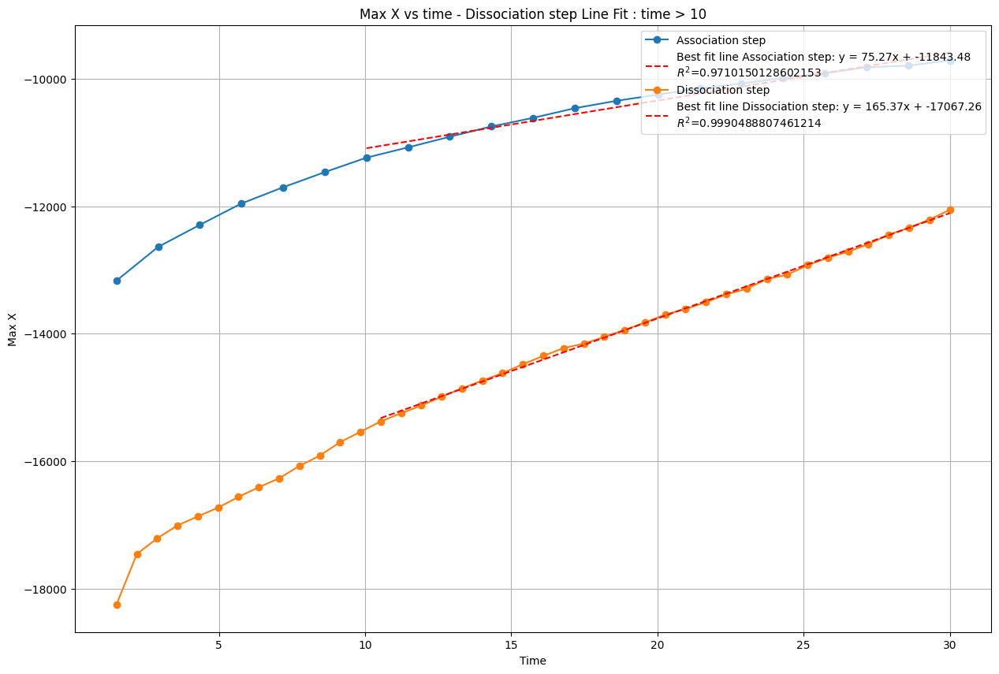

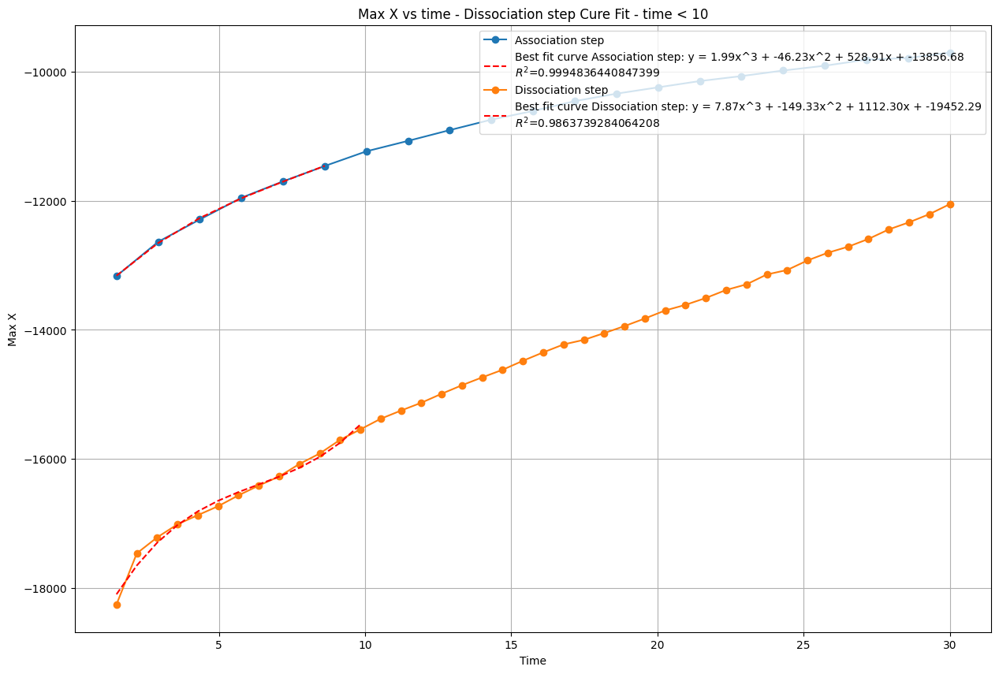

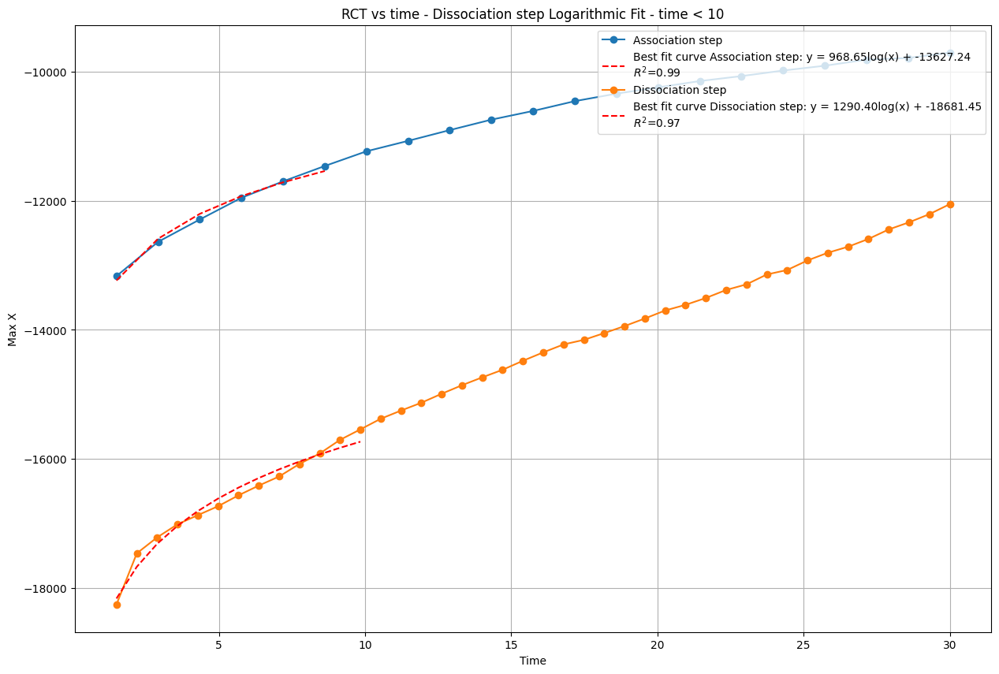

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


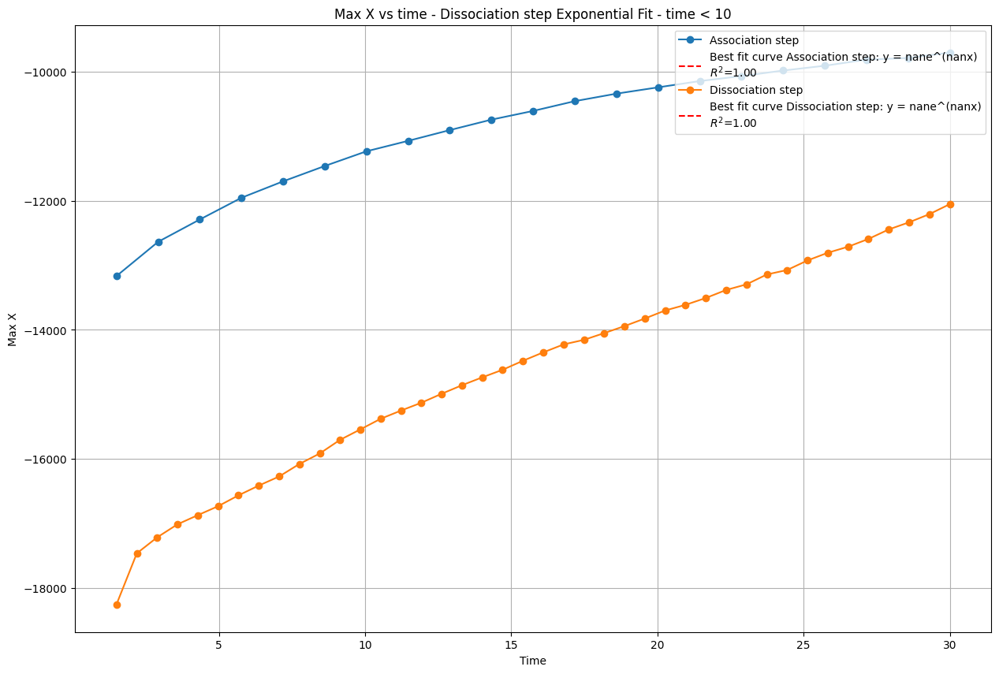

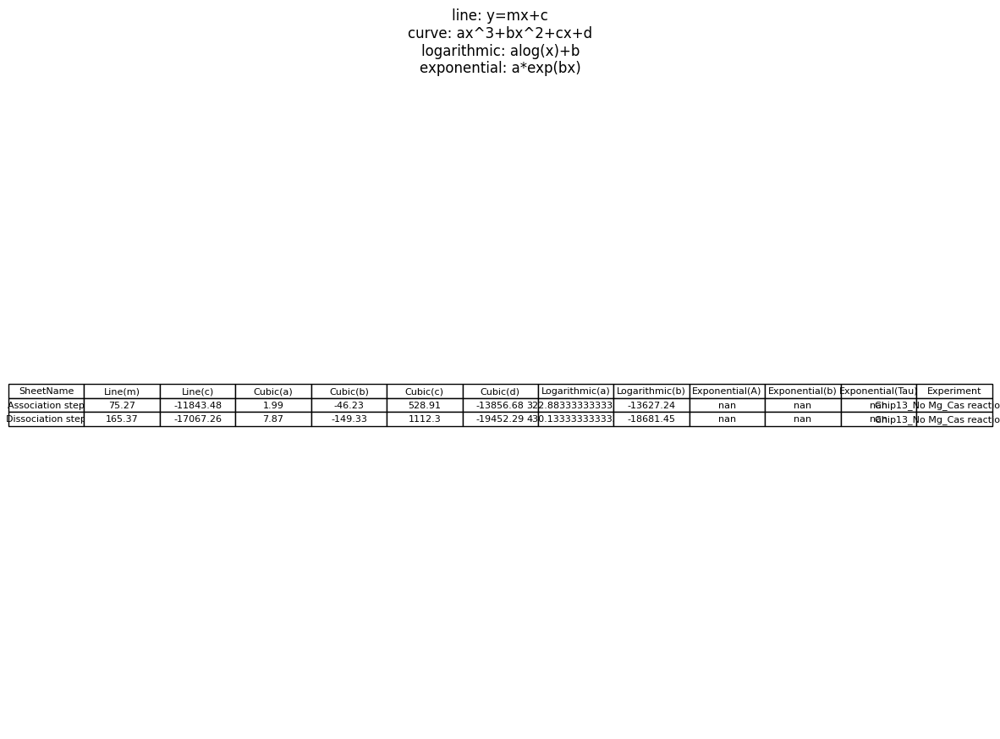

In [8]:
import numpy
from matplotlib.backends.backend_pdf import PdfPages
import tkinter as tk
import matplotlib.pyplot as plt
import matplotlib.pyplot as pltTbl
from openpyxl import load_workbook

#coefficients = pd.DataFrame(columns=['SheetName','Line(m)', 'Line(c)', 'Curve(a)','Curve(b)','Curve(c)','Curve(d)'])
coefficients = {}


splitPoint = 10 #Default value
'''
def get_input():
    global splitPoint 
    print("Input got",entry.get())
    if (int(entry.get()) > 0) & (int(entry.get()) < totalTime):
        splitPoint = int(entry.get())
    #label.config(text="You entered: " + text)
    root.destroy()

root = tk.Tk()
root.title("codeEIS Analysis")

label = tk.Label(root, text=f"Look at the RCT/Time graph in the results{file_name}.pdf. \nIndicate the time where the graph stops being a curve and becomes a line")
label.pack()

entry = tk.Entry(root)
entry.pack()

button = tk.Button(root, text="Submit", command=get_input)
button.pack()

root.mainloop()
'''
print('splitPoint',splitPoint)

results = pd.read_csv (f'results_{file_name}.csv')
pdfFile = PdfPages(f'resultsMaxXfit_{file_name}.pdf')
plt.figure(figsize=(15, 10))

# Linear fit of non semicircle part
for sheet_name in results['SheetName'].unique():
    coeffList = []
    slope, intercept = numpy.polyfit(
        results[(results['SheetName'] == sheet_name) & (results['Time'] >= splitPoint)]['Time'], 
        results[(results['SheetName'] == sheet_name) & (results['Time'] >= splitPoint)]['Max X'],1)
    best_fit_line = slope * results[(results['SheetName'] == sheet_name) & (results['Time'] >= splitPoint)]['Time'] + intercept
    valid_diameters = results[(results['SheetName'] == sheet_name) & (results['Time'] >= splitPoint)]['Max X']
    residuals = np.array(valid_diameters) - best_fit_line
    ss_res = np.sum(residuals**2)
    ss_tot = np.sum((valid_diameters - np.mean(valid_diameters))**2)
    r_squared = 1 - (ss_res / ss_tot)
    #print(best_fit_line)
    plt.plot(results[(results['SheetName'] == sheet_name)]['Time'], 
             results[(results['SheetName'] == sheet_name) ]['Max X'], 
             marker='o', linestyle='-', label = f'{sheet_name}')
    plt.plot(results[(results['SheetName'] == sheet_name) & (results['Time'] >= splitPoint)]['Time'], 
             best_fit_line, color='red', linestyle='--', label=f'Best fit line {sheet_name}: y = {slope:.2f}x + {intercept:.2f}\n$R^2$={r_squared}')
    coeffList.append(round(slope,2))
    #coeffList.append('first')
    coeffList.append(round(intercept,2))
    #coeffList.append('second')
    coefficients[sheet_name]=coeffList # Slope and intercept line part of rct vs time- rounded values

plt.xlabel('Time')
plt.ylabel('Max X')
plt.title(f'Max X vs time - {sheet_name} Line Fit : time > {splitPoint}')
#plt.ylim(1000, 6000)
plt.legend(loc='upper right')
plt.grid(True)
pdfFile.savefig()    
plt.show()

# Semicircle fit 
# Cubic fit
plt.figure(figsize=(15,10))
for sheet_name in results['SheetName'].unique():
    #print(sheet_name, results['SheetName'].unique())
    try:
        p = numpy.polyfit(
            results[(results['SheetName'] == sheet_name) & (results['Time'] < splitPoint)]['Time'], 
            results[(results['SheetName'] == sheet_name) & (results['Time'] < splitPoint)]['Max X'],3)
    except numpy.linalg.LinAlgError:
        coefficients[sheet_name].append(0)  # Cubic fit rct vs time
        coefficients[sheet_name].append(0)
        coefficients[sheet_name].append(0)
        coefficients[sheet_name].append(0)
        continue
    
    x_val_dia = results[(results['SheetName'] == sheet_name) & (results['Time'] < splitPoint)]['Time']
    best_fit_curve = p[0]*(x_val_dia)**3 + p[1]*(x_val_dia)**2 + p[2]*x_val_dia + p[3]
    valid_diameters = results[(results['SheetName'] == sheet_name) & (results['Time'] < splitPoint)]['Max X']
    residuals = np.array(valid_diameters) - best_fit_curve
    ss_res = np.sum(residuals**2)
    ss_tot = np.sum((valid_diameters - np.mean(valid_diameters))**2)
    r_squared = 1 - (ss_res / ss_tot)
    
    plt.plot(results[(results['SheetName'] == sheet_name)]['Time'], 
             results[(results['SheetName'] == sheet_name) ]['Max X'], 
             marker='o', linestyle='-', label = f'{sheet_name}')

    plt.plot(results[(results['SheetName'] == sheet_name) & (results['Time'] < splitPoint)]['Time'], 
                    np.polyval(p, results[(results['SheetName'] == sheet_name) & (results['Time'] < splitPoint)]['Time']),
                    color='red', linestyle='--', label=f'Best fit curve {sheet_name}: y = {p[0]:.2f}x^3 + {p[1]:.2f}x^2 + {p[2]:.2f}x + {p[3]:.2f}\n$R^2$={r_squared}')
    coefficients[sheet_name].append(round(p[0],2)) # rounded values - cubic fit rct vs time
    coefficients[sheet_name].append(round(p[1],2))
    coefficients[sheet_name].append(round(p[2],2))
    coefficients[sheet_name].append(round(p[3],2))

plt.xlabel('Time')
plt.ylabel('Max X')
plt.title(f'Max X vs time - {sheet_name} Cure Fit - time < {splitPoint}')
#plt.ylim(1000, 6000)
plt.legend(loc='upper right')
plt.grid(True)
pdfFile.savefig()    
plt.show()

# Logarithmic fit 
plt.figure(figsize=(15,10))
for sheet_name in results['SheetName'].unique():
    # Filter the relevant data
    filtered_data = results[(results['SheetName'] == sheet_name) & (results['Time'] < splitPoint)] # with first val# & (results['Time'] > 1.5)]
    
    # Check if there's any data left after filtering
    if filtered_data.empty:
        coefficients[sheet_name].append(0)
        coefficients[sheet_name].append(0)
        continue
    
    try:
        # Apply logarithmic transformation to the 'Time' data and perform a linear fit
        log_time = np.log(filtered_data['Time'])
        p = np.polyfit(log_time, filtered_data['Max X'], 1)
    except np.linalg.LinAlgError:
        coefficients[sheet_name].append(0) # Logarithmic data for semicircle fit
        coefficients[sheet_name].append(0)
        continue
    
    # Calculate the best fit curve using the logarithmic model
    x_val_dia = filtered_data['Time']
    best_fit_curve = p[0] * np.log(x_val_dia) + p[1]
    
    # Calculate residuals and R-squared
    valid_diameters = filtered_data['Max X']
    residuals = np.array(valid_diameters) - best_fit_curve
    ss_res = np.sum(residuals ** 2)
    ss_tot = np.sum((valid_diameters - np.mean(valid_diameters)) ** 2)
    r_squared = 1 - (ss_res / ss_tot)
    
    # Plot the actual data points
    plt.plot(results[results['SheetName'] == sheet_name]['Time'], 
             results[results['SheetName'] == sheet_name]['Max X'], 
             marker='o', linestyle='-', label=f'{sheet_name}')

    # Plot the logarithmic best fit curve
    plt.plot(filtered_data['Time'], 
             best_fit_curve,
             color='red', linestyle='--',
             label=f'Best fit curve {sheet_name}: y = {p[0]:.2f}log(x) + {p[1]:.2f}\n$R^2$={r_squared:.2f}')
    
    # Store the coefficients
    coefficients[sheet_name].append(round(p[0], 2)/3) # Logarithmic data for semicircle fit - rounded values
    coefficients[sheet_name].append(round(p[1], 2))

plt.xlabel('Time')
plt.ylabel('Max X')
plt.title(f'RCT vs time - {sheet_name} Logarithmic Fit - time < {splitPoint}')
plt.legend(loc='upper right')
plt.grid(True)
pdfFile.savefig()    
plt.show()

# exponential fit 
plt.figure(figsize=(15,10))
for sheet_name in results['SheetName'].unique():
    # Filter the relevant data
    filtered_data = results[(results['SheetName'] == sheet_name) & (results['Time'] < splitPoint)] # with first val# & (results['Time'] > 1.5)]
    
    # Check if there's any data left after filtering
    if filtered_data.empty:
        coefficients[sheet_name].append(0)
        coefficients[sheet_name].append(0)
        coefficients[sheet_name].append(0)
        continue
    
    try:
        # Apply logarithmic transformation to the 'diameter' data and perform a linear fit
        log_diameter = np.log(filtered_data['Max X'])
        p = np.polyfit(filtered_data['Time'], log_diameter, 1)
    except np.linalg.LinAlgError:
        coefficients[sheet_name].append(0)
        coefficients[sheet_name].append(0)
        coefficients[sheet_name].append(0)
        continue
    
    # Calculate the best fit curve using the exponential model
    a = np.exp(p[1])  # Convert ln(a) back to a
    b = p[0]
    x_val_dia = filtered_data['Time']
    best_fit_curve = a * np.exp(b * x_val_dia)
    
    # Calculate residuals and R-squared
    valid_diameters = filtered_data['Max X']
    residuals = np.array(valid_diameters) - best_fit_curve
    ss_res = np.sum(residuals ** 2)
    ss_tot = np.sum((valid_diameters - np.mean(valid_diameters)) ** 2)
    r_squared = 1 - (ss_res / ss_tot)
    
    # Plot the actual data points
    plt.plot(results[results['SheetName'] == sheet_name]['Time'], 
             results[results['SheetName'] == sheet_name]['Max X'], 
             marker='o', linestyle='-', label=f'{sheet_name}')

    # Plot the exponential best fit curve
    plt.plot(filtered_data['Time'], 
             best_fit_curve,
             color='red', linestyle='--',
             label=f'Best fit curve {sheet_name}: y = {a:.2f}e^({b:.2f}x)\n$R^2$={r_squared:.2f}')
    
    # Store the coefficients
    coefficients[sheet_name].append(round(a, 2)) # rounded values - exponential fit for semicircle
    coefficients[sheet_name].append(round(b, 2))
    coefficients[sheet_name].append(round(-1/b, 2))

plt.xlabel('Time')
plt.ylabel('Max X')
plt.title(f'Max X vs time - {sheet_name} Exponential Fit - time < {splitPoint}')
plt.legend(loc='upper right')
plt.grid(True)
pdfFile.savefig()    
plt.show()

prepared_dict = {i: (x[0], x[1][0],x[1][1],x[1][2],x[1][3],x[1][4],x[1][5],x[1][6],x[1][7],x[1][8]
                    ,x[1][9],x[1][10]) for i, x in enumerate(coefficients.items())}
coefficients_df = pd.DataFrame.from_dict(prepared_dict, orient='index',columns=['SheetName','Line(m)', 'Line(c)', 'Cubic(a)','Cubic(b)',
                                                                                'Cubic(c)','Cubic(d)', 'Logarithmic(a)', 'Logarithmic(b)',
                                                                               'Exponential(A)', 'Exponential(b)','Exponential(Tau)'])
coefficients_df['Experiment'] = file_name

header = coefficients_df.columns
table = coefficients_df.to_numpy()
pltTbl.figure(figsize=(15, 10))
pltTbl.title(f'line: y=mx+c\ncurve: ax^3+bx^2+cx+d\nlogarithmic: alog(x)+b\nexponential: a*exp(bx)')
pltTbl.axis("off")
the_table = pltTbl.table(cellText=table, colLabels=header, cellLoc='center', loc='center',fontsize=20)
the_table.auto_set_font_size(False)
the_table.set_fontsize(8)
the_table.scale(1, 1)

pdfFile.savefig()
pltTbl.show()
pltTbl.close()

pdfFile.close()


# Try to append data to the existing Excel file
# Define the path to the Excel file
file_path_for_results = '/Users/deeptabharadwaj/Documents/lab/eis_analysis_code/oct3Onwards_data/' ###important to change

resultpath = f'{file_path_for_results}/output_eis_all_Max_X.xlsx'
def save_to_excel(file_path, coefficient_df):
    # Check if the file already exists
    if os.path.exists(file_path):
        # Load existing data
        existing_df = pd.read_excel(file_path)
        # Append new data
        updated_df = pd.concat([existing_df, coefficient_df], ignore_index=True)
        # Save updated data back to the file
        updated_df.to_excel(file_path, index=False)
    else:
        # Save new data to a new file
        coefficient_df.to_excel(file_path, index=False)

save_to_excel(resultpath, coefficients_df)

### Cp vs time curve fits

splitPoint 10


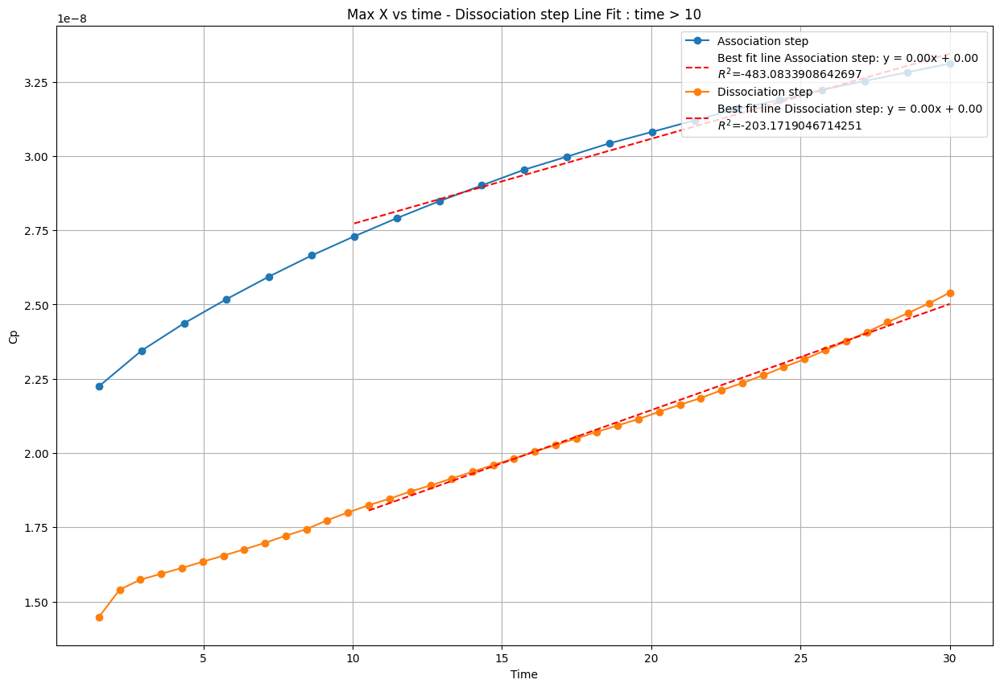

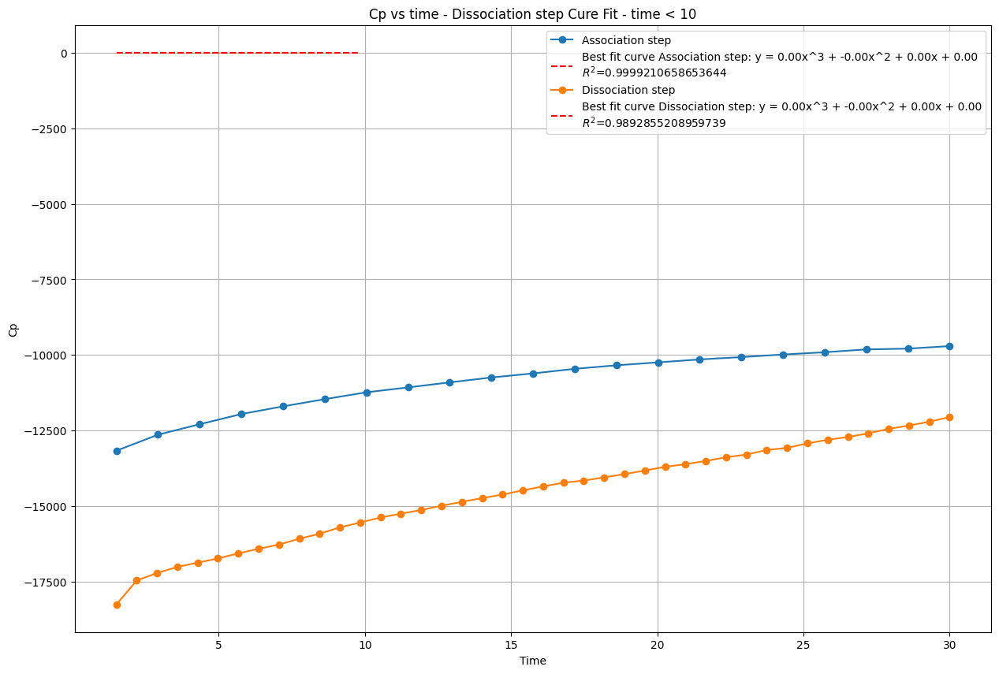

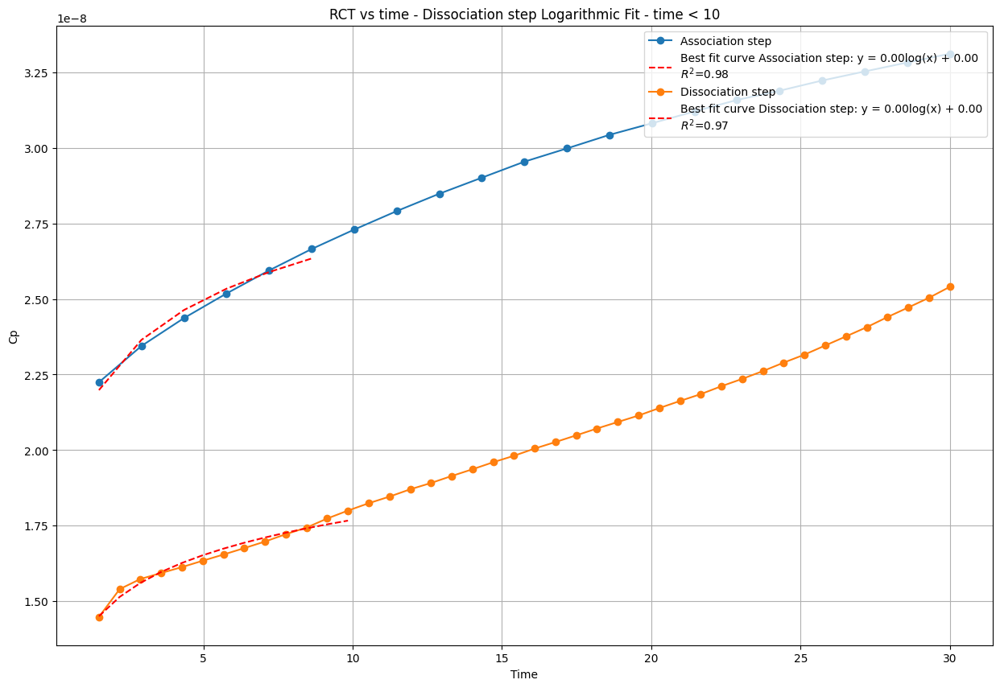

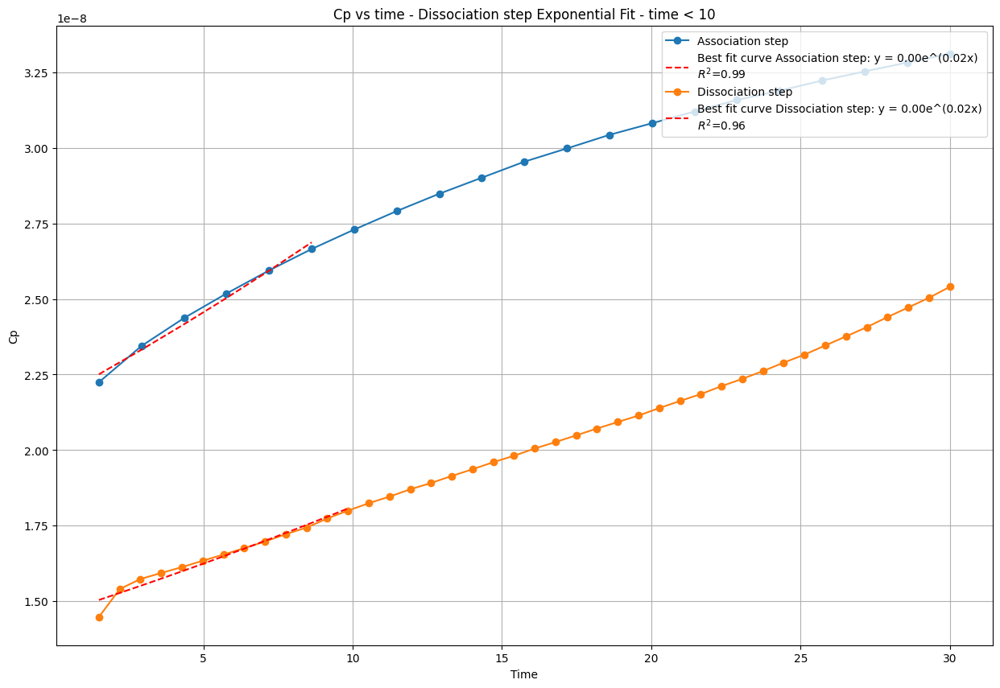

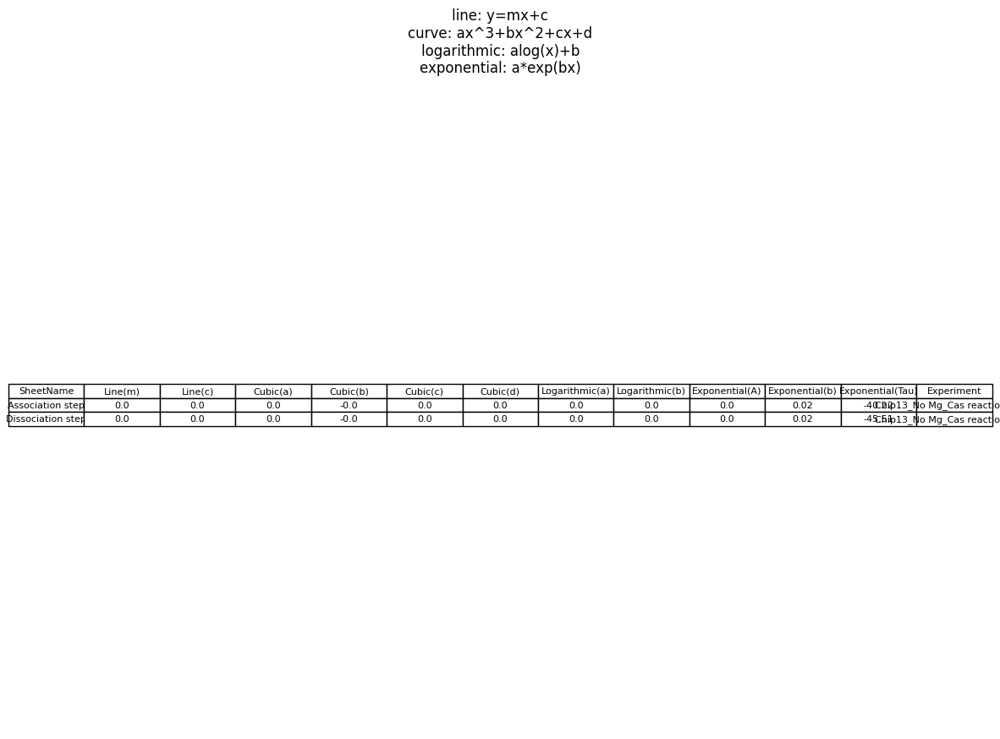

In [9]:
import numpy
from matplotlib.backends.backend_pdf import PdfPages
import tkinter as tk
import matplotlib.pyplot as plt
import matplotlib.pyplot as pltTbl
from openpyxl import load_workbook

#coefficients = pd.DataFrame(columns=['SheetName','Line(m)', 'Line(c)', 'Curve(a)','Curve(b)','Curve(c)','Curve(d)'])
coefficients = {}


splitPoint = 10 #Default value
'''
def get_input():
    global splitPoint 
    print("Input got",entry.get())
    if (int(entry.get()) > 0) & (int(entry.get()) < totalTime):
        splitPoint = int(entry.get())
    #label.config(text="You entered: " + text)
    root.destroy()

root = tk.Tk()
root.title("codeEIS Analysis")

label = tk.Label(root, text=f"Look at the RCT/Time graph in the results_{file_name}.pdf. \nIndicate the time where the graph stops being a curve and becomes a line")
label.pack()

entry = tk.Entry(root)
entry.pack()

button = tk.Button(root, text="Submit", command=get_input)
button.pack()

root.mainloop()
'''
print('splitPoint',splitPoint)

results = pd.read_csv (f'results_{file_name}.csv')
pdfFile = PdfPages(f'resultsCpfit_{file_name}.pdf')
plt.figure(figsize=(15, 10))

# Linear fit of non semicircle part
for sheet_name in results['SheetName'].unique():
    coeffList = []
    slope, intercept = numpy.polyfit(
        results[(results['SheetName'] == sheet_name) & (results['Time'] >= splitPoint)]['Time'], 
        results[(results['SheetName'] == sheet_name) & (results['Time'] >= splitPoint)]['Cp'],1)
    best_fit_line = slope * results[(results['SheetName'] == sheet_name) & (results['Time'] >= splitPoint)]['Time'] + intercept
    valid_diameters = results[(results['SheetName'] == sheet_name) & (results['Time'] >= splitPoint)]['Max X']
    residuals = np.array(valid_diameters) - best_fit_line
    ss_res = np.sum(residuals**2)
    ss_tot = np.sum((valid_diameters - np.mean(valid_diameters))**2)
    r_squared = 1 - (ss_res / ss_tot)
    #print(best_fit_line)
    plt.plot(results[(results['SheetName'] == sheet_name)]['Time'], 
             results[(results['SheetName'] == sheet_name) ]['Cp'], 
             marker='o', linestyle='-', label = f'{sheet_name}')
    plt.plot(results[(results['SheetName'] == sheet_name) & (results['Time'] >= splitPoint)]['Time'], 
             best_fit_line, color='red', linestyle='--', label=f'Best fit line {sheet_name}: y = {slope:.2f}x + {intercept:.2f}\n$R^2$={r_squared}')
    coeffList.append(round(slope,2))
    #coeffList.append('first')
    coeffList.append(round(intercept,2))
    #coeffList.append('second')
    coefficients[sheet_name]=coeffList # Slope and intercept line part of rct vs time- rounded values

plt.xlabel('Time')
plt.ylabel('Cp')
plt.title(f'Max X vs time - {sheet_name} Line Fit : time > {splitPoint}')
#plt.ylim(1000, 6000)
plt.legend(loc='upper right')
plt.grid(True)
pdfFile.savefig()    
plt.show()

# Semicircle fit 
# Cubic fit
plt.figure(figsize=(15,10))
for sheet_name in results['SheetName'].unique():
    #print(sheet_name, results['SheetName'].unique())
    try:
        p = numpy.polyfit(
            results[(results['SheetName'] == sheet_name) & (results['Time'] < splitPoint)]['Time'], 
            results[(results['SheetName'] == sheet_name) & (results['Time'] < splitPoint)]['Cp'],3)
    except numpy.linalg.LinAlgError:
        coefficients[sheet_name].append(0)  # Cubic fit rct vs time
        coefficients[sheet_name].append(0)
        coefficients[sheet_name].append(0)
        coefficients[sheet_name].append(0)
        continue
    
    x_val_dia = results[(results['SheetName'] == sheet_name) & (results['Time'] < splitPoint)]['Time']
    best_fit_curve = p[0]*(x_val_dia)**3 + p[1]*(x_val_dia)**2 + p[2]*x_val_dia + p[3]
    valid_diameters = results[(results['SheetName'] == sheet_name) & (results['Time'] < splitPoint)]['Cp']
    residuals = np.array(valid_diameters) - best_fit_curve
    ss_res = np.sum(residuals**2)
    ss_tot = np.sum((valid_diameters - np.mean(valid_diameters))**2)
    r_squared = 1 - (ss_res / ss_tot)
    
    plt.plot(results[(results['SheetName'] == sheet_name)]['Time'], 
             results[(results['SheetName'] == sheet_name) ]['Max X'], 
             marker='o', linestyle='-', label = f'{sheet_name}')

    plt.plot(results[(results['SheetName'] == sheet_name) & (results['Time'] < splitPoint)]['Time'], 
                    np.polyval(p, results[(results['SheetName'] == sheet_name) & (results['Time'] < splitPoint)]['Time']),
                    color='red', linestyle='--', label=f'Best fit curve {sheet_name}: y = {p[0]:.2f}x^3 + {p[1]:.2f}x^2 + {p[2]:.2f}x + {p[3]:.2f}\n$R^2$={r_squared}')
    coefficients[sheet_name].append(round(p[0],2)) # rounded values - cubic fit rct vs time
    coefficients[sheet_name].append(round(p[1],2))
    coefficients[sheet_name].append(round(p[2],2))
    coefficients[sheet_name].append(round(p[3],2))

plt.xlabel('Time')
plt.ylabel('Cp')
plt.title(f'Cp vs time - {sheet_name} Cure Fit - time < {splitPoint}')
#plt.ylim(1000, 6000)
plt.legend(loc='upper right')
plt.grid(True)
pdfFile.savefig()    
plt.show()

# Logarithmic fit 
plt.figure(figsize=(15,10))
for sheet_name in results['SheetName'].unique():
    # Filter the relevant data
    filtered_data = results[(results['SheetName'] == sheet_name) & (results['Time'] < splitPoint)] # with first val# & (results['Time'] > 1.5)]
    
    # Check if there's any data left after filtering
    if filtered_data.empty:
        coefficients[sheet_name].append(0)
        coefficients[sheet_name].append(0)
        continue
    
    try:
        # Apply logarithmic transformation to the 'Time' data and perform a linear fit
        log_time = np.log(filtered_data['Time'])
        p = np.polyfit(log_time, filtered_data['Cp'], 1)
    except np.linalg.LinAlgError:
        coefficients[sheet_name].append(0) # Logarithmic data for semicircle fit
        coefficients[sheet_name].append(0)
        continue
    
    # Calculate the best fit curve using the logarithmic model
    x_val_dia = filtered_data['Time']
    best_fit_curve = p[0] * np.log(x_val_dia) + p[1]
    
    # Calculate residuals and R-squared
    valid_diameters = filtered_data['Cp']
    residuals = np.array(valid_diameters) - best_fit_curve
    ss_res = np.sum(residuals ** 2)
    ss_tot = np.sum((valid_diameters - np.mean(valid_diameters)) ** 2)
    r_squared = 1 - (ss_res / ss_tot)
    
    # Plot the actual data points
    plt.plot(results[results['SheetName'] == sheet_name]['Time'], 
             results[results['SheetName'] == sheet_name]['Cp'], 
             marker='o', linestyle='-', label=f'{sheet_name}')

    # Plot the logarithmic best fit curve
    plt.plot(filtered_data['Time'], 
             best_fit_curve,
             color='red', linestyle='--',
             label=f'Best fit curve {sheet_name}: y = {p[0]:.2f}log(x) + {p[1]:.2f}\n$R^2$={r_squared:.2f}')
    
    # Store the coefficients
    coefficients[sheet_name].append(round(p[0], 2)/3) # Logarithmic data for semicircle fit - rounded values
    coefficients[sheet_name].append(round(p[1], 2))

plt.xlabel('Time')
plt.ylabel('Cp')
plt.title(f'RCT vs time - {sheet_name} Logarithmic Fit - time < {splitPoint}')
plt.legend(loc='upper right')
plt.grid(True)
pdfFile.savefig()    
plt.show()

# exponential fit 
plt.figure(figsize=(15,10))
for sheet_name in results['SheetName'].unique():
    # Filter the relevant data
    filtered_data = results[(results['SheetName'] == sheet_name) & (results['Time'] < splitPoint)] # with first val# & (results['Time'] > 1.5)]
    
    # Check if there's any data left after filtering
    if filtered_data.empty:
        coefficients[sheet_name].append(0)
        coefficients[sheet_name].append(0)
        coefficients[sheet_name].append(0)
        continue
    
    try:
        # Apply logarithmic transformation to the 'diameter' data and perform a linear fit
        log_diameter = np.log(filtered_data['Cp'])
        p = np.polyfit(filtered_data['Time'], log_diameter, 1)
    except np.linalg.LinAlgError:
        coefficients[sheet_name].append(0)
        coefficients[sheet_name].append(0)
        coefficients[sheet_name].append(0)
        continue
    
    # Calculate the best fit curve using the exponential model
    a = np.exp(p[1])  # Convert ln(a) back to a
    b = p[0]
    x_val_dia = filtered_data['Time']
    best_fit_curve = a * np.exp(b * x_val_dia)
    
    # Calculate residuals and R-squared
    valid_diameters = filtered_data['Cp']
    residuals = np.array(valid_diameters) - best_fit_curve
    ss_res = np.sum(residuals ** 2)
    ss_tot = np.sum((valid_diameters - np.mean(valid_diameters)) ** 2)
    r_squared = 1 - (ss_res / ss_tot)
    
    # Plot the actual data points
    plt.plot(results[results['SheetName'] == sheet_name]['Time'], 
             results[results['SheetName'] == sheet_name]['Cp'], 
             marker='o', linestyle='-', label=f'{sheet_name}')

    # Plot the exponential best fit curve
    plt.plot(filtered_data['Time'], 
             best_fit_curve,
             color='red', linestyle='--',
             label=f'Best fit curve {sheet_name}: y = {a:.2f}e^({b:.2f}x)\n$R^2$={r_squared:.2f}')
    
    # Store the coefficients
    coefficients[sheet_name].append(round(a, 2)) # rounded values - exponential fit for semicircle
    coefficients[sheet_name].append(round(b, 2))
    coefficients[sheet_name].append(round(-1/b, 2))

plt.xlabel('Time')
plt.ylabel('Cp')
plt.title(f'Cp vs time - {sheet_name} Exponential Fit - time < {splitPoint}')
plt.legend(loc='upper right')
plt.grid(True)
pdfFile.savefig()    
plt.show()

prepared_dict = {i: (x[0], x[1][0],x[1][1],x[1][2],x[1][3],x[1][4],x[1][5],x[1][6],x[1][7],x[1][8]
                    ,x[1][9],x[1][10]) for i, x in enumerate(coefficients.items())}
coefficients_df = pd.DataFrame.from_dict(prepared_dict, orient='index',columns=['SheetName','Line(m)', 'Line(c)', 'Cubic(a)','Cubic(b)',
                                                                                'Cubic(c)','Cubic(d)', 'Logarithmic(a)', 'Logarithmic(b)',
                                                                               'Exponential(A)', 'Exponential(b)','Exponential(Tau)'])
coefficients_df['Experiment'] = file_name

header = coefficients_df.columns
table = coefficients_df.to_numpy()
pltTbl.figure(figsize=(15, 10))
pltTbl.title(f'line: y=mx+c\ncurve: ax^3+bx^2+cx+d\nlogarithmic: alog(x)+b\nexponential: a*exp(bx)')
pltTbl.axis("off")
the_table = pltTbl.table(cellText=table, colLabels=header, cellLoc='center', loc='center',fontsize=20)
the_table.auto_set_font_size(False)
the_table.set_fontsize(8)
the_table.scale(1, 1)

pdfFile.savefig()
pltTbl.show()
pltTbl.close()

pdfFile.close()


# Try to append data to the existing Excel file
# Define the path to the Excel file
file_path_for_results = '/Users/deeptabharadwaj/Documents/lab/eis_analysis_code/oct3Onwards_data/' ###important to change

resultpath = f'{file_path_for_results}/output_eis_all_Cp.xlsx'
def save_to_excel(file_path, coefficient_df):
    # Check if the file already exists
    if os.path.exists(file_path):
        # Load existing data
        existing_df = pd.read_excel(file_path)
        # Append new data
        updated_df = pd.concat([existing_df, coefficient_df], ignore_index=True)
        # Save updated data back to the file
        updated_df.to_excel(file_path, index=False)
    else:
        # Save new data to a new file
        coefficient_df.to_excel(file_path, index=False)

save_to_excel(resultpath, coefficients_df)

###  Not needed

In [10]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Function to manually load file
def manualloadfile():
    folderpath = "Users\\AcquisitionStation\\OneDrive - DB, Inc\\Documents\\Electrochemistry\\Chip Test"
    folderpath = "/Users/deeptabharadwaj/Documents/lab/eis_analysis_code/oct3Onwards_data"
    
    root = Tk()
    #root.withdraw()  # Hide the root window
    root.filename = filedialog.askopenfilename(
        initialdir=folderpath, 
        title="Select file", 
        filetypes=(("Excel files", "*.xlsx"),("all files", "*.*"))
    )
    root.destroy()
    return root.filename, pd.ExcelFile(root.filename, engine='openpyxl')

# Load the data
file_path, xls = manualloadfile()

# Extract initial file name without extension
file_name = os.path.splitext(os.path.basename(file_path))[0]

df = pd.read_excel(xls)
df['new_column'] = range(1, len(df) + 1)

# Plotting the histogram
plt.figure(figsize=(8, 6))
bars = plt.bar(df['new_column'], df['Logarithmic(a)'], color='skyblue')

# Adding labels on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), ha='center', va='bottom')

# Adding titles and labels
plt.title('Histogram of Logarithmic Values with expcode Labels')
plt.xlabel('expcode')
plt.ylabel('Logarithmic Value (log10)')

# Display the plot
plt.show()


2024-10-14 08:12:07.567 Python[2100:4872963] +[CATransaction synchronize] called within transaction
2024-10-14 08:12:07.599 Python[2100:4872963] +[CATransaction synchronize] called within transaction
2024-10-14 08:12:15.666 Python[2100:4872963] +[CATransaction synchronize] called within transaction


FileNotFoundError: [Errno 2] No such file or directory: ''

In [33]:
df['Logarithmic(a)']

0    -1.067933e+02
1    -1.342400e+02
2    -1.022100e+02
3    -1.243100e+02
4    -1.730867e+02
          ...     
57   -3.296367e+02
58   -2.759884e+06
59   -3.152933e+02
60   -4.841367e+02
61   -2.720233e+02
Name: Logarithmic(a), Length: 62, dtype: float64